In [1]:
import normflows as nf
import matplotlib.pyplot as plt
import torch
import numpy as np

from fab import FABModel, HamiltonianMonteCarlo, Metropolis
from fab.utils.logging import ListLogger
from fab.utils.plotting import plot_history, plot_contours, plot_marginal_pair
from fab.target_distributions.gmm import GMM
from fab.utils.prioritised_replay_buffer import PrioritisedReplayBuffer
from fab import Trainer, PrioritisedBufferTrainer
from fab.utils.plotting import plot_contours, plot_marginal_pair


from experiments.make_flow import make_wrapped_normflow_realnvp

In [2]:
dim = 2
n_mixes = 40
loc_scaling = 40.0  # scale of the problem (changes how far apart the modes of each Guassian component will be)
log_var_scaling = 1.0 # variance of each Gaussian
seed = 0

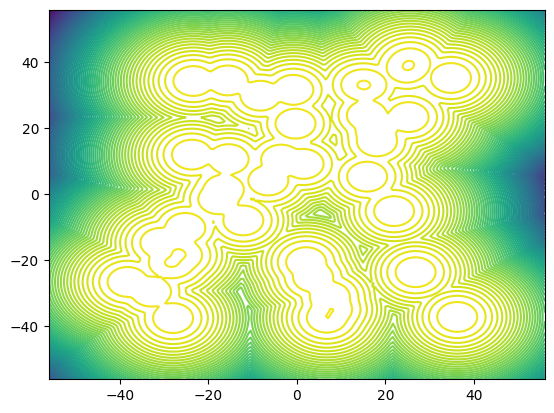

In [3]:
torch.manual_seed(0)  # seed of 0 for GMM problem
target = GMM(dim=dim, n_mixes=n_mixes,
              loc_scaling=loc_scaling, log_var_scaling=log_var_scaling,
              use_gpu=True, true_expectation_estimation_n_samples=int(1e5))
# plot target
target.to("cpu")
fig, ax = plt.subplots()
plotting_bounds = (-loc_scaling * 1.4, loc_scaling * 1.4)
plot_contours(target.log_prob, bounds=plotting_bounds, n_contour_levels=80, ax=ax, grid_width_n_points=200)
target.to("cuda")

In [4]:
# hyper-parameters

# Flow
n_flow_layers = 15
layer_nodes_per_dim = 40
lr = 1e-4
max_gradient_norm = 100.0
batch_size = 128
n_iterations = 4000
n_eval = 10
eval_batch_size = batch_size * 10
n_plots = 10 # number of plots shows throughout tranining
use_64_bit = True
alpha = 2.0

# AIS
# By default we use a simple metropolis mcmc transition with a fixed step size.
# Can switch this to 'hmc' to improve training efficiency. 
transition_operator_type = "metropolis" 
n_intermediate_distributions = 1
metropolis_step_size = 5.0

# buffer config
n_batches_buffer_sampling = 4
maximum_buffer_length = batch_size * n_batches_buffer_sampling * 100
min_buffer_length = batch_size * n_batches_buffer_sampling * 10

# target p^\alpha q^{a-\alpha} as target for AIS. 
min_is_target = True
p_target = not min_is_target # Whether to use p as the target. 
# if use_64_bit:
#     torch.set_default_dtype(torch.float64)
#     target = target.double()
#     print(f"running with 64 bit")

In [5]:
flow = make_wrapped_normflow_realnvp(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = False)

if transition_operator_type == "hmc":
    # very lightweight HMC.
    transition_operator = HamiltonianMonteCarlo(
            n_ais_intermediate_distributions=n_intermediate_distributions,
            dim=dim,
            base_log_prob=flow.log_prob,
            target_log_prob=target.log_prob,
            alpha=alpha,
            p_target=p_target,
        n_outer=1,
        epsilon=1.0, L=5)
elif transition_operator_type == "metropolis":
    transition_operator = Metropolis(            
        n_ais_intermediate_distributions=n_intermediate_distributions,
        dim=dim,
        base_log_prob=flow.log_prob,
        target_log_prob=target.log_prob,
        p_target=p_target,
        alpha=alpha,
        n_updates=1,
        adjust_step_size=False,
        max_step_size=metropolis_step_size, # the same for all metropolis steps 
        min_step_size=metropolis_step_size,
        eval_mode=False,
                                  )
else:
    raise NotImplementedError

# use GPU if available
if torch.cuda.is_available():
    flow.cuda()
    transition_operator.cuda()
    target.to("cuda")
    print(f"Running with GPU")

Running with GPU


/mnt/user_storage/active/lib/python3.9/site-packages/torch/_tensor.py:738: UserWarning: torch.lu is deprecated in favor of torch.linalg.lu_factor / torch.linalg.lu_factor_ex and will be removed in a future PyTorch release.
LU, pivots = torch.lu(A, compute_pivots)
should be replaced with
LU, pivots = torch.linalg.lu_factor(A, compute_pivots)
and
LU, pivots, info = torch.lu(A, compute_pivots, get_infos=True)
should be replaced with
LU, pivots, info = torch.linalg.lu_factor_ex(A, compute_pivots) (Triggered internally at ../aten/src/ATen/native/BatchLinearAlgebra.cpp:1992.)
  LU, pivots, infos = torch._lu_with_info(


In [6]:
fab_model = FABModel(flow=flow,
                     target_distribution=target,
                     n_intermediate_distributions=n_intermediate_distributions,
                     transition_operator=transition_operator,
                     alpha=alpha)
optimizer = torch.optim.Adam(flow.parameters(), lr=lr)
logger = ListLogger(save=False) # save training history

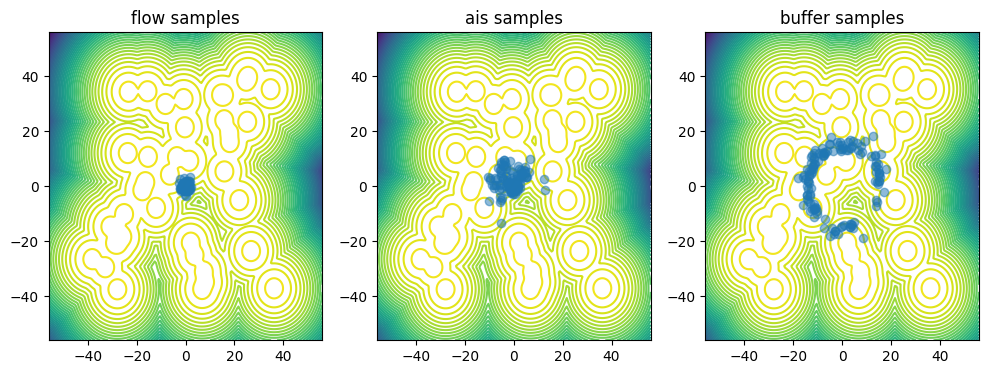

[<Figure size 1200x400 with 3 Axes>]

In [7]:
# Setup buffer.
def initial_sampler():
  # fill replay buffer using initialised model and AIS.
    point, log_w = fab_model.annealed_importance_sampler.sample_and_log_weights(
            batch_size, logging=False)
    return point.x, log_w, point.log_q

buffer = PrioritisedReplayBuffer(dim=dim, max_length=maximum_buffer_length,
                      min_sample_length=min_buffer_length,
                      initial_sampler=initial_sampler)

def plot(fab_model, n_samples = 128):
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    target.to("cpu")
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[0], n_contour_levels=50, grid_width_n_points=200)
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[1], n_contour_levels=50, grid_width_n_points=200)
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[2], n_contour_levels=50, grid_width_n_points=200)
    target.to("cuda")

    # plot flow samples
    samples_flow = fab_model.flow.sample((n_samples,)).detach()
    plot_marginal_pair(samples_flow, ax=axs[0], bounds=plotting_bounds)


    # plot ais samples
    samples_ais = fab_model.annealed_importance_sampler.sample_and_log_weights(n_samples,
                                                                               logging=False)[0].x
    plot_marginal_pair(samples_ais, ax=axs[1], bounds=plotting_bounds)
    
    # plot buffer samples
    samples_buffer = buffer.sample(n_samples)[0].detach()
    plot_marginal_pair(samples_buffer, ax=axs[2], bounds=plotting_bounds)
    
    axs[0].set_title("flow samples")
    axs[1].set_title("ais samples")
    axs[2].set_title("buffer samples")
    plt.show()
    return [fig]

plot(fab_model) # Visualise model during initialisation.

In [8]:
# Setup trainer.
trainer = PrioritisedBufferTrainer(model=fab_model, optimizer=optimizer, 
              logger=logger, plot=plot,
              buffer=buffer, 
              n_batches_buffer_sampling=n_batches_buffer_sampling,
              max_gradient_norm=max_gradient_norm,
              alpha=alpha,
              w_adjust_max_clip=None)

loss: 0.01741720363497734, ess base: 0.009117543697357178,ess ais: 0.0078125:   0%|          | 0/4000 [00:00<?, ?it/s]/home/ray/Joey-Dev/active_inference/fab/utils/numerical.py:59: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3614.)
  expectation = normalised_importance_weights.T @ function_values


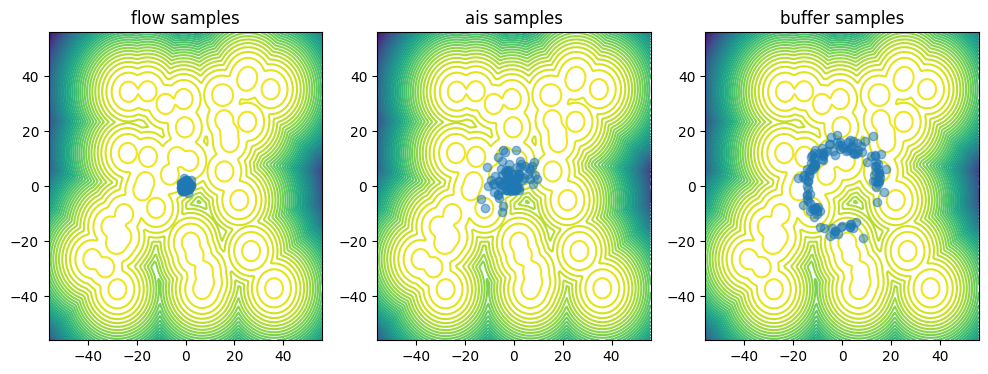

loss: 4.299797534942627, ess base: 0.07147316634654999,ess ais: 0.03441939502954483:   1%|          | 21/4000 [00:07<13:21,  4.96it/s]      

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.02912712097168, ess base: 0.036635544151067734,ess ais: 0.019601821899414062:   1%|          | 23/4000 [00:07<13:18,  4.98it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 5.380253791809082, ess base: 0.015710245817899704,ess ais: 0.008244840428233147:   1%|          | 24/4000 [00:07<13:17,  4.99it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.0517730712890625, ess base: 0.06334763020277023,ess ais: 0.0215500146150589:   1%|          | 26/4000 [00:08<13:13,  5.01it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.
8 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.134661674499512, ess base: 0.07262628525495529,ess ais: 0.02457651123404503:   1%|          | 28/4000 [00:08<13:11,  5.02it/s]  

6 nan/inf samples/log-probs/log-weights encountered at chain init.
7 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.304715156555176, ess base: 0.02150016650557518,ess ais: 0.01626867987215519:   1%|          | 30/4000 [00:09<13:18,  4.97it/s] 

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.119600296020508, ess base: 0.014065876603126526,ess ais: 0.008198016323149204:   1%|          | 31/4000 [00:09<13:27,  4.92it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.107366561889648, ess base: 0.02976827695965767,ess ais: 0.011443627066910267:   1%|          | 32/4000 [00:09<13:32,  4.88it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.68398380279541, ess base: 0.016138575971126556,ess ais: 0.00829908438026905:   1%|          | 33/4000 [00:09<13:32,  4.89it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.530526161193848, ess base: 0.06028216704726219,ess ais: 0.013465558178722858:   1%|          | 34/4000 [00:09<13:40,  4.84it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.204558372497559, ess base: 0.012875019572675228,ess ais: 0.008602232672274113:   1%|          | 35/4000 [00:10<13:28,  4.90it/s]

7 nan/inf samples/log-probs/log-weights encountered at chain init.
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.51019287109375, ess base: 0.00996868684887886,ess ais: 0.008154965937137604:   1%|          | 37/4000 [00:10<13:17,  4.97it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.
5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.485687255859375, ess base: 0.024508584290742874,ess ais: 0.01980767399072647:   1%|          | 39/4000 [00:10<13:26,  4.91it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.927398204803467, ess base: 0.059319380670785904,ess ais: 0.017782988026738167:   1%|          | 40/4000 [00:11<13:27,  4.90it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.547619819641113, ess base: 0.10768961906433105,ess ais: 0.029423242434859276:   1%|          | 41/4000 [00:11<13:28,  4.90it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.69782829284668, ess base: 0.05973011627793312,ess ais: 0.018578406423330307:   1%|          | 42/4000 [00:11<13:33,  4.86it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.024974822998047, ess base: 0.034255363047122955,ess ais: 0.014285799115896225:   1%|          | 43/4000 [00:11<13:43,  4.81it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.607020378112793, ess base: 0.031324539333581924,ess ais: 0.014483552426099777:   1%|          | 45/4000 [00:12<13:42,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.8530073165893555, ess base: 0.08570556342601776,ess ais: 0.018650149926543236:   1%|          | 46/4000 [00:12<13:38,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.749560832977295, ess base: 0.09461002796888351,ess ais: 0.04142723232507706:   1%|          | 47/4000 [00:12<13:38,  4.83it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.702334403991699, ess base: 0.10328353941440582,ess ais: 0.03955049440264702:   1%|          | 48/4000 [00:12<13:37,  4.83it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.868252277374268, ess base: 0.024268584325909615,ess ais: 0.008660167455673218:   1%|          | 49/4000 [00:12<13:38,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.852291107177734, ess base: 0.052139680832624435,ess ais: 0.019603485241532326:   1%|▏         | 50/4000 [00:13<13:37,  4.83it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.117270469665527, ess base: 0.1077064797282219,ess ais: 0.03140006214380264:   1%|▏         | 51/4000 [00:13<13:35,  4.85it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.700436115264893, ess base: 0.12571510672569275,ess ais: 0.0584595650434494:   1%|▏         | 52/4000 [00:13<13:36,  4.84it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.584046363830566, ess base: 0.056026287376880646,ess ais: 0.012448208406567574:   1%|▏         | 53/4000 [00:13<13:35,  4.84it/s]

7 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.807708740234375, ess base: 0.05792485922574997,ess ais: 0.014278395101428032:   1%|▏         | 54/4000 [00:13<13:35,  4.84it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.0801801681518555, ess base: 0.05909598991274834,ess ais: 0.02477969415485859:   1%|▏         | 55/4000 [00:14<13:42,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.168288230895996, ess base: 0.009169402532279491,ess ais: 0.007890417240560055:   1%|▏         | 56/4000 [00:14<14:04,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.84703254699707, ess base: 0.014386104419827461,ess ais: 0.00812085997313261:   1%|▏         | 57/4000 [00:14<13:59,  4.70it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 6.954409599304199, ess base: 0.045888107270002365,ess ais: 0.017059439793229103:   1%|▏         | 58/4000 [00:14<14:07,  4.65it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.192167282104492, ess base: 0.01808333396911621,ess ais: 0.015243122354149818:   1%|▏         | 59/4000 [00:15<13:59,  4.69it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.2237091064453125, ess base: 0.034300148487091064,ess ais: 0.018967757001519203:   2%|▏         | 60/4000 [00:15<13:51,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.295438289642334, ess base: 0.04149315506219864,ess ais: 0.011490771546959877:   2%|▏         | 61/4000 [00:15<13:45,  4.77it/s]  

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.156688213348389, ess base: 0.08389225602149963,ess ais: 0.04000132158398628:   2%|▏         | 62/4000 [00:15<13:35,  4.83it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.064541816711426, ess base: 0.03506632521748543,ess ais: 0.008831906132400036:   2%|▏         | 64/4000 [00:16<13:16,  4.94it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.725912570953369, ess base: 0.08204644918441772,ess ais: 0.02298879623413086:   2%|▏         | 66/4000 [00:16<13:07,  4.99it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.658130168914795, ess base: 0.04427827149629593,ess ais: 0.01041159313172102:   2%|▏         | 68/4000 [00:16<13:04,  5.01it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.458102226257324, ess base: 0.04906447231769562,ess ais: 0.014613892883062363:   2%|▏         | 70/4000 [00:17<13:00,  5.04it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.521844387054443, ess base: 0.057411078363657,ess ais: 0.029342738911509514:   2%|▏         | 72/4000 [00:17<12:58,  5.04it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.515998840332031, ess base: 0.021054629236459732,ess ais: 0.008639730513095856:   2%|▏         | 74/4000 [00:18<13:03,  5.01it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.579591274261475, ess base: 0.02559634856879711,ess ais: 0.00865103118121624:   2%|▏         | 76/4000 [00:18<13:06,  4.99it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.112564086914062, ess base: 0.03319862484931946,ess ais: 0.010309736244380474:   2%|▏         | 77/4000 [00:18<13:09,  4.97it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.734840393066406, ess base: 0.05105067044496536,ess ais: 0.022022584453225136:   2%|▏         | 78/4000 [00:18<13:14,  4.94it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.7506890296936035, ess base: 0.01558648981153965,ess ais: 0.008040581829845905:   2%|▏         | 79/4000 [00:19<13:30,  4.84it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.987966060638428, ess base: 0.03863848000764847,ess ais: 0.009484083391726017:   2%|▏         | 80/4000 [00:19<13:36,  4.80it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.512838363647461, ess base: 0.07304184138774872,ess ais: 0.025444740429520607:   2%|▏         | 81/4000 [00:19<13:35,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.063155174255371, ess base: 0.1017666831612587,ess ais: 0.030237747356295586:   2%|▏         | 82/4000 [00:19<13:39,  4.78it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.7737321853637695, ess base: 0.08387347310781479,ess ais: 0.01911485381424427:   2%|▏         | 83/4000 [00:19<13:45,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.769667148590088, ess base: 0.0883137583732605,ess ais: 0.029622666537761688:   2%|▏         | 84/4000 [00:20<13:43,  4.76it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.720163345336914, ess base: 0.053158536553382874,ess ais: 0.007936508394777775:   2%|▏         | 85/4000 [00:20<13:38,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.996393203735352, ess base: 0.03568210452795029,ess ais: 0.00922311283648014:   2%|▏         | 86/4000 [00:20<13:37,  4.79it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.180288314819336, ess base: 0.09043340384960175,ess ais: 0.029324322938919067:   2%|▏         | 87/4000 [00:20<13:36,  4.79it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.8998212814331055, ess base: 0.08223594725131989,ess ais: 0.02218206599354744:   2%|▏         | 88/4000 [00:20<13:37,  4.79it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.835060119628906, ess base: 0.06283832341432571,ess ais: 0.027920199558138847:   2%|▏         | 89/4000 [00:21<13:36,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.976692199707031, ess base: 0.08633150905370712,ess ais: 0.024194151163101196:   2%|▏         | 90/4000 [00:21<13:34,  4.80it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.167126655578613, ess base: 0.06723026186227798,ess ais: 0.018959220498800278:   2%|▏         | 91/4000 [00:21<13:37,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.290980339050293, ess base: 0.03705925494432449,ess ais: 0.015649553388357162:   2%|▏         | 92/4000 [00:21<13:33,  4.80it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.901065826416016, ess base: 0.058260902762413025,ess ais: 0.013290145434439182:   2%|▏         | 93/4000 [00:21<13:36,  4.78it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.538619041442871, ess base: 0.03743918985128403,ess ais: 0.010810056701302528:   2%|▏         | 95/4000 [00:22<13:32,  4.80it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.008390426635742, ess base: 0.06675045937299728,ess ais: 0.016048524528741837:   2%|▏         | 96/4000 [00:22<13:32,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.162751197814941, ess base: 0.04788198694586754,ess ais: 0.019288446754217148:   2%|▏         | 97/4000 [00:22<13:30,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.938459396362305, ess base: 0.09964153915643692,ess ais: 0.023409202694892883:   2%|▏         | 98/4000 [00:23<13:31,  4.81it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.990299701690674, ess base: 0.06555779278278351,ess ais: 0.017124852165579796:   2%|▏         | 99/4000 [00:23<13:31,  4.81it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.899812698364258, ess base: 0.0967915877699852,ess ais: 0.020670870319008827:   2%|▎         | 100/4000 [00:23<13:32,  4.80it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.439748764038086, ess base: 0.10804595053195953,ess ais: 0.04180479049682617:   3%|▎         | 101/4000 [00:23<13:31,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.134820938110352, ess base: 0.0384444035589695,ess ais: 0.01314763817936182:   3%|▎         | 102/4000 [00:23<13:29,  4.81it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.961481094360352, ess base: 0.14600694179534912,ess ais: 0.06271473318338394:   3%|▎         | 104/4000 [00:24<13:29,  4.81it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.243509292602539, ess base: 0.06329403072595596,ess ais: 0.01587938517332077:   3%|▎         | 106/4000 [00:24<13:32,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.16552448272705, ess base: 0.10300315916538239,ess ais: 0.057753052562475204:   3%|▎         | 107/4000 [00:24<13:48,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.008872032165527, ess base: 0.08640151470899582,ess ais: 0.009718500077724457:   3%|▎         | 108/4000 [00:25<13:42,  4.73it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.140785217285156, ess base: 0.07186592370271683,ess ais: 0.03067075088620186:   3%|▎         | 109/4000 [00:25<13:40,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.427611351013184, ess base: 0.11831267923116684,ess ais: 0.04163613170385361:   3%|▎         | 110/4000 [00:25<13:38,  4.75it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.130510330200195, ess base: 0.11203951388597488,ess ais: 0.04531767964363098:   3%|▎         | 111/4000 [00:25<13:42,  4.73it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.382615089416504, ess base: 0.13428255915641785,ess ais: 0.05907653272151947:   3%|▎         | 112/4000 [00:25<13:36,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.058710098266602, ess base: 0.13211819529533386,ess ais: 0.05612035468220711:   3%|▎         | 113/4000 [00:26<13:34,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.159364700317383, ess base: 0.12551406025886536,ess ais: 0.03674875572323799:   3%|▎         | 114/4000 [00:26<13:32,  4.78it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.226540565490723, ess base: 0.13200190663337708,ess ais: 0.04245397448539734:   3%|▎         | 116/4000 [00:26<13:35,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.64006233215332, ess base: 0.09745481610298157,ess ais: 0.03313998505473137:   3%|▎         | 117/4000 [00:27<13:36,  4.75it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.280868530273438, ess base: 0.1305702179670334,ess ais: 0.054587312042713165:   3%|▎         | 118/4000 [00:27<13:34,  4.76it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.514116287231445, ess base: 0.1365182101726532,ess ais: 0.04350212588906288:   3%|▎         | 119/4000 [00:27<13:40,  4.73it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.325820922851562, ess base: 0.2201576679944992,ess ais: 0.11880821734666824:   3%|▎         | 120/4000 [00:27<13:46,  4.69it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.836878299713135, ess base: 0.046805255115032196,ess ais: 0.010297451168298721:   3%|▎         | 121/4000 [00:27<13:43,  4.71it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.353494644165039, ess base: 0.12323886901140213,ess ais: 0.03342045471072197:   3%|▎         | 122/4000 [00:28<13:39,  4.73it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.006303787231445, ess base: 0.17785750329494476,ess ais: 0.05630720406770706:   3%|▎         | 123/4000 [00:28<13:36,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.553828239440918, ess base: 0.19729697704315186,ess ais: 0.10346198827028275:   3%|▎         | 126/4000 [00:28<13:31,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.924406051635742, ess base: 0.06824256479740143,ess ais: 0.01893502101302147:   3%|▎         | 127/4000 [00:29<13:35,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 61.735130310058594, ess base: 0.12426192313432693,ess ais: 0.03935425356030464:   3%|▎         | 128/4000 [00:29<13:35,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 95072.4453125, ess base: 0.08943288773298264,ess ais: 0.008035236038267612:   3%|▎         | 129/4000 [00:29<13:31,  4.77it/s]    

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.805201053619385, ess base: 0.1542281061410904,ess ais: 0.0717792809009552:   3%|▎         | 131/4000 [00:29<13:36,  4.74it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.14424991607666, ess base: 0.1017669215798378,ess ais: 0.015262986533343792:   3%|▎         | 132/4000 [00:30<13:37,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.216590881347656, ess base: 0.22579871118068695,ess ais: 0.14541390538215637:   3%|▎         | 133/4000 [00:30<13:33,  4.75it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.840517044067383, ess base: 0.12961570918560028,ess ais: 0.04517003521323204:   3%|▎         | 134/4000 [00:30<13:30,  4.77it/s] 

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.206709861755371, ess base: 0.09310535341501236,ess ais: 0.02484048530459404:   3%|▎         | 135/4000 [00:30<13:28,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.369253158569336, ess base: 0.1495654433965683,ess ais: 0.054358430206775665:   3%|▎         | 136/4000 [00:31<13:25,  4.80it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.582839965820312, ess base: 0.1618005335330963,ess ais: 0.06773743033409119:   3%|▎         | 137/4000 [00:31<13:20,  4.82it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.265586853027344, ess base: 0.1938020884990692,ess ais: 0.07630638033151627:   3%|▎         | 138/4000 [00:31<13:18,  4.84it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.262185096740723, ess base: 0.20079173147678375,ess ais: 0.07179871201515198:   4%|▎         | 140/4000 [00:31<13:20,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.466904640197754, ess base: 0.06515693664550781,ess ais: 0.01138150505721569:   4%|▎         | 141/4000 [00:32<13:22,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.646966934204102, ess base: 0.2257784605026245,ess ais: 0.10732296854257584:   4%|▎         | 142/4000 [00:32<13:27,  4.78it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.262819290161133, ess base: 0.11397551745176315,ess ais: 0.051711294800043106:   4%|▎         | 143/4000 [00:32<13:24,  4.80it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.106658935546875, ess base: 0.15932533144950867,ess ais: 0.0775851458311081:   4%|▎         | 144/4000 [00:32<13:23,  4.80it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.411966323852539, ess base: 0.13742856681346893,ess ais: 0.034361548721790314:   4%|▎         | 145/4000 [00:32<13:33,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.703431129455566, ess base: 0.2335481494665146,ess ais: 0.06358635425567627:   4%|▎         | 146/4000 [00:33<13:47,  4.66it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.176656723022461, ess base: 0.11761903762817383,ess ais: 0.020902978256344795:   4%|▎         | 147/4000 [00:33<13:43,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.521291732788086, ess base: 0.19801385700702667,ess ais: 0.06586779654026031:   4%|▎         | 148/4000 [00:33<13:41,  4.69it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.253019332885742, ess base: 0.11026319116353989,ess ais: 0.03429865837097168:   4%|▎         | 149/4000 [00:33<13:45,  4.66it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.405509948730469, ess base: 0.13030031323432922,ess ais: 0.038896847516298294:   4%|▍         | 150/4000 [00:33<13:46,  4.66it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.173982620239258, ess base: 0.07688848674297333,ess ais: 0.013356604613363743:   4%|▍         | 152/4000 [00:34<13:49,  4.64it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.337018966674805, ess base: 0.08224008977413177,ess ais: 0.022541115060448647:   4%|▍         | 153/4000 [00:34<13:46,  4.65it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.861148834228516, ess base: 0.024709336459636688,ess ais: 0.00842875987291336:   4%|▍         | 155/4000 [00:35<14:03,  4.56it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.465910911560059, ess base: 0.22475266456604004,ess ais: 0.06472764909267426:   4%|▍         | 156/4000 [00:35<13:59,  4.58it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.86030387878418, ess base: 0.08012877404689789,ess ais: 0.017119726166129112:   4%|▍         | 158/4000 [00:35<13:47,  4.65it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.099618911743164, ess base: 0.1530856043100357,ess ais: 0.06425193697214127:   4%|▍         | 159/4000 [00:35<13:41,  4.68it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.043647766113281, ess base: 0.07076052576303482,ess ais: 0.011248990893363953:   4%|▍         | 160/4000 [00:36<13:38,  4.69it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.161029815673828, ess base: 0.14262636005878448,ess ais: 0.048008114099502563:   4%|▍         | 161/4000 [00:36<13:35,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.149961471557617, ess base: 0.18746262788772583,ess ais: 0.07433223724365234:   4%|▍         | 163/4000 [00:36<13:31,  4.73it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.372021675109863, ess base: 0.1935843825340271,ess ais: 0.07505161315202713:   4%|▍         | 165/4000 [00:37<13:26,  4.75it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.243171691894531, ess base: 0.18885265290737152,ess ais: 0.05770548805594444:   4%|▍         | 168/4000 [00:37<13:28,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.256230354309082, ess base: 0.11389990895986557,ess ais: 0.007874015718698502:   4%|▍         | 169/4000 [00:38<13:26,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.029738426208496, ess base: 0.21272437274456024,ess ais: 0.09525792300701141:   4%|▍         | 170/4000 [00:38<13:34,  4.70it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9156575202941895, ess base: 0.17858585715293884,ess ais: 0.068282350897789:   4%|▍         | 171/4000 [00:38<13:29,  4.73it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.878116607666016, ess base: 0.1919935643672943,ess ais: 0.007936508394777775:   4%|▍         | 173/4000 [00:38<13:24,  4.76it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.56025218963623, ess base: 0.14630809426307678,ess ais: 0.03081497736275196:   4%|▍         | 174/4000 [00:39<13:18,  4.79it/s] 

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.515868186950684, ess base: 0.16390205919742584,ess ais: 0.06044640392065048:   4%|▍         | 175/4000 [00:39<13:14,  4.81it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.260382652282715, ess base: 0.1820765882730484,ess ais: 0.05983230471611023:   4%|▍         | 176/4000 [00:39<13:13,  4.82it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1477421.25, ess base: 0.15293222665786743,ess ais: 0.008130080997943878:   4%|▍         | 177/4000 [00:39<13:09,  4.84it/s]     

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.449644088745117, ess base: 0.10575263947248459,ess ais: 0.01670588180422783:   4%|▍         | 178/4000 [00:39<13:12,  4.82it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.341951370239258, ess base: 0.23539534211158752,ess ais: 0.10913757234811783:   4%|▍         | 179/4000 [00:40<13:14,  4.81it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.21944808959961, ess base: 0.19465234875679016,ess ais: 0.0760028064250946:   4%|▍         | 180/4000 [00:40<13:11,  4.83it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.982616424560547, ess base: 0.19276206195354462,ess ais: 0.04629070684313774:   5%|▍         | 183/4000 [00:40<13:18,  4.78it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 24.088054656982422, ess base: 0.059947483241558075,ess ais: 0.010814672335982323:   5%|▍         | 185/4000 [00:41<13:15,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.380531311035156, ess base: 0.2270059436559677,ess ais: 0.09427721053361893:   5%|▍         | 186/4000 [00:41<13:22,  4.75it/s]    

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.207013130187988, ess base: 0.16457243263721466,ess ais: 0.05070054158568382:   5%|▍         | 187/4000 [00:41<13:26,  4.73it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.156302452087402, ess base: 0.17824748158454895,ess ais: 0.07958529889583588:   5%|▍         | 188/4000 [00:41<13:28,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.039052963256836, ess base: 0.18987531960010529,ess ais: 0.03765980526804924:   5%|▍         | 189/4000 [00:42<13:24,  4.74it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.175552368164062, ess base: 0.1413104236125946,ess ais: 0.02847696654498577:   5%|▍         | 190/4000 [00:42<13:29,  4.71it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.614377975463867, ess base: 0.054733142256736755,ess ais: 0.013418871909379959:   5%|▍         | 191/4000 [00:42<13:28,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.18927001953125, ess base: 0.14453016221523285,ess ais: 0.02362779900431633:   5%|▍         | 192/4000 [00:42<13:25,  4.73it/s]   

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.777690887451172, ess base: 0.1122981533408165,ess ais: 0.028953492641448975:   5%|▍         | 193/4000 [00:43<13:20,  4.76it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.66851806640625, ess base: 0.21671681106090546,ess ais: 0.09562962502241135:   5%|▍         | 194/4000 [00:43<13:17,  4.77it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.384164810180664, ess base: 0.21277862787246704,ess ais: 0.0870809555053711:   5%|▍         | 195/4000 [00:43<13:13,  4.79it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.177616119384766, ess base: 0.15304912626743317,ess ais: 0.03527422621846199:   5%|▍         | 196/4000 [00:43<13:11,  4.80it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.436378479003906, ess base: 0.2349938005208969,ess ais: 0.1236782893538475:   5%|▍         | 197/4000 [00:43<13:10,  4.81it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.342175483703613, ess base: 0.18585890531539917,ess ais: 0.06668766587972641:   5%|▍         | 198/4000 [00:44<13:14,  4.78it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.36544132232666, ess base: 0.09683258831501007,ess ais: 0.014145086519420147:   5%|▌         | 200/4000 [00:44<13:16,  4.77it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.435007095336914, ess base: 0.03301682323217392,ess ais: 0.009035651572048664:   5%|▌         | 201/4000 [00:44<13:19,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.321151733398438, ess base: 0.13167279958724976,ess ais: 0.027003761380910873:   5%|▌         | 203/4000 [00:45<13:35,  4.65it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.962838172912598, ess base: 0.20802414417266846,ess ais: 0.05063783377408981:   5%|▌         | 204/4000 [00:45<13:49,  4.58it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.954380989074707, ess base: 0.1481848657131195,ess ais: 0.022332048043608665:   5%|▌         | 205/4000 [00:45<13:46,  4.59it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.672342300415039, ess base: 0.19972944259643555,ess ais: 0.1113680824637413:   5%|▌         | 206/4000 [00:45<13:36,  4.65it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.510189056396484, ess base: 0.2200070321559906,ess ais: 0.09951283037662506:   5%|▌         | 207/4000 [00:46<13:30,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.364513397216797, ess base: 0.19333910942077637,ess ais: 0.05568700656294823:   5%|▌         | 208/4000 [00:46<13:27,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.697218894958496, ess base: 0.16037771105766296,ess ais: 0.030492078512907028:   5%|▌         | 209/4000 [00:46<13:25,  4.71it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.861894130706787, ess base: 0.1788647174835205,ess ais: 0.07156292349100113:   5%|▌         | 211/4000 [00:46<13:20,  4.74it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.933687210083008, ess base: 0.14513401687145233,ess ais: 0.0345626026391983:   5%|▌         | 212/4000 [00:47<13:17,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.734537124633789, ess base: 0.18674661219120026,ess ais: 0.061173051595687866:   5%|▌         | 213/4000 [00:47<13:16,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 40686.203125, ess base: 0.1802467256784439,ess ais: 0.08102001249790192:   5%|▌         | 215/4000 [00:47<13:17,  4.74it/s]       

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.180805206298828, ess base: 0.13231784105300903,ess ais: 0.051559023559093475:   5%|▌         | 216/4000 [00:47<13:14,  4.77it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.058563232421875, ess base: 0.16012577712535858,ess ais: 0.0539698600769043:   5%|▌         | 217/4000 [00:48<13:11,  4.78it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.444031715393066, ess base: 0.21203066408634186,ess ais: 0.0816865861415863:   5%|▌         | 218/4000 [00:48<13:11,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.055158615112305, ess base: 0.18398138880729675,ess ais: 0.03900724649429321:   5%|▌         | 219/4000 [00:48<13:09,  4.79it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.113068580627441, ess base: 0.2638815641403198,ess ais: 0.13714896142482758:   6%|▌         | 220/4000 [00:48<13:10,  4.78it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.189035415649414, ess base: 0.3133240342140198,ess ais: 0.18190042674541473:   6%|▌         | 221/4000 [00:48<13:12,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.071982383728027, ess base: 0.05554526671767235,ess ais: 0.00984408613294363:   6%|▌         | 223/4000 [00:49<13:10,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.770503997802734, ess base: 0.21039707958698273,ess ais: 0.11990086734294891:   6%|▌         | 225/4000 [00:49<13:08,  4.78it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.988781929016113, ess base: 0.23278236389160156,ess ais: 0.08338574320077896:   6%|▌         | 226/4000 [00:50<13:08,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.393091201782227, ess base: 0.11578486859798431,ess ais: 0.017702503129839897:   6%|▌         | 227/4000 [00:50<13:09,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.144124031066895, ess base: 0.19803623855113983,ess ais: 0.09996538609266281:   6%|▌         | 228/4000 [00:50<13:08,  4.79it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.094261169433594, ess base: 0.17530936002731323,ess ais: 0.08364301174879074:   6%|▌         | 229/4000 [00:50<13:07,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.911258697509766, ess base: 0.27895694971084595,ess ais: 0.10906469076871872:   6%|▌         | 230/4000 [00:50<13:06,  4.79it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.251893997192383, ess base: 0.24175404012203217,ess ais: 0.09928037226200104:   6%|▌         | 231/4000 [00:51<13:02,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.351940155029297, ess base: 0.12767095863819122,ess ais: 0.018764540553092957:   6%|▌         | 232/4000 [00:51<13:01,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.198068618774414, ess base: 0.15167297422885895,ess ais: 0.03400588035583496:   6%|▌         | 233/4000 [00:51<13:01,  4.82it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.382255554199219, ess base: 0.1708722710609436,ess ais: 0.057521626353263855:   6%|▌         | 234/4000 [00:51<13:01,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.963601112365723, ess base: 0.17856961488723755,ess ais: 0.09364353865385056:   6%|▌         | 235/4000 [00:51<13:00,  4.82it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.008196830749512, ess base: 0.28779739141464233,ess ais: 0.11922135204076767:   6%|▌         | 236/4000 [00:52<12:58,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.941572189331055, ess base: 0.15837305784225464,ess ais: 0.02049075812101364:   6%|▌         | 237/4000 [00:52<12:54,  4.86it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.945279121398926, ess base: 0.17238271236419678,ess ais: 0.05478488653898239:   6%|▌         | 238/4000 [00:52<12:48,  4.89it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.775367736816406, ess base: 0.21689102053642273,ess ais: 0.11974033713340759:   6%|▌         | 240/4000 [00:52<12:39,  4.95it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.383995056152344, ess base: 0.22850929200649261,ess ais: 0.10791958123445511:   6%|▌         | 242/4000 [00:53<12:41,  4.93it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.926804542541504, ess base: 0.1473338007926941,ess ais: 0.022267203778028488:   6%|▌         | 243/4000 [00:53<12:40,  4.94it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.018367767333984, ess base: 0.05868273973464966,ess ais: 0.009932032786309719:   6%|▌         | 244/4000 [00:53<12:38,  4.95it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.628211975097656, ess base: 0.1916339248418808,ess ais: 0.054484300315380096:   6%|▌         | 246/4000 [00:54<12:37,  4.96it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.755098342895508, ess base: 0.33468979597091675,ess ais: 0.2077120542526245:   6%|▌         | 247/4000 [00:54<12:41,  4.93it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.159170150756836, ess base: 0.22326694428920746,ess ais: 0.08392185717821121:   6%|▌         | 248/4000 [00:54<12:42,  4.92it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.556525230407715, ess base: 0.24042965471744537,ess ais: 0.0918116346001625:   6%|▌         | 249/4000 [00:54<12:40,  4.93it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.185073852539062, ess base: 0.22347846627235413,ess ais: 0.11354967951774597:   6%|▋         | 251/4000 [00:55<12:42,  4.92it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.126421928405762, ess base: 0.13715781271457672,ess ais: 0.01845882087945938:   6%|▋         | 254/4000 [00:55<12:42,  4.91it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.632898330688477, ess base: 0.23345908522605896,ess ais: 0.007936508394777775:   6%|▋         | 255/4000 [00:55<12:14,  5.10it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.485326766967773, ess base: 0.2559311091899872,ess ais: 0.14310579001903534:   6%|▋         | 257/4000 [00:56<12:25,  5.02it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.306922912597656, ess base: 0.22868968546390533,ess ais: 0.11916812509298325:   6%|▋         | 258/4000 [00:56<12:30,  4.99it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.735373497009277, ess base: 0.16885749995708466,ess ais: 0.0599767304956913:   6%|▋         | 259/4000 [00:56<12:34,  4.96it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.099584579467773, ess base: 0.23987965285778046,ess ais: 0.0658087208867073:   6%|▋         | 260/4000 [00:56<12:15,  5.09it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.367622375488281, ess base: 0.1970834881067276,ess ais: 0.09552504122257233:   7%|▋         | 261/4000 [00:57<12:00,  5.19it/s]

nan loss in replay step
nan loss in replay step


loss: inf, ess base: 0.19929185509681702,ess ais: 0.09320815652608871:   7%|▋         | 263/4000 [00:57<11:42,  5.32it/s]              

nan loss in replay step


loss: 8.486928939819336, ess base: 0.14725655317306519,ess ais: 0.023697473108768463:   7%|▋         | 265/4000 [00:57<12:03,  5.16it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.631595611572266, ess base: 0.07513381540775299,ess ais: 0.01160056795924902:   7%|▋         | 266/4000 [00:58<11:53,  5.23it/s] 

nan loss in replay step


loss: 8.36039924621582, ess base: 0.1589500606060028,ess ais: 0.04076365754008293:   7%|▋         | 268/4000 [00:58<12:23,  5.02it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.547924041748047, ess base: 0.25945794582366943,ess ais: 0.12390528619289398:   7%|▋         | 269/4000 [00:58<12:03,  5.16it/s]

nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.66818618774414, ess base: 0.28219354152679443,ess ais: 0.18642491102218628:   7%|▋         | 272/4000 [00:59<12:09,  5.11it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.159103393554688, ess base: 0.2203618437051773,ess ais: 0.04426043853163719:   7%|▋         | 273/4000 [00:59<12:15,  5.07it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.415088653564453, ess base: 0.22733967006206512,ess ais: 0.10194894671440125:   7%|▋         | 274/4000 [00:59<12:00,  5.17it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.343802452087402, ess base: 0.2610752284526825,ess ais: 0.09974687546491623:   7%|▋         | 276/4000 [01:00<12:07,  5.12it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.287513732910156, ess base: 0.20536917448043823,ess ais: 0.05724409595131874:   7%|▋         | 278/4000 [01:00<12:25,  4.99it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.935774803161621, ess base: 0.21985940635204315,ess ais: 0.06908725947141647:   7%|▋         | 279/4000 [01:00<12:31,  4.95it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.2387906312942505,ess ais: 0.11256388574838638:   7%|▋         | 282/4000 [01:01<12:05,  5.12it/s]               

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.604125022888184, ess base: 0.2040398269891739,ess ais: 0.05051210895180702:   7%|▋         | 284/4000 [01:01<12:33,  4.93it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.1118803024292, ess base: 0.17643484473228455,ess ais: 0.06372151523828506:   7%|▋         | 285/4000 [01:01<12:43,  4.87it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.39596939086914, ess base: 0.25744733214378357,ess ais: 0.10724298655986786:   7%|▋         | 286/4000 [01:02<12:46,  4.85it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.961867332458496, ess base: 0.23046988248825073,ess ais: 0.08861468732357025:   7%|▋         | 287/4000 [01:02<12:48,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9965596199035645, ess base: 0.19317348301410675,ess ais: 0.04936105012893677:   7%|▋         | 288/4000 [01:02<12:53,  4.80it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.985931873321533, ess base: 0.2143542319536209,ess ais: 0.0615561418235302:   7%|▋         | 289/4000 [01:02<12:55,  4.78it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.408648490905762, ess base: 0.19915591180324554,ess ais: 0.06993813067674637:   7%|▋         | 290/4000 [01:02<12:53,  4.80it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.414263725280762, ess base: 0.23223109543323517,ess ais: 0.06646972894668579:   7%|▋         | 291/4000 [01:03<12:50,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.098642349243164, ess base: 0.22026795148849487,ess ais: 0.06229034811258316:   7%|▋         | 292/4000 [01:03<12:49,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.852081298828125, ess base: 0.2399527132511139,ess ais: 0.06438805162906647:   7%|▋         | 293/4000 [01:03<12:47,  4.83it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.8567795753479, ess base: 0.2093586027622223,ess ais: 0.051113784313201904:   7%|▋         | 294/4000 [01:03<12:50,  4.81it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.220638275146484, ess base: 0.2218513786792755,ess ais: 0.10137939453125:   7%|▋         | 295/4000 [01:03<12:49,  4.81it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.644308090209961, ess base: 0.16677206754684448,ess ais: 0.052924416959285736:   7%|▋         | 296/4000 [01:04<12:55,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.985915660858154, ess base: 0.21703262627124786,ess ais: 0.1280842423439026:   7%|▋         | 297/4000 [01:04<12:57,  4.76it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.37144660949707, ess base: 0.2454819530248642,ess ais: 0.14909155666828156:   7%|▋         | 298/4000 [01:04<12:55,  4.78it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.770112991333008, ess base: 0.20989228785037994,ess ais: 0.05924905836582184:   7%|▋         | 299/4000 [01:04<13:03,  4.73it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.342263221740723, ess base: 0.29138824343681335,ess ais: 0.1581893265247345:   8%|▊         | 300/4000 [01:04<13:23,  4.61it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.247797966003418, ess base: 0.24820449948310852,ess ais: 0.1234733909368515:   8%|▊         | 301/4000 [01:05<13:11,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.930323600769043, ess base: 0.24618691205978394,ess ais: 0.1417570412158966:   8%|▊         | 302/4000 [01:05<12:55,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.283853530883789, ess base: 0.17416934669017792,ess ais: 0.04281723126769066:   8%|▊         | 305/4000 [01:06<12:34,  4.89it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.958963394165039, ess base: 0.05904689431190491,ess ais: 0.009638859890401363:   8%|▊         | 306/4000 [01:06<12:30,  4.92it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.855053901672363, ess base: 0.18505410850048065,ess ais: 0.08196797221899033:   8%|▊         | 308/4000 [01:06<12:30,  4.92it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.857426643371582, ess base: 0.2856736183166504,ess ais: 0.00800000224262476:   8%|▊         | 309/4000 [01:06<12:26,  4.94it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.290191650390625, ess base: 0.2760768532752991,ess ais: 0.00800000037997961:   8%|▊         | 311/4000 [01:07<12:23,  4.96it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.806733131408691, ess base: 0.24734526872634888,ess ais: 0.1415468156337738:   8%|▊         | 312/4000 [01:07<12:05,  5.08it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.638005256652832, ess base: 0.2334679514169693,ess ais: 0.11733192205429077:   8%|▊         | 314/4000 [01:07<12:06,  5.07it/s]

nan loss in replay step


loss: inf, ess base: 0.2930920720100403,ess ais: 0.20104505121707916:   8%|▊         | 315/4000 [01:07<11:52,  5.17it/s]              

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.015336990356445, ess base: 0.28388693928718567,ess ais: 0.16300073266029358:   8%|▊         | 317/4000 [01:08<12:18,  4.99it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.276200294494629, ess base: 0.23864060640335083,ess ais: 0.10345540195703506:   8%|▊         | 318/4000 [01:08<12:25,  4.94it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.645305633544922, ess base: 0.17701570689678192,ess ais: 0.03712722659111023:   8%|▊         | 319/4000 [01:08<12:29,  4.91it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.781660079956055, ess base: 0.26185959577560425,ess ais: 0.1370954066514969:   8%|▊         | 322/4000 [01:09<13:22,  4.59it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.843411445617676, ess base: 0.2276735007762909,ess ais: 0.10767988860607147:   8%|▊         | 324/4000 [01:09<14:03,  4.36it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.775208473205566, ess base: 0.253743052482605,ess ais: 0.0777980163693428:   8%|▊         | 326/4000 [01:10<13:33,  4.51it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 32.987457275390625, ess base: 0.2327214926481247,ess ais: 0.056185413151979446:   8%|▊         | 328/4000 [01:10<13:04,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.949055194854736, ess base: 0.2609741985797882,ess ais: 0.1091308668255806:   8%|▊         | 329/4000 [01:11<12:54,  4.74it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.297096252441406, ess base: 0.18382853269577026,ess ais: 0.05401458218693733:   8%|▊         | 330/4000 [01:11<12:48,  4.78it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.055038452148438, ess base: 0.26435622572898865,ess ais: 0.1285639852285385:   8%|▊         | 332/4000 [01:11<12:41,  4.82it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.048827171325684, ess base: 0.17695675790309906,ess ais: 0.07457903772592545:   8%|▊         | 333/4000 [01:11<12:37,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.009967803955078, ess base: 0.2448771744966507,ess ais: 0.08495310693979263:   8%|▊         | 334/4000 [01:12<12:35,  4.85it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.876063346862793, ess base: 0.26452380418777466,ess ais: 0.08998006582260132:   8%|▊         | 335/4000 [01:12<12:42,  4.81it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.147873878479004, ess base: 0.17005085945129395,ess ais: 0.027348652482032776:   8%|▊         | 336/4000 [01:12<12:44,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.078882217407227, ess base: 0.14023032784461975,ess ais: 0.018736431375145912:   8%|▊         | 337/4000 [01:12<12:47,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.935887813568115, ess base: 0.28573110699653625,ess ais: 0.11228571832180023:   8%|▊         | 338/4000 [01:12<12:52,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.21248722076416, ess base: 0.2038739025592804,ess ais: 0.07251954823732376:   8%|▊         | 339/4000 [01:13<12:55,  4.72it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.670011520385742, ess base: 0.24168984591960907,ess ais: 0.13573665916919708:   8%|▊         | 340/4000 [01:13<12:56,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.239641189575195, ess base: 0.2914481461048126,ess ais: 0.14131610095500946:   9%|▊         | 345/4000 [01:14<12:47,  4.76it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.984111785888672, ess base: 0.2309499979019165,ess ais: 0.05678228288888931:   9%|▊         | 347/4000 [01:14<12:46,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.21440601348877, ess base: 0.08519378304481506,ess ais: 0.01148389745503664:   9%|▊         | 348/4000 [01:15<12:46,  4.76it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.046860694885254, ess base: 0.24578984081745148,ess ais: 0.1456325501203537:   9%|▊         | 349/4000 [01:15<12:41,  4.79it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.597453117370605, ess base: 0.2062457799911499,ess ais: 0.07705909013748169:   9%|▉         | 352/4000 [01:15<12:28,  4.87it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.86651611328125, ess base: 0.27184975147247314,ess ais: 0.12169799208641052:   9%|▉         | 354/4000 [01:16<12:28,  4.87it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.80951976776123, ess base: 0.16660930216312408,ess ais: 0.03270050510764122:   9%|▉         | 355/4000 [01:16<12:27,  4.88it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.81585168838501, ess base: 0.16762347519397736,ess ais: 0.017522886395454407:   9%|▉         | 356/4000 [01:16<12:29,  4.86it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.202995300292969, ess base: 0.34778067469596863,ess ais: 0.17649497091770172:   9%|▉         | 358/4000 [01:17<12:24,  4.89it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.204904556274414, ess base: 0.19716088473796844,ess ais: 0.038070742040872574:   9%|▉         | 360/4000 [01:17<12:24,  4.89it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.874037742614746, ess base: 0.29209357500076294,ess ais: 0.1382894665002823:   9%|▉         | 361/4000 [01:17<12:26,  4.88it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.440044403076172, ess base: 0.24207846820354462,ess ais: 0.10103177279233932:   9%|▉         | 362/4000 [01:17<12:26,  4.87it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.857091903686523, ess base: 0.2280968725681305,ess ais: 0.08932770043611526:   9%|▉         | 363/4000 [01:18<12:27,  4.86it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.402932167053223, ess base: 0.2521205544471741,ess ais: 0.11437825858592987:   9%|▉         | 366/4000 [01:18<12:28,  4.86it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.911566734313965, ess base: 0.2255052775144577,ess ais: 0.1044994667172432:   9%|▉         | 367/4000 [01:18<12:24,  4.88it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.085794448852539, ess base: 0.18832632899284363,ess ais: 0.1030454933643341:   9%|▉         | 368/4000 [01:19<12:30,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.092650413513184, ess base: 0.10748854279518127,ess ais: 0.01773514598608017:   9%|▉         | 370/4000 [01:19<12:40,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.294261932373047, ess base: 0.18862570822238922,ess ais: 0.04482381418347359:   9%|▉         | 371/4000 [01:19<12:40,  4.77it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.10731029510498, ess base: 0.23915347456932068,ess ais: 0.12445996701717377:   9%|▉         | 373/4000 [01:20<12:38,  4.78it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.385478973388672, ess base: 0.20866957306861877,ess ais: 0.11311010271310806:   9%|▉         | 375/4000 [01:20<12:34,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.990577220916748, ess base: 0.25508254766464233,ess ais: 0.0926540270447731:   9%|▉         | 376/4000 [01:20<12:40,  4.76it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.093072891235352, ess base: 0.22636756300926208,ess ais: 0.08358629792928696:   9%|▉         | 377/4000 [01:21<12:47,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.400528907775879, ess base: 0.24404127895832062,ess ais: 0.08413422107696533:   9%|▉         | 378/4000 [01:21<12:46,  4.73it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.913423538208008, ess base: 0.23367924988269806,ess ais: 0.08681080490350723:   9%|▉         | 379/4000 [01:21<12:40,  4.76it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.935052871704102, ess base: 0.21566765010356903,ess ais: 0.05689706653356552:  10%|▉         | 380/4000 [01:21<12:36,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.615521430969238, ess base: 0.2375744730234146,ess ais: 0.09627854824066162:  10%|▉         | 381/4000 [01:21<12:36,  4.79it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.063800811767578, ess base: 0.21069516241550446,ess ais: 0.06177426502108574:  10%|▉         | 382/4000 [01:22<12:37,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.92092227935791, ess base: 0.2642027735710144,ess ais: 0.10569504648447037:  10%|▉         | 383/4000 [01:22<12:38,  4.77it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.501516342163086, ess base: 0.2778968811035156,ess ais: 0.12083656340837479:  10%|▉         | 384/4000 [01:22<12:38,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.326433181762695, ess base: 0.2665223479270935,ess ais: 0.15230710804462433:  10%|▉         | 386/4000 [01:22<12:41,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.21927261352539, ess base: 0.08051133900880814,ess ais: 0.01054540928453207:  10%|▉         | 390/4000 [01:23<12:38,  4.76it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.43280029296875, ess base: 0.26205873489379883,ess ais: 0.12199774384498596:  10%|▉         | 391/4000 [01:23<12:36,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.41057014465332, ess base: 0.23896408081054688,ess ais: 0.11910557746887207:  10%|▉         | 392/4000 [01:24<12:37,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.985746383666992, ess base: 0.3053658902645111,ess ais: 0.110273577272892:  10%|▉         | 393/4000 [01:24<12:35,  4.78it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.086894989013672, ess base: 0.19624148309230804,ess ais: 0.06694567203521729:  10%|▉         | 394/4000 [01:24<12:36,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.976343154907227, ess base: 0.30256763100624084,ess ais: 0.14173756539821625:  10%|▉         | 395/4000 [01:24<12:39,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.121198654174805, ess base: 0.36078113317489624,ess ais: 0.2254216969013214:  10%|▉         | 396/4000 [01:24<12:40,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.733768463134766, ess base: 0.28636276721954346,ess ais: 0.16823729872703552:  10%|▉         | 397/4000 [01:25<12:41,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.307394027709961, ess base: 0.31187915802001953,ess ais: 0.007874015718698502:  10%|▉         | 398/4000 [01:25<12:18,  4.88it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.27189895510673523,ess ais: 0.17871412634849548:  10%|▉         | 399/4000 [01:25<12:01,  4.99it/s]               

nan loss in replay step


loss: 8.346784591674805, ess base: 0.29998868703842163,ess ais: 0.10381621867418289:  10%|█         | 402/4000 [01:26<12:19,  4.86it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.632811546325684, ess base: 0.23635615408420563,ess ais: 0.06425807625055313:  10%|█         | 403/4000 [01:26<12:21,  4.85it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.139200210571289, ess base: 0.2442297637462616,ess ais: 0.07303977012634277:  10%|█         | 404/4000 [01:26<12:25,  4.83it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.319923400878906, ess base: 0.3040958046913147,ess ais: 0.13675685226917267:  10%|█         | 407/4000 [01:27<12:19,  4.86it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.993536949157715, ess base: 0.2735513150691986,ess ais: 0.007874015718698502:  10%|█         | 411/4000 [01:28<12:20,  4.85it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: nan, ess base: 0.2701624631881714,ess ais: 0.09146913141012192:  10%|█         | 412/4000 [01:28<11:57,  5.00it/s]               

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.116939544677734, ess base: 0.2820088565349579,ess ais: 0.16238726675510406:  10%|█         | 414/4000 [01:28<12:11,  4.90it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.265668869018555, ess base: 0.2117212563753128,ess ais: 0.13256040215492249:  10%|█         | 415/4000 [01:28<12:22,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.792261123657227, ess base: 0.21914874017238617,ess ais: 0.06764712929725647:  10%|█         | 416/4000 [01:29<12:29,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.266609191894531, ess base: 0.3374106287956238,ess ais: 0.19832302629947662:  10%|█         | 417/4000 [01:29<12:36,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.196229934692383, ess base: 0.2509492039680481,ess ais: 0.1310182809829712:  10%|█         | 419/4000 [01:29<12:47,  4.66it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.165908813476562, ess base: 0.2941746711730957,ess ais: 0.18452920019626617:  11%|█         | 422/4000 [01:30<12:37,  4.72it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.739266395568848, ess base: 0.2218243032693863,ess ais: 0.11100902408361435:  11%|█         | 423/4000 [01:30<12:31,  4.76it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.672245025634766, ess base: 0.23781634867191315,ess ais: 0.11124026030302048:  11%|█         | 424/4000 [01:30<12:33,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.32760238647461, ess base: 0.21715614199638367,ess ais: 0.07086960226297379:  11%|█         | 425/4000 [01:31<12:33,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.377567291259766, ess base: 0.17736272513866425,ess ais: 0.05734306573867798:  11%|█         | 426/4000 [01:31<12:31,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.632822036743164, ess base: 0.1883404403924942,ess ais: 0.04312952607870102:  11%|█         | 427/4000 [01:31<12:28,  4.77it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.385261535644531, ess base: 0.2485600858926773,ess ais: 0.07732855528593063:  11%|█         | 429/4000 [01:31<12:35,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.15493106842041, ess base: 0.31430938839912415,ess ais: 0.00800000037997961:  11%|█         | 430/4000 [01:32<12:16,  4.85it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.994285583496094, ess base: 0.2366323471069336,ess ais: 0.11452655494213104:  11%|█         | 432/4000 [01:32<12:33,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.576275825500488, ess base: 0.1629386991262436,ess ais: 0.03320063278079033:  11%|█         | 433/4000 [01:32<12:35,  4.72it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.810481071472168, ess base: 0.2899734377861023,ess ais: 0.09728604555130005:  11%|█         | 434/4000 [01:32<12:38,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.185266494750977, ess base: 0.28711509704589844,ess ais: 0.13549089431762695:  11%|█         | 435/4000 [01:33<12:37,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.167173385620117, ess base: 0.22666794061660767,ess ais: 0.08859152346849442:  11%|█         | 437/4000 [01:33<12:30,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.099225044250488, ess base: 0.3175145089626312,ess ais: 0.15305061638355255:  11%|█         | 438/4000 [01:33<12:31,  4.74it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.55322265625, ess base: 0.16486988961696625,ess ais: 0.007874015718698502:  11%|█         | 439/4000 [01:33<12:25,  4.78it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.702856063842773, ess base: 0.24029070138931274,ess ais: 0.08742918819189072:  11%|█         | 441/4000 [01:34<12:25,  4.78it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.988677024841309, ess base: 0.20352312922477722,ess ais: 0.08130817860364914:  11%|█         | 442/4000 [01:34<12:28,  4.76it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.79459285736084, ess base: 0.22647318243980408,ess ais: 0.10358910262584686:  11%|█         | 443/4000 [01:34<12:39,  4.68it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.133254051208496, ess base: 0.20634311437606812,ess ais: 0.08181628584861755:  11%|█         | 444/4000 [01:35<12:35,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.017934799194336, ess base: 0.11426299065351486,ess ais: 0.01582450047135353:  11%|█         | 444/4000 [01:35<12:35,  4.71it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
6 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain i

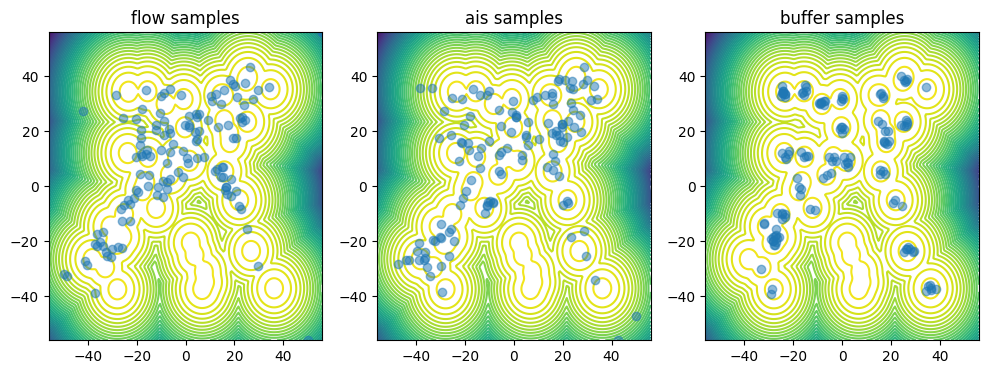

loss: 8.593634605407715, ess base: 0.21224889159202576,ess ais: 0.09248509258031845:  11%|█         | 447/4000 [01:37<30:40,  1.93it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.998691558837891, ess base: 0.26628074049949646,ess ais: 0.1072462946176529:  11%|█         | 449/4000 [01:38<21:05,  2.81it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.828437805175781, ess base: 0.2902633249759674,ess ais: 0.19763971865177155:  11%|█▏        | 450/4000 [01:38<18:17,  3.23it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.940735816955566, ess base: 0.21002519130706787,ess ais: 0.10257679224014282:  11%|█▏        | 452/4000 [01:38<14:56,  3.96it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.5514326095581055, ess base: 0.22160287201404572,ess ais: 0.13331550359725952:  11%|█▏        | 455/4000 [01:39<13:05,  4.52it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.473917007446289, ess base: 0.31074926257133484,ess ais: 0.09437007457017899:  11%|█▏        | 456/4000 [01:39<12:48,  4.61it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.506023406982422, ess base: 0.31545302271842957,ess ais: 0.17044049501419067:  11%|█▏        | 457/4000 [01:39<12:35,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.572015762329102, ess base: 0.2552106976509094,ess ais: 0.008655412122607231:  11%|█▏        | 458/4000 [01:40<12:41,  4.65it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.871098518371582, ess base: 0.2619597315788269,ess ais: 0.14392045140266418:  12%|█▏        | 460/4000 [01:40<12:40,  4.65it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.673181056976318, ess base: 0.25467124581336975,ess ais: 0.12712745368480682:  12%|█▏        | 461/4000 [01:40<12:39,  4.66it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.146434783935547, ess base: 0.17731055617332458,ess ais: 0.06606392562389374:  12%|█▏        | 462/4000 [01:40<12:33,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.569427490234375, ess base: 0.22297805547714233,ess ais: 0.11316292732954025:  12%|█▏        | 463/4000 [01:41<12:29,  4.72it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.991885662078857, ess base: 0.28209030628204346,ess ais: 0.1289643496274948:  12%|█▏        | 465/4000 [01:41<12:32,  4.70it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.45770263671875, ess base: 0.2177894562482834,ess ais: 0.05125751718878746:  12%|█▏        | 469/4000 [01:42<12:37,  4.66it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.932753562927246, ess base: 0.2708371579647064,ess ais: 0.1687946915626526:  12%|█▏        | 470/4000 [01:42<12:35,  4.67it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.072678565979004, ess base: 0.22765657305717468,ess ais: 0.06233924999833107:  12%|█▏        | 471/4000 [01:42<12:34,  4.67it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.740346908569336, ess base: 0.2540320158004761,ess ais: 0.09216192364692688:  12%|█▏        | 472/4000 [01:42<12:32,  4.69it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.797290325164795, ess base: 0.3405883014202118,ess ais: 0.22221937775611877:  12%|█▏        | 473/4000 [01:43<12:35,  4.67it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.720113754272461, ess base: 0.2330264002084732,ess ais: 0.05702376365661621:  12%|█▏        | 474/4000 [01:43<12:34,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.221199989318848, ess base: 0.2895374000072479,ess ais: 0.19729767739772797:  12%|█▏        | 475/4000 [01:43<12:31,  4.69it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.976268768310547, ess base: 0.17907775938510895,ess ais: 0.03033481538295746:  12%|█▏        | 476/4000 [01:43<12:23,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.025980949401855, ess base: 0.36326441168785095,ess ais: 0.19287940859794617:  12%|█▏        | 477/4000 [01:44<12:25,  4.73it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.939257621765137, ess base: 0.3069626986980438,ess ais: 0.11494084447622299:  12%|█▏        | 479/4000 [01:44<12:47,  4.58it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.64126205444336, ess base: 0.19469130039215088,ess ais: 0.04553693160414696:  12%|█▏        | 480/4000 [01:44<12:51,  4.56it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.923774719238281, ess base: 0.15000249445438385,ess ais: 0.025075804442167282:  12%|█▏        | 481/4000 [01:44<12:51,  4.56it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.69251012802124, ess base: 0.31871911883354187,ess ais: 0.15508653223514557:  12%|█▏        | 483/4000 [01:45<12:37,  4.64it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.2179877609014511,ess ais: 0.007874015718698502:  12%|█▏        | 484/4000 [01:45<12:13,  4.80it/s]             

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.559186935424805, ess base: 0.25120505690574646,ess ais: 0.09738381952047348:  12%|█▏        | 487/4000 [01:46<12:26,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.979857444763184, ess base: 0.26886889338493347,ess ais: 0.07489298284053802:  12%|█▏        | 489/4000 [01:46<12:29,  4.69it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.205696105957031, ess base: 0.2742087244987488,ess ais: 0.1173274964094162:  12%|█▏        | 490/4000 [01:46<12:29,  4.68it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.158271789550781, ess base: 0.3018609285354614,ess ais: 0.18250593543052673:  12%|█▏        | 491/4000 [01:47<12:28,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.12182903289795, ess base: 0.19912271201610565,ess ais: 0.07956468313932419:  12%|█▏        | 492/4000 [01:47<12:33,  4.66it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.949751377105713, ess base: 0.27787721157073975,ess ais: 0.16477228701114655:  12%|█▏        | 493/4000 [01:47<12:33,  4.66it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.566865921020508, ess base: 0.2856018841266632,ess ais: 0.09525634348392487:  12%|█▏        | 494/4000 [01:47<12:31,  4.66it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9986066818237305, ess base: 0.3557649254798889,ess ais: 0.16735422611236572:  12%|█▏        | 495/4000 [01:47<12:28,  4.68it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.433904647827148, ess base: 0.21114328503608704,ess ais: 0.05833373963832855:  12%|█▏        | 496/4000 [01:48<12:25,  4.70it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.059375762939453, ess base: 0.24524447321891785,ess ais: 0.09585169702768326:  12%|█▏        | 497/4000 [01:48<12:25,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.93589973449707, ess base: 0.2660282552242279,ess ais: 0.1393081396818161:  12%|█▏        | 498/4000 [01:48<12:28,  4.68it/s]   

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.038015365600586, ess base: 0.24972306191921234,ess ais: 0.007874015718698502:  12%|█▏        | 499/4000 [01:48<12:20,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.80722427368164, ess base: 0.09845362603664398,ess ais: 0.012186671607196331:  12%|█▎        | 500/4000 [01:48<11:54,  4.90it/s] 

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.940373420715332, ess base: 0.22336363792419434,ess ais: 0.07000398635864258:  13%|█▎        | 502/4000 [01:49<11:58,  4.87it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.805560111999512, ess base: 0.2677081227302551,ess ais: 0.15322712063789368:  13%|█▎        | 503/4000 [01:49<12:06,  4.82it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.345486640930176, ess base: 0.2601605951786041,ess ais: 0.1036531999707222:  13%|█▎        | 504/4000 [01:49<12:21,  4.72it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.299867630004883, ess base: 0.2276049107313156,ess ais: 0.09126962721347809:  13%|█▎        | 505/4000 [01:50<12:23,  4.70it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.244569778442383, ess base: 0.20925086736679077,ess ais: 0.07888785749673843:  13%|█▎        | 506/4000 [01:50<12:23,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.480823516845703, ess base: 0.2172771394252777,ess ais: 0.06943663209676743:  13%|█▎        | 507/4000 [01:50<12:19,  4.72it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.915872573852539, ess base: 0.2259143441915512,ess ais: 0.11747965961694717:  13%|█▎        | 509/4000 [01:50<12:19,  4.72it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.690387725830078, ess base: 0.3258287012577057,ess ais: 0.1911144107580185:  13%|█▎        | 510/4000 [01:51<12:13,  4.76it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.046868324279785, ess base: 0.3817165791988373,ess ais: 0.22257913649082184:  13%|█▎        | 511/4000 [01:51<12:10,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.956843376159668, ess base: 0.29694443941116333,ess ais: 0.13469499349594116:  13%|█▎        | 514/4000 [01:51<12:10,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.780298233032227, ess base: 0.2501814663410187,ess ais: 0.125564843416214:  13%|█▎        | 515/4000 [01:52<12:08,  4.78it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.75156831741333, ess base: 0.31531673669815063,ess ais: 0.1895247995853424:  13%|█▎        | 516/4000 [01:52<12:07,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.72371768951416, ess base: 0.27098143100738525,ess ais: 0.11113015562295914:  13%|█▎        | 517/4000 [01:52<12:06,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.949159622192383, ess base: 0.2510806620121002,ess ais: 0.10626102983951569:  13%|█▎        | 518/4000 [01:52<12:06,  4.79it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.776908874511719, ess base: 0.25806087255477905,ess ais: 0.11914074420928955:  13%|█▎        | 519/4000 [01:52<12:12,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.884037017822266, ess base: 0.24993251264095306,ess ais: 0.089772067964077:  13%|█▎        | 520/4000 [01:53<12:09,  4.77it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.339969635009766, ess base: 0.2376614660024643,ess ais: 0.1077728196978569:  13%|█▎        | 521/4000 [01:53<12:14,  4.74it/s]

7 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.206777572631836, ess base: 0.24777370691299438,ess ais: 0.018088703975081444:  13%|█▎        | 522/4000 [01:53<12:16,  4.72it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.360391616821289, ess base: 0.2670186460018158,ess ais: 0.1546824872493744:  13%|█▎        | 523/4000 [01:53<12:06,  4.79it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.158246994018555, ess base: 0.2587505877017975,ess ais: 0.10140212625265121:  13%|█▎        | 525/4000 [01:54<11:47,  4.91it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 199.26747131347656, ess base: 0.28104400634765625,ess ais: 0.11080639064311981:  13%|█▎        | 527/4000 [01:54<11:52,  4.87it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.827667236328125, ess base: 0.32979828119277954,ess ais: 0.16726437211036682:  13%|█▎        | 529/4000 [01:55<11:57,  4.84it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.657929420471191, ess base: 0.2075168490409851,ess ais: 0.06311886012554169:  13%|█▎        | 531/4000 [01:55<12:07,  4.77it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.986385822296143, ess base: 0.35618674755096436,ess ais: 0.23577016592025757:  13%|█▎        | 532/4000 [01:55<12:09,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.018068313598633, ess base: 0.20841167867183685,ess ais: 0.04582979157567024:  13%|█▎        | 533/4000 [01:55<12:09,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.472692489624023, ess base: 0.35796478390693665,ess ais: 0.22083303332328796:  13%|█▎        | 534/4000 [01:56<12:10,  4.75it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.223719596862793, ess base: 0.2101975381374359,ess ais: 0.08537886291742325:  13%|█▎        | 535/4000 [01:56<12:10,  4.74it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.695186614990234, ess base: 0.265634149312973,ess ais: 0.14644236862659454:  13%|█▎        | 536/4000 [01:56<12:11,  4.73it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.952742099761963, ess base: 0.2663065791130066,ess ais: 0.12264655530452728:  13%|█▎        | 537/4000 [01:56<12:07,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.976849555969238, ess base: 0.2670266628265381,ess ais: 0.08699499815702438:  13%|█▎        | 538/4000 [01:56<12:03,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.580477714538574, ess base: 0.28662577271461487,ess ais: 0.1853150874376297:  13%|█▎        | 539/4000 [01:57<12:03,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.878541946411133, ess base: 0.2889818251132965,ess ais: 0.17781434953212738:  14%|█▎        | 540/4000 [01:57<12:05,  4.77it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.989274978637695, ess base: 0.21149779856204987,ess ais: 0.06042587012052536:  14%|█▎        | 542/4000 [01:57<12:03,  4.78it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.856680870056152, ess base: 0.2632763385772705,ess ais: 0.14498543739318848:  14%|█▎        | 543/4000 [01:57<12:02,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.86916732788086, ess base: 0.2559315264225006,ess ais: 0.1288844347000122:  14%|█▎        | 544/4000 [01:58<12:16,  4.69it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.439519882202148, ess base: 0.29530423879623413,ess ais: 0.16141755878925323:  14%|█▎        | 545/4000 [01:58<12:16,  4.69it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.629843711853027, ess base: 0.27766191959381104,ess ais: 0.18133389949798584:  14%|█▎        | 547/4000 [01:58<12:13,  4.71it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.23863410949707, ess base: 0.3275652527809143,ess ais: 0.18211868405342102:  14%|█▎        | 548/4000 [01:59<12:09,  4.73it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.651469230651855, ess base: 0.31310316920280457,ess ais: 0.19714994728565216:  14%|█▎        | 549/4000 [01:59<12:10,  4.72it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.710184097290039, ess base: 0.274842768907547,ess ais: 0.1407446712255478:  14%|█▍        | 551/4000 [01:59<12:02,  4.77it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.840207099914551, ess base: 0.22351373732089996,ess ais: 0.05459663271903992:  14%|█▍        | 552/4000 [01:59<12:18,  4.67it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.576107025146484, ess base: 0.2663328945636749,ess ais: 0.11339446157217026:  14%|█▍        | 554/4000 [02:00<12:12,  4.70it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.807212829589844, ess base: 0.25455403327941895,ess ais: 0.1243729442358017:  14%|█▍        | 555/4000 [02:00<12:13,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.814557075500488, ess base: 0.3280332088470459,ess ais: 0.16912639141082764:  14%|█▍        | 556/4000 [02:00<12:12,  4.70it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.614415168762207, ess base: 0.27854451537132263,ess ais: 0.11179275065660477:  14%|█▍        | 557/4000 [02:00<12:11,  4.71it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.157231330871582, ess base: 0.18230824172496796,ess ais: 0.11549652367830276:  14%|█▍        | 558/4000 [02:01<12:06,  4.74it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.189325332641602, ess base: 0.2833600640296936,ess ais: 0.14548885822296143:  14%|█▍        | 559/4000 [02:01<12:05,  4.74it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.35729694366455, ess base: 0.2374393343925476,ess ais: 0.04513762518763542:  14%|█▍        | 560/4000 [02:01<12:03,  4.75it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.963758945465088, ess base: 0.25276926159858704,ess ais: 0.14702682197093964:  14%|█▍        | 563/4000 [02:02<12:05,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.939702987670898, ess base: 0.20895102620124817,ess ais: 0.04253072664141655:  14%|█▍        | 565/4000 [02:02<12:08,  4.72it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.86347770690918, ess base: 0.2465619295835495,ess ais: 0.05855822190642357:  14%|█▍        | 566/4000 [02:02<12:10,  4.70it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.575123310089111, ess base: 0.3186508119106293,ess ais: 0.18673457205295563:  14%|█▍        | 568/4000 [02:03<12:13,  4.68it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.01082992553711, ess base: 0.2519964277744293,ess ais: 0.08926461637020111:  14%|█▍        | 569/4000 [02:03<12:13,  4.68it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.549263000488281, ess base: 0.3185180127620697,ess ais: 0.0515708364546299:  14%|█▍        | 572/4000 [02:04<12:08,  4.70it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.70900821685791, ess base: 0.26802322268486023,ess ais: 0.13660506904125214:  14%|█▍        | 574/4000 [02:04<12:17,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.013668060302734, ess base: 0.28888779878616333,ess ais: 0.17725332081317902:  14%|█▍        | 575/4000 [02:04<12:28,  4.58it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.873614311218262, ess base: 0.23252594470977783,ess ais: 0.10518469661474228:  14%|█▍        | 576/4000 [02:04<12:19,  4.63it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.72010326385498, ess base: 0.20396685600280762,ess ais: 0.04067419841885567:  14%|█▍        | 579/4000 [02:05<11:59,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.527610778808594, ess base: 0.20796456933021545,ess ais: 0.04493112489581108:  14%|█▍        | 580/4000 [02:05<11:56,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.435163974761963, ess base: 0.2220378816127777,ess ais: 0.08474854379892349:  15%|█▍        | 581/4000 [02:06<11:52,  4.80it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.112916946411133, ess base: 0.3257404565811157,ess ais: 0.1921791434288025:  15%|█▍        | 582/4000 [02:06<11:52,  4.80it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.70323657989502, ess base: 0.33304059505462646,ess ais: 0.20672154426574707:  15%|█▍        | 585/4000 [02:06<11:57,  4.76it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.41076946258545, ess base: 0.2562481164932251,ess ais: 0.06323450803756714:  15%|█▍        | 586/4000 [02:07<11:58,  4.75it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.791897773742676, ess base: 0.3117028772830963,ess ais: 0.1315583735704422:  15%|█▍        | 587/4000 [02:07<12:01,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.272320747375488, ess base: 0.2509889304637909,ess ais: 0.07715006917715073:  15%|█▍        | 588/4000 [02:07<11:57,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.643808841705322, ess base: 0.24436117708683014,ess ais: 0.1002265140414238:  15%|█▍        | 589/4000 [02:07<11:58,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.783677101135254, ess base: 0.343290776014328,ess ais: 0.21113421022891998:  15%|█▍        | 590/4000 [02:07<11:55,  4.77it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.041180610656738, ess base: 0.28018826246261597,ess ais: 0.14517763257026672:  15%|█▍        | 591/4000 [02:08<11:50,  4.80it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.513553619384766, ess base: 0.2599940299987793,ess ais: 0.008232438936829567:  15%|█▍        | 592/4000 [02:08<11:48,  4.81it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.798264503479004, ess base: 0.3130161762237549,ess ais: 0.18980969488620758:  15%|█▍        | 593/4000 [02:08<11:52,  4.78it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.012600898742676, ess base: 0.2532423436641693,ess ais: 0.11303476244211197:  15%|█▍        | 595/4000 [02:08<11:52,  4.78it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.648332595825195, ess base: 0.09466288238763809,ess ais: 0.011994336731731892:  15%|█▍        | 596/4000 [02:09<11:53,  4.77it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.047155380249023, ess base: 0.3007257282733917,ess ais: 0.1295517534017563:  15%|█▍        | 597/4000 [02:09<11:53,  4.77it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.903696060180664, ess base: 0.27278265357017517,ess ais: 0.04658056050539017:  15%|█▍        | 598/4000 [02:09<11:56,  4.75it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.652286529541016, ess base: 0.2238570749759674,ess ais: 0.057924140244722366:  15%|█▍        | 599/4000 [02:09<11:58,  4.74it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.455520629882812, ess base: 0.2668294906616211,ess ais: 0.0915311872959137:  15%|█▌        | 600/4000 [02:10<11:57,  4.74it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.772615432739258, ess base: 0.2993408143520355,ess ais: 0.13692496716976166:  15%|█▌        | 602/4000 [02:10<11:55,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.757691383361816, ess base: 0.2822856605052948,ess ais: 0.09235135465860367:  15%|█▌        | 603/4000 [02:10<11:56,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.243114471435547, ess base: 0.3036319315433502,ess ais: 0.15982624888420105:  15%|█▌        | 605/4000 [02:11<11:49,  4.79it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.082069396972656, ess base: 0.20368650555610657,ess ais: 0.09933445602655411:  15%|█▌        | 606/4000 [02:11<11:48,  4.79it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.067632675170898, ess base: 0.37452277541160583,ess ais: 0.2188819795846939:  15%|█▌        | 607/4000 [02:11<11:50,  4.77it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.259586334228516, ess base: 0.25294020771980286,ess ais: 0.14170950651168823:  15%|█▌        | 608/4000 [02:11<11:50,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.688133239746094, ess base: 0.33184492588043213,ess ais: 0.14252305030822754:  15%|█▌        | 609/4000 [02:11<11:46,  4.80it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.982128143310547, ess base: 0.27032750844955444,ess ais: 0.10832802206277847:  15%|█▌        | 610/4000 [02:12<11:44,  4.81it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.239127159118652, ess base: 0.25519949197769165,ess ais: 0.12342710793018341:  15%|█▌        | 611/4000 [02:12<11:43,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 14.01730728149414, ess base: 0.3313295245170593,ess ais: 0.14248338341712952:  15%|█▌        | 613/4000 [02:12<11:40,  4.84it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.443288803100586, ess base: 0.2980942726135254,ess ais: 0.16491569578647614:  15%|█▌        | 614/4000 [02:12<11:39,  4.84it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.786681652069092, ess base: 0.3005051016807556,ess ais: 0.18239936232566833:  15%|█▌        | 615/4000 [02:13<11:38,  4.84it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.280680656433105, ess base: 0.22247175872325897,ess ais: 0.007874015718698502:  15%|█▌        | 616/4000 [02:13<11:41,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.383209228515625, ess base: 0.32614144682884216,ess ais: 0.17607438564300537:  15%|█▌        | 617/4000 [02:13<11:38,  4.85it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.885303497314453, ess base: 0.2333706021308899,ess ais: 0.08081994205713272:  15%|█▌        | 619/4000 [02:13<11:40,  4.83it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.810762405395508, ess base: 0.21577958762645721,ess ais: 0.06800638139247894:  16%|█▌        | 620/4000 [02:14<11:42,  4.81it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.074258804321289, ess base: 0.31012386083602905,ess ais: 0.17845366895198822:  16%|█▌        | 621/4000 [02:14<11:57,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.482488632202148, ess base: 0.29867053031921387,ess ais: 0.10582619905471802:  16%|█▌        | 622/4000 [02:14<11:50,  4.75it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.17768669128418, ess base: 0.2400123029947281,ess ais: 0.10358572751283646:  16%|█▌        | 626/4000 [02:15<11:49,  4.76it/s]   

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.387730598449707, ess base: 0.38284558057785034,ess ais: 0.22400684654712677:  16%|█▌        | 627/4000 [02:15<11:47,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.269739151000977, ess base: 0.27151405811309814,ess ais: 0.09892605990171432:  16%|█▌        | 628/4000 [02:15<11:43,  4.79it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.606966018676758, ess base: 0.32542338967323303,ess ais: 0.15504884719848633:  16%|█▌        | 629/4000 [02:16<11:42,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.909749984741211, ess base: 0.24536621570587158,ess ais: 0.06710750609636307:  16%|█▌        | 631/4000 [02:16<11:45,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.04872989654541, ess base: 0.306888610124588,ess ais: 0.17917294800281525:  16%|█▌        | 632/4000 [02:16<11:44,  4.78it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.439693450927734, ess base: 0.3270801305770874,ess ais: 0.1975715011358261:  16%|█▌        | 634/4000 [02:17<11:04,  5.06it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: inf, ess base: 0.27942606806755066,ess ais: 0.0913955345749855:  16%|█▌        | 636/4000 [02:17<11:03,  5.07it/s]               

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.868745803833008, ess base: 0.2564511299133301,ess ais: 0.12347592413425446:  16%|█▌        | 638/4000 [02:17<11:21,  4.94it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.628777980804443, ess base: 0.2690896987915039,ess ais: 0.12907017767429352:  16%|█▌        | 639/4000 [02:18<11:02,  5.08it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.2714729309082031,ess ais: 0.007874015718698502:  16%|█▌        | 640/4000 [02:18<10:28,  5.35it/s]             

nan loss in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.12472152709961, ess base: 0.25029781460762024,ess ais: 0.06954887509346008:  16%|█▌        | 641/4000 [02:18<10:27,  5.36it/s]

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.885427474975586, ess base: 0.27951207756996155,ess ais: 0.1195114403963089:  16%|█▌        | 643/4000 [02:18<11:06,  5.04it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.65662956237793, ess base: 0.2934623956680298,ess ais: 0.10835275053977966:  16%|█▌        | 644/4000 [02:19<10:54,  5.13it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.675616264343262, ess base: 0.21545235812664032,ess ais: 0.04858211427927017:  16%|█▌        | 645/4000 [02:19<10:47,  5.18it/s]

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: inf, ess base: 0.3091222047805786,ess ais: 0.147856667637825:  16%|█▌        | 647/4000 [02:19<10:39,  5.24it/s]                 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.46417236328125, ess base: 0.3187752664089203,ess ais: 0.18196937441825867:  16%|█▌        | 649/4000 [02:20<11:21,  4.92it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.3585537075996399,ess ais: 0.17517884075641632:  16%|█▋        | 651/4000 [02:20<11:08,  5.01it/s]                

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.518409729003906, ess base: 0.31341487169265747,ess ais: 0.19232766330242157:  16%|█▋        | 652/4000 [02:20<11:18,  4.94it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.505395889282227, ess base: 0.2508971095085144,ess ais: 0.14649052917957306:  16%|█▋        | 654/4000 [02:21<12:23,  4.50it/s] 

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.97208309173584, ess base: 0.28603091835975647,ess ais: 0.126596599817276:  16%|█▋        | 655/4000 [02:21<11:41,  4.77it/s]  

nan loss in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.607202529907227, ess base: 0.271541953086853,ess ais: 0.12375345826148987:  16%|█▋        | 657/4000 [02:21<11:14,  4.96it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.996650218963623, ess base: 0.3641907274723053,ess ais: 0.18418942391872406:  16%|█▋        | 659/4000 [02:22<11:24,  4.88it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.608983993530273, ess base: 0.24486035108566284,ess ais: 0.12355294078588486:  16%|█▋        | 660/4000 [02:22<11:16,  4.94it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.305463790893555, ess base: 0.3907809555530548,ess ais: 0.18888714909553528:  17%|█▋        | 661/4000 [02:22<11:03,  5.03it/s] 

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.608477592468262, ess base: 0.23701976239681244,ess ais: 0.008151333779096603:  17%|█▋        | 664/4000 [02:23<11:25,  4.87it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.677098274230957, ess base: 0.3108147084712982,ess ais: 0.1620086282491684:  17%|█▋        | 666/4000 [02:23<11:12,  4.96it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.20793870091438293,ess ais: 0.059995561838150024:  17%|█▋        | 667/4000 [02:23<11:03,  5.02it/s]           

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.164013862609863, ess base: 0.27237263321876526,ess ais: 0.07867475599050522:  17%|█▋        | 669/4000 [02:24<11:26,  4.85it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.7618913650512695, ess base: 0.24576494097709656,ess ais: 0.1045592874288559:  17%|█▋        | 670/4000 [02:24<11:04,  5.01it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.24740102887153625,ess ais: 0.06415538489818573:  17%|█▋        | 671/4000 [02:24<10:47,  5.14it/s]              

nan loss in replay step


loss: 9.148417472839355, ess base: 0.25981375575065613,ess ais: 0.10844362527132034:  17%|█▋        | 673/4000 [02:24<11:15,  4.93it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.25503766536712646,ess ais: 0.14216241240501404:  17%|█▋        | 674/4000 [02:25<11:02,  5.02it/s]              

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.759961128234863, ess base: 0.28889894485473633,ess ais: 0.1482008993625641:  17%|█▋        | 676/4000 [02:25<10:50,  5.11it/s]

nan loss in replay step
nan loss in replay step


loss: 8.065521240234375, ess base: 0.3150912821292877,ess ais: 0.15266519784927368:  17%|█▋        | 677/4000 [02:25<11:11,  4.95it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.29854902625083923,ess ais: 0.10521944612264633:  17%|█▋        | 678/4000 [02:25<11:00,  5.03it/s]             

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.973150253295898, ess base: 0.289314329624176,ess ais: 0.13637888431549072:  17%|█▋        | 680/4000 [02:26<11:04,  5.00it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.181869506835938, ess base: 0.2804127037525177,ess ais: 0.12634989619255066:  17%|█▋        | 681/4000 [02:26<10:58,  5.04it/s]

nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 9.597307205200195, ess base: 0.36488115787506104,ess ais: 0.1888369768857956:  17%|█▋        | 683/4000 [02:26<11:10,  4.95it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.562795639038086, ess base: 0.28876784443855286,ess ais: 0.07166074961423874:  17%|█▋        | 684/4000 [02:27<11:23,  4.85it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.247420310974121, ess base: 0.28869014978408813,ess ais: 0.11347715556621552:  17%|█▋        | 685/4000 [02:27<11:32,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.615116119384766, ess base: 0.28359851241111755,ess ais: 0.1413728892803192:  17%|█▋        | 686/4000 [02:27<11:25,  4.83it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.673772811889648, ess base: 0.30947136878967285,ess ais: 0.18141710758209229:  17%|█▋        | 687/4000 [02:27<11:12,  4.92it/s]

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.646491050720215, ess base: 0.277091383934021,ess ais: 0.14513416588306427:  17%|█▋        | 689/4000 [02:28<11:33,  4.77it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.054906845092773, ess base: 0.2938147485256195,ess ais: 0.1628013551235199:  17%|█▋        | 690/4000 [02:28<11:18,  4.88it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.95490837097168, ess base: 0.26498571038246155,ess ais: 0.13112933933734894:  17%|█▋        | 692/4000 [02:28<11:28,  4.80it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.552027225494385, ess base: 0.3010155260562897,ess ais: 0.12323183566331863:  17%|█▋        | 693/4000 [02:29<11:38,  4.73it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.936598777770996, ess base: 0.27518612146377563,ess ais: 0.10170648992061615:  17%|█▋        | 694/4000 [02:29<11:45,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.289756774902344, ess base: 0.32504674792289734,ess ais: 0.16504204273223877:  17%|█▋        | 695/4000 [02:29<11:28,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.210444450378418, ess base: 0.27786606550216675,ess ais: 0.16741164028644562:  17%|█▋        | 697/4000 [02:29<11:29,  4.79it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.396242141723633, ess base: 0.3270706236362457,ess ais: 0.18219563364982605:  17%|█▋        | 698/4000 [02:30<11:14,  4.90it/s] 

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.062492370605469, ess base: 0.30291038751602173,ess ais: 0.11504598706960678:  17%|█▋        | 699/4000 [02:30<11:00,  5.00it/s]

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.353009223937988, ess base: 0.3307793438434601,ess ais: 0.14121364057064056:  18%|█▊        | 701/4000 [02:30<10:58,  5.01it/s] 

nan loss in replay step


loss: 7.804543495178223, ess base: 0.3244388699531555,ess ais: 0.19437044858932495:  18%|█▊        | 702/4000 [02:30<10:50,  5.07it/s]

nan loss in replay step


loss: 8.539971351623535, ess base: 0.2555810809135437,ess ais: 0.0948125422000885:  18%|█▊        | 704/4000 [02:31<11:14,  4.88it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.25494247674942017,ess ais: 0.13064153492450714:  18%|█▊        | 705/4000 [02:31<11:06,  4.94it/s]            

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.806906700134277, ess base: 0.31424441933631897,ess ais: 0.15249383449554443:  18%|█▊        | 707/4000 [02:31<11:28,  4.78it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.551804542541504, ess base: 0.3092504143714905,ess ais: 0.12307670712471008:  18%|█▊        | 708/4000 [02:32<11:31,  4.76it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.360206604003906, ess base: 0.29820287227630615,ess ais: 0.12256588041782379:  18%|█▊        | 709/4000 [02:32<11:08,  4.92it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.861198425292969, ess base: 0.29220566153526306,ess ais: 0.007936508394777775:  18%|█▊        | 710/4000 [02:32<10:49,  5.07it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.853540897369385, ess base: 0.28464335203170776,ess ais: 0.13680210709571838:  18%|█▊        | 712/4000 [02:32<10:59,  4.99it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.814848899841309, ess base: 0.04566926509141922,ess ais: 0.009366541169583797:  18%|█▊        | 713/4000 [02:33<10:46,  5.08it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.153772354125977, ess base: 0.29716727137565613,ess ais: 0.17644360661506653:  18%|█▊        | 714/4000 [02:33<10:38,  5.15it/s] 

nan loss in replay step
nan loss in replay step


loss: 7.8393402099609375, ess base: 0.26672685146331787,ess ais: 0.04672616720199585:  18%|█▊        | 716/4000 [02:33<10:49,  5.05it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.38097459077835083,ess ais: 0.2641960680484772:  18%|█▊        | 719/4000 [02:34<10:46,  5.08it/s]                

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.452328681945801, ess base: 0.2558591961860657,ess ais: 0.06937672942876816:  18%|█▊        | 722/4000 [02:34<11:20,  4.82it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.891014099121094, ess base: 0.16922172904014587,ess ais: 0.02577928453683853:  18%|█▊        | 723/4000 [02:35<10:56,  4.99it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.148140907287598, ess base: 0.2883348762989044,ess ais: 0.17217595875263214:  18%|█▊        | 725/4000 [02:35<11:23,  4.79it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.2962741255760193,ess ais: 0.13137352466583252:  18%|█▊        | 726/4000 [02:35<11:09,  4.89it/s]              

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.125874519348145, ess base: 0.3174799978733063,ess ais: 0.12400314211845398:  18%|█▊        | 729/4000 [02:36<11:25,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.635011672973633, ess base: 0.2817020118236542,ess ais: 0.08670450001955032:  18%|█▊        | 730/4000 [02:36<11:28,  4.75it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.904689788818359, ess base: 0.307181179523468,ess ais: 0.007874015718698502:  18%|█▊        | 731/4000 [02:36<11:24,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.674379348754883, ess base: 0.24423694610595703,ess ais: 0.124168261885643:  18%|█▊        | 732/4000 [02:36<11:23,  4.78it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.271223068237305, ess base: 0.21045434474945068,ess ais: 0.03734384849667549:  18%|█▊        | 733/4000 [02:37<10:59,  4.96it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.26003646850586, ess base: 0.3210628032684326,ess ais: 0.08990256488323212:  18%|█▊        | 734/4000 [02:37<10:41,  5.09it/s]  

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.535780906677246, ess base: 0.3600212335586548,ess ais: 0.1041339635848999:  18%|█▊        | 736/4000 [02:37<10:46,  5.05it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.57415771484375, ess base: 0.31554287672042847,ess ais: 0.1803686022758484:  18%|█▊        | 737/4000 [02:37<10:51,  5.01it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.603099822998047, ess base: 0.2913459241390228,ess ais: 0.14555670320987701:  18%|█▊        | 738/4000 [02:38<10:34,  5.14it/s]

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.3375810980796814,ess ais: 0.2003825157880783:  18%|█▊        | 739/4000 [02:38<10:25,  5.21it/s]               

nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.881157875061035, ess base: 0.24036860466003418,ess ais: 0.1037672907114029:  19%|█▊        | 741/4000 [02:38<10:49,  5.02it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.859132766723633, ess base: 0.3146972358226776,ess ais: 0.1710110455751419:  19%|█▊        | 743/4000 [02:39<11:00,  4.93it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.578598976135254, ess base: 0.25843140482902527,ess ais: 0.13653740286827087:  19%|█▊        | 744/4000 [02:39<11:03,  4.90it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.767333984375, ess base: 0.34617820382118225,ess ais: 0.19510489702224731:  19%|█▊        | 746/4000 [02:39<11:01,  4.92it/s]   

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.695366859436035, ess base: 0.33078494668006897,ess ais: 0.2092401385307312:  19%|█▊        | 747/4000 [02:39<11:13,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.328676223754883, ess base: 0.3009013533592224,ess ais: 0.16611310839653015:  19%|█▊        | 748/4000 [02:40<11:23,  4.76it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.18494987487793, ess base: 0.2907887101173401,ess ais: 0.1018867939710617:  19%|█▊        | 749/4000 [02:40<11:22,  4.76it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.04278564453125, ess base: 0.26899197697639465,ess ais: 0.06789983808994293:  19%|█▉        | 750/4000 [02:40<11:23,  4.76it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.872055053710938, ess base: 0.30816635489463806,ess ais: 0.0582282617688179:  19%|█▉        | 751/4000 [02:40<11:27,  4.73it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.394963264465332, ess base: 0.24452242255210876,ess ais: 0.09192108362913132:  19%|█▉        | 752/4000 [02:41<11:06,  4.87it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.390347480773926, ess base: 0.2755500376224518,ess ais: 0.07658915966749191:  19%|█▉        | 753/4000 [02:41<10:53,  4.97it/s] 

nan loss in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.570293426513672, ess base: 0.03169044107198715,ess ais: 0.008130381815135479:  19%|█▉        | 754/4000 [02:41<10:39,  5.07it/s]

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.993355751037598, ess base: 0.28045937418937683,ess ais: 0.16396117210388184:  19%|█▉        | 756/4000 [02:41<10:38,  5.08it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 28.535770416259766, ess base: 0.32465335726737976,ess ais: 0.1123238056898117:  19%|█▉        | 757/4000 [02:41<10:32,  5.13it/s]

nan loss in replay step


loss: 8.871493339538574, ess base: 0.2663238048553467,ess ais: 0.08995871245861053:  19%|█▉        | 758/4000 [02:42<10:25,  5.18it/s] 

nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.466806411743164, ess base: 0.274519145488739,ess ais: 0.08995430916547775:  19%|█▉        | 760/4000 [02:42<10:56,  4.93it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.565509796142578, ess base: 0.2682645618915558,ess ais: 0.10605886578559875:  19%|█▉        | 761/4000 [02:42<11:04,  4.87it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.088375091552734, ess base: 0.21352951228618622,ess ais: 0.14250722527503967:  19%|█▉        | 762/4000 [02:42<10:47,  5.00it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 9.323774337768555, ess base: 0.2597185969352722,ess ais: 0.13522876799106598:  19%|█▉        | 763/4000 [02:43<10:35,  5.09it/s]  

nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.425006866455078, ess base: 0.19773179292678833,ess ais: 0.056038178503513336:  19%|█▉        | 765/4000 [02:43<11:04,  4.86it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.386905670166016, ess base: 0.22706551849842072,ess ais: 0.1554417908191681:  19%|█▉        | 766/4000 [02:43<10:47,  5.00it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.187687873840332, ess base: 0.2870975732803345,ess ais: 0.14133112132549286:  19%|█▉        | 767/4000 [02:43<10:37,  5.07it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.666817665100098, ess base: 0.24640606343746185,ess ais: 0.06643927842378616:  19%|█▉        | 769/4000 [02:44<10:50,  4.97it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.898623943328857, ess base: 0.34018412232398987,ess ais: 0.00788826309144497:  19%|█▉        | 770/4000 [02:44<10:42,  5.03it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.967031955718994, ess base: 0.3511371612548828,ess ais: 0.13187290728092194:  19%|█▉        | 772/4000 [02:44<10:46,  4.99it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.28520065546035767,ess ais: 0.14121559262275696:  19%|█▉        | 773/4000 [02:45<10:31,  5.11it/s]             

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.309142112731934, ess base: 0.2514515519142151,ess ais: 0.09650308638811111:  19%|█▉        | 775/4000 [02:45<10:29,  5.12it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.608736991882324, ess base: 0.2543056309223175,ess ais: 0.07677508145570755:  19%|█▉        | 777/4000 [02:45<10:50,  4.96it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.559226989746094, ess base: 0.34346431493759155,ess ais: 0.13154436647891998:  19%|█▉        | 778/4000 [02:46<10:36,  5.06it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.977171897888184, ess base: 0.34269362688064575,ess ais: 0.17719127237796783:  19%|█▉        | 779/4000 [02:46<10:35,  5.07it/s]

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.048452377319336, ess base: 0.2798711359500885,ess ais: 0.12782356142997742:  20%|█▉        | 782/4000 [02:47<11:09,  4.81it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: inf, ess base: 0.23451296985149384,ess ais: 0.08175800740718842:  20%|█▉        | 783/4000 [02:47<10:49,  4.95it/s]             

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.771891593933105, ess base: 0.26557114720344543,ess ais: 0.1507050096988678:  20%|█▉        | 785/4000 [02:47<10:59,  4.87it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.152427673339844, ess base: 0.4055007994174957,ess ais: 0.2642512023448944:  20%|█▉        | 786/4000 [02:47<10:59,  4.88it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.863899230957031, ess base: 0.24101629853248596,ess ais: 0.07730705291032791:  20%|█▉        | 787/4000 [02:48<10:56,  4.89it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.923111915588379, ess base: 0.35984018445014954,ess ais: 0.18185913562774658:  20%|█▉        | 788/4000 [02:48<10:57,  4.89it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.8366618156433105, ess base: 0.31360313296318054,ess ais: 0.15570859611034393:  20%|█▉        | 791/4000 [02:48<11:19,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.408037185668945, ess base: 0.3294390141963959,ess ais: 0.14030775427818298:  20%|█▉        | 792/4000 [02:49<11:15,  4.75it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.519094467163086, ess base: 0.2665129005908966,ess ais: 0.06463056802749634:  20%|█▉        | 793/4000 [02:49<11:18,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.170876502990723, ess base: 0.2942446172237396,ess ais: 0.12765978276729584:  20%|█▉        | 795/4000 [02:49<11:15,  4.74it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.441363334655762, ess base: 0.03631111979484558,ess ais: 0.00887573603540659:  20%|█▉        | 797/4000 [02:50<11:14,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.3126629889011383,ess ais: 0.007874015718698502:  20%|█▉        | 798/4000 [02:50<10:52,  4.90it/s]              

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.738241672515869, ess base: 0.2908743619918823,ess ais: 0.1604994535446167:  20%|██        | 802/4000 [02:51<11:02,  4.82it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.033100128173828, ess base: 0.25016456842422485,ess ais: 0.07382842153310776:  20%|██        | 803/4000 [02:51<11:06,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.08096694946289, ess base: 0.271045058965683,ess ais: 0.09405849874019623:  20%|██        | 804/4000 [02:51<11:09,  4.77it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.156264305114746, ess base: 0.30842745304107666,ess ais: 0.182687446475029:  20%|██        | 805/4000 [02:51<11:12,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.419635772705078, ess base: 0.15240709483623505,ess ais: 0.017086561769247055:  20%|██        | 806/4000 [02:52<11:13,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.419208526611328, ess base: 0.2922458052635193,ess ais: 0.014322907663881779:  20%|██        | 807/4000 [02:52<11:13,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.463582992553711, ess base: 0.26916953921318054,ess ais: 0.06891431659460068:  20%|██        | 808/4000 [02:52<11:16,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.736905574798584, ess base: 0.3249436616897583,ess ais: 0.13005152344703674:  20%|██        | 809/4000 [02:52<11:14,  4.73it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.954223155975342, ess base: 0.3555569350719452,ess ais: 0.18942318856716156:  20%|██        | 810/4000 [02:52<11:11,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.730888366699219, ess base: 0.2755514085292816,ess ais: 0.09763239324092865:  20%|██        | 811/4000 [02:53<11:11,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.322526931762695, ess base: 0.2248331755399704,ess ais: 0.06417296081781387:  20%|██        | 812/4000 [02:53<11:07,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.81924819946289, ess base: 0.2983900010585785,ess ais: 0.1950632780790329:  20%|██        | 813/4000 [02:53<11:06,  4.78it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 70.92780303955078, ess base: 0.22941453754901886,ess ais: 0.04461769759654999:  20%|██        | 814/4000 [02:53<11:02,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.66352653503418, ess base: 0.2724446952342987,ess ais: 0.13869412243366241:  20%|██        | 815/4000 [02:53<10:55,  4.86it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.767788887023926, ess base: 0.2973630130290985,ess ais: 0.14426180720329285:  20%|██        | 816/4000 [02:54<10:53,  4.88it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.485477447509766, ess base: 0.254281610250473,ess ais: 0.08416075259447098:  20%|██        | 817/4000 [02:54<10:54,  4.86it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.97502326965332, ess base: 0.2609841227531433,ess ais: 0.07636088877916336:  20%|██        | 819/4000 [02:54<10:56,  4.85it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.15847110748291, ess base: 0.3109963834285736,ess ais: 0.08212863653898239:  21%|██        | 821/4000 [02:55<10:58,  4.83it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.432405471801758, ess base: 0.37560272216796875,ess ais: 0.06750182807445526:  21%|██        | 822/4000 [02:55<11:06,  4.77it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.038309097290039, ess base: 0.3574720025062561,ess ais: 0.20417514443397522:  21%|██        | 824/4000 [02:55<11:09,  4.75it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.578508377075195, ess base: 0.23857314884662628,ess ais: 0.1008077934384346:  21%|██        | 825/4000 [02:55<11:04,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.899330139160156, ess base: 0.27028119564056396,ess ais: 0.13457606732845306:  21%|██        | 826/4000 [02:56<11:04,  4.78it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.746848106384277, ess base: 0.2806183397769928,ess ais: 0.10850260406732559:  21%|██        | 827/4000 [02:56<11:04,  4.77it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.09843635559082, ess base: 0.29943665862083435,ess ais: 0.16009271144866943:  21%|██        | 829/4000 [02:56<11:07,  4.75it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.381950378417969, ess base: 0.36299633979797363,ess ais: 0.2449115663766861:  21%|██        | 830/4000 [02:57<11:02,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.399218559265137, ess base: 0.26137614250183105,ess ais: 0.1423560380935669:  21%|██        | 831/4000 [02:57<11:04,  4.77it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.277490615844727, ess base: 0.33146989345550537,ess ais: 0.16384746134281158:  21%|██        | 832/4000 [02:57<11:03,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.126632690429688, ess base: 0.28855347633361816,ess ais: 0.1570044606924057:  21%|██        | 833/4000 [02:57<11:05,  4.76it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.270709037780762, ess base: 0.3120821416378021,ess ais: 0.1881592869758606:  21%|██        | 838/4000 [02:58<11:03,  4.76it/s]    

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.206266403198242, ess base: 0.29538461565971375,ess ais: 0.18518836796283722:  21%|██        | 839/4000 [02:58<11:01,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.100692749023438, ess base: 0.3384256064891815,ess ais: 0.19252964854240417:  21%|██        | 840/4000 [02:59<10:59,  4.79it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.209355354309082, ess base: 0.29376280307769775,ess ais: 0.13504017889499664:  21%|██        | 842/4000 [02:59<11:17,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.14293098449707, ess base: 0.29345861077308655,ess ais: 0.13838787376880646:  21%|██        | 844/4000 [02:59<11:24,  4.61it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.24479866027832, ess base: 0.30040833353996277,ess ais: 0.1429383009672165:  21%|██        | 845/4000 [03:00<11:23,  4.61it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.67789077758789, ess base: 0.26891177892684937,ess ais: 0.07751835882663727:  21%|██        | 847/4000 [03:00<11:24,  4.60it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.115209579467773, ess base: 0.2732912003993988,ess ais: 0.12203726917505264:  21%|██        | 849/4000 [03:01<11:16,  4.66it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.840816974639893, ess base: 0.32521820068359375,ess ais: 0.176834836602211:  21%|██▏       | 850/4000 [03:01<11:15,  4.66it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.273604393005371, ess base: 0.31005144119262695,ess ais: 0.008146801963448524:  21%|██▏       | 851/4000 [03:01<11:12,  4.68it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.421283721923828, ess base: 0.3396510183811188,ess ais: 0.16112755239009857:  21%|██▏       | 854/4000 [03:02<11:02,  4.75it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.659433364868164, ess base: 0.2602498233318329,ess ais: 0.13469316065311432:  21%|██▏       | 856/4000 [03:02<11:04,  4.73it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.69334888458252, ess base: 0.3447240889072418,ess ais: 0.19754938781261444:  21%|██▏       | 857/4000 [03:02<11:03,  4.74it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.031587600708008, ess base: 0.25639933347702026,ess ais: 0.12348230183124542:  21%|██▏       | 858/4000 [03:02<10:59,  4.77it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.763891220092773, ess base: 0.30435654520988464,ess ais: 0.1283634454011917:  22%|██▏       | 861/4000 [03:03<10:49,  4.83it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.184228897094727, ess base: 0.26601043343544006,ess ais: 0.06945600360631943:  22%|██▏       | 862/4000 [03:03<10:48,  4.84it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.098310470581055, ess base: 0.33421891927719116,ess ais: 0.1337439864873886:  22%|██▏       | 863/4000 [03:03<10:45,  4.86it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.924147605895996, ess base: 0.2806606888771057,ess ais: 0.12589308619499207:  22%|██▏       | 864/4000 [03:04<10:44,  4.86it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.857558250427246, ess base: 0.3412573039531708,ess ais: 0.22343164682388306:  22%|██▏       | 866/4000 [03:04<10:50,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.643573760986328, ess base: 0.2826704978942871,ess ais: 0.16444633901119232:  22%|██▏       | 866/4000 [03:04<10:50,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.8177995681762695, ess base: 0.26650911569595337,ess ais: 0.07591623067855835:  22%|██▏       | 868/4000 [03:05<11:08,  4.69it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.0288724899292, ess base: 0.2901638448238373,ess ais: 0.14142297208309174:  22%|██▏       | 869/4000 [03:05<11:08,  4.69it/s]    

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.676716804504395, ess base: 0.2849508821964264,ess ais: 0.1394626945257187:  22%|██▏       | 870/4000 [03:05<11:10,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.454835891723633, ess base: 0.3104848265647888,ess ais: 0.12582772970199585:  22%|██▏       | 871/4000 [03:05<11:18,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9250383377075195, ess base: 0.34013819694519043,ess ais: 0.037507303059101105:  22%|██▏       | 872/4000 [03:05<11:12,  4.65it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.256129264831543, ess base: 0.3703087568283081,ess ais: 0.01133564580231905:  22%|██▏       | 873/4000 [03:06<11:06,  4.69it/s]   

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.556112766265869, ess base: 0.27869975566864014,ess ais: 0.09873936325311661:  22%|██▏       | 875/4000 [03:06<11:01,  4.72it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.244852066040039, ess base: 0.3038131296634674,ess ais: 0.10997164994478226:  22%|██▏       | 876/4000 [03:06<10:57,  4.75it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.612984657287598, ess base: 0.26876702904701233,ess ais: 0.00800000037997961:  22%|██▏       | 877/4000 [03:06<10:35,  4.92it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.192087173461914, ess base: 0.2982015609741211,ess ais: 0.09492059797048569:  22%|██▏       | 881/4000 [03:07<10:54,  4.77it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 30.02012062072754, ess base: 0.2539217472076416,ess ais: 0.11840695887804031:  22%|██▏       | 882/4000 [03:07<10:57,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.011112213134766, ess base: 0.2867817282676697,ess ais: 0.12336405366659164:  22%|██▏       | 883/4000 [03:08<10:56,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.383283615112305, ess base: 0.011163664050400257,ess ais: 0.007886851206421852:  22%|██▏       | 884/4000 [03:08<10:57,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.244142532348633, ess base: 0.06820188462734222,ess ais: 0.009024174883961678:  22%|██▏       | 885/4000 [03:08<10:55,  4.75it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.142372131347656, ess base: 0.3052087426185608,ess ais: 0.12458299100399017:  22%|██▏       | 886/4000 [03:08<10:59,  4.72it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.596939086914062, ess base: 0.272376149892807,ess ais: 0.10887937247753143:  22%|██▏       | 887/4000 [03:09<11:02,  4.70it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.015541076660156, ess base: 0.3278982937335968,ess ais: 0.1837414801120758:  22%|██▏       | 888/4000 [03:09<10:59,  4.72it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.448921203613281, ess base: 0.019261686131358147,ess ais: 0.008056548424065113:  22%|██▏       | 888/4000 [03:09<10:59,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
5 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
4 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
4 nan/inf samples/log-probs/log-weights encountered at chain i

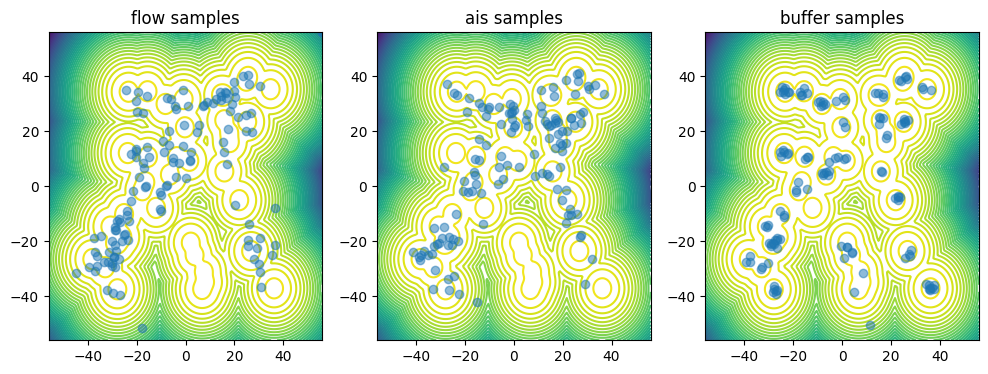

loss: 7.7314534187316895, ess base: 0.24477583169937134,ess ais: 0.12271182984113693:  22%|██▏       | 890/4000 [03:11<33:31,  1.55it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.253377914428711, ess base: 0.32249733805656433,ess ais: 0.19956190884113312:  22%|██▏       | 892/4000 [03:12<21:46,  2.38it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.914713382720947, ess base: 0.30251652002334595,ess ais: 0.15277190506458282:  22%|██▏       | 893/4000 [03:12<18:27,  2.80it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.6375732421875, ess base: 0.3310409486293793,ess ais: 0.20132334530353546:  22%|██▏       | 894/4000 [03:12<16:19,  3.17it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.840476036071777, ess base: 0.25133731961250305,ess ais: 0.049440864473581314:  22%|██▏       | 895/4000 [03:12<14:42,  3.52it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.368393898010254, ess base: 0.19226214289665222,ess ais: 0.12665484845638275:  22%|██▏       | 898/4000 [03:13<12:11,  4.24it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.962958335876465, ess base: 0.37655892968177795,ess ais: 0.20678335428237915:  22%|██▏       | 899/4000 [03:13<11:54,  4.34it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.748750686645508, ess base: 0.3218287527561188,ess ais: 0.13509847223758698:  22%|██▎       | 900/4000 [03:13<11:40,  4.43it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.762170791625977, ess base: 0.3026372492313385,ess ais: 0.10388500988483429:  23%|██▎       | 901/4000 [03:14<11:24,  4.53it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.928571701049805, ess base: 0.3151699900627136,ess ais: 0.1303527057170868:  23%|██▎       | 902/4000 [03:14<11:30,  4.49it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.321104049682617, ess base: 0.33740031719207764,ess ais: 0.17771123349666595:  23%|██▎       | 903/4000 [03:14<11:19,  4.56it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.721931457519531, ess base: 0.28286394476890564,ess ais: 0.16649672389030457:  23%|██▎       | 904/4000 [03:14<11:18,  4.57it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.912494659423828, ess base: 0.3113838732242584,ess ais: 0.16190508008003235:  23%|██▎       | 905/4000 [03:14<11:16,  4.58it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.285375595092773, ess base: 0.31115221977233887,ess ais: 0.19705070555210114:  23%|██▎       | 906/4000 [03:15<11:13,  4.60it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.999462127685547, ess base: 0.25682932138442993,ess ais: 0.11751791834831238:  23%|██▎       | 907/4000 [03:15<11:08,  4.62it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.336363792419434, ess base: 0.32102474570274353,ess ais: 0.16936586797237396:  23%|██▎       | 908/4000 [03:15<11:26,  4.50it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.056915283203125, ess base: 0.11170976608991623,ess ais: 0.02749880589544773:  23%|██▎       | 910/4000 [03:16<12:13,  4.21it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.113212585449219, ess base: 0.25380948185920715,ess ais: 0.09282337129116058:  23%|██▎       | 911/4000 [03:16<11:49,  4.35it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.530640602111816, ess base: 0.311721533536911,ess ais: 0.16442374885082245:  23%|██▎       | 912/4000 [03:16<11:36,  4.44it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.895354270935059, ess base: 0.40785062313079834,ess ais: 0.24661195278167725:  23%|██▎       | 914/4000 [03:16<11:06,  4.63it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.032981872558594, ess base: 0.33662331104278564,ess ais: 0.12690949440002441:  23%|██▎       | 915/4000 [03:17<10:58,  4.69it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.991958141326904, ess base: 0.2558687925338745,ess ais: 0.05870189145207405:  23%|██▎       | 916/4000 [03:17<10:51,  4.73it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.29705810546875, ess base: 0.30517467856407166,ess ais: 0.15684084594249725:  23%|██▎       | 917/4000 [03:17<10:50,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.82241153717041, ess base: 0.28529906272888184,ess ais: 0.14304856956005096:  23%|██▎       | 918/4000 [03:17<10:49,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.764904022216797, ess base: 0.2990146279335022,ess ais: 0.15168094635009766:  23%|██▎       | 919/4000 [03:18<10:48,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.889169692993164, ess base: 0.20861639082431793,ess ais: 0.05730133503675461:  23%|██▎       | 920/4000 [03:18<10:48,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.116172790527344, ess base: 0.29180335998535156,ess ais: 0.1352604180574417:  23%|██▎       | 921/4000 [03:18<10:51,  4.72it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.144261360168457, ess base: 0.29976850748062134,ess ais: 0.1824665367603302:  23%|██▎       | 922/4000 [03:18<10:55,  4.70it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.256132125854492, ess base: 0.2786685824394226,ess ais: 0.12124602496623993:  23%|██▎       | 923/4000 [03:18<10:53,  4.71it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.151784896850586, ess base: 0.3109334409236908,ess ais: 0.17353485524654388:  23%|██▎       | 924/4000 [03:19<10:48,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.7225141525268555, ess base: 0.2730121314525604,ess ais: 0.09678801149129868:  23%|██▎       | 925/4000 [03:19<10:46,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.048614501953125, ess base: 0.34119799733161926,ess ais: 0.19687426090240479:  23%|██▎       | 926/4000 [03:19<10:46,  4.75it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.720062732696533, ess base: 0.2633611261844635,ess ais: 0.0564434714615345:  23%|██▎       | 927/4000 [03:19<10:46,  4.75it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.400665283203125, ess base: 0.243426114320755,ess ais: 0.08501377701759338:  23%|██▎       | 927/4000 [03:19<10:46,  4.75it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.689347267150879, ess base: 0.2507520318031311,ess ais: 0.11588052660226822:  23%|██▎       | 931/4000 [03:20<11:06,  4.60it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.741231918334961, ess base: 0.30364155769348145,ess ais: 0.12275630235671997:  23%|██▎       | 932/4000 [03:20<11:15,  4.54it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.287673950195312, ess base: 0.33357957005500793,ess ais: 0.171638622879982:  23%|██▎       | 933/4000 [03:21<11:10,  4.57it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.800686836242676, ess base: 0.2978208363056183,ess ais: 0.11289598792791367:  23%|██▎       | 934/4000 [03:21<11:06,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.815446853637695, ess base: 0.17881660163402557,ess ais: 0.02594231255352497:  23%|██▎       | 935/4000 [03:21<11:01,  4.63it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.35818099975586, ess base: 0.3079352080821991,ess ais: 0.10455121099948883:  23%|██▎       | 936/4000 [03:21<11:04,  4.61it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.070143699645996, ess base: 0.25109386444091797,ess ais: 0.10650107264518738:  23%|██▎       | 937/4000 [03:21<11:01,  4.63it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.552583694458008, ess base: 0.24116776883602142,ess ais: 0.0864139273762703:  23%|██▎       | 938/4000 [03:22<10:58,  4.65it/s] 

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.031269073486328, ess base: 0.3274984657764435,ess ais: 0.20425035059452057:  23%|██▎       | 939/4000 [03:22<10:54,  4.68it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.540355682373047, ess base: 0.30792897939682007,ess ais: 0.10961868613958359:  24%|██▎       | 940/4000 [03:22<10:52,  4.69it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.464391708374023, ess base: 0.27122536301612854,ess ais: 0.1397811770439148:  24%|██▎       | 941/4000 [03:22<10:51,  4.70it/s] 

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 14.996025085449219, ess base: 0.27830997109413147,ess ais: 0.11565764993429184:  24%|██▎       | 942/4000 [03:22<10:51,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.396539688110352, ess base: 0.23736101388931274,ess ais: 0.07873762398958206:  24%|██▎       | 943/4000 [03:23<10:52,  4.69it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 14.315054893493652, ess base: 0.3271443247795105,ess ais: 0.17872685194015503:  24%|██▎       | 944/4000 [03:23<10:56,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.41777229309082, ess base: 0.0212608240544796,ess ais: 0.01619640365242958:  24%|██▎       | 945/4000 [03:23<10:57,  4.64it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.878064155578613, ess base: 0.2554483413696289,ess ais: 0.085995614528656:  24%|██▎       | 946/4000 [03:23<10:55,  4.66it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 24.74222183227539, ess base: 0.25210896134376526,ess ais: 0.07846901565790176:  24%|██▎       | 947/4000 [03:24<10:50,  4.69it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.230470657348633, ess base: 0.33429643511772156,ess ais: 0.19023017585277557:  24%|██▎       | 948/4000 [03:24<10:57,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.94074010848999, ess base: 0.3009856045246124,ess ais: 0.17700211703777313:  24%|██▎       | 949/4000 [03:24<10:54,  4.66it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.610049247741699, ess base: 0.2653200030326843,ess ais: 0.012870464473962784:  24%|██▍       | 950/4000 [03:24<10:57,  4.64it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.51226806640625, ess base: 0.08963882923126221,ess ais: 0.008038446307182312:  24%|██▍       | 951/4000 [03:24<11:06,  4.57it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 17.28291893005371, ess base: 0.27306246757507324,ess ais: 0.10385429859161377:  24%|██▍       | 952/4000 [03:25<10:58,  4.63it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.905696868896484, ess base: 0.20279240608215332,ess ais: 0.040582239627838135:  24%|██▍       | 953/4000 [03:25<10:53,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 205.68771362304688, ess base: 0.021052224561572075,ess ais: 0.008158518001437187:  24%|██▍       | 954/4000 [03:25<10:47,  4.71it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.881856918334961, ess base: 0.3557773530483246,ess ais: 0.19551989436149597:  24%|██▍       | 955/4000 [03:25<10:43,  4.73it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.145777702331543, ess base: 0.29063862562179565,ess ais: 0.1410454511642456:  24%|██▍       | 956/4000 [03:25<10:36,  4.78it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.526596069335938, ess base: 0.3369024991989136,ess ais: 0.24106717109680176:  24%|██▍       | 957/4000 [03:26<10:33,  4.80it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.730350494384766, ess base: 0.27705034613609314,ess ais: 0.007936508394777775:  24%|██▍       | 958/4000 [03:26<10:38,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.469409942626953, ess base: 0.3357674181461334,ess ais: 0.19949102401733398:  24%|██▍       | 959/4000 [03:26<10:24,  4.87it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.348651885986328, ess base: 0.3019431233406067,ess ais: 0.20889531075954437:  24%|██▍       | 961/4000 [03:27<10:47,  4.69it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.929121971130371, ess base: 0.27964356541633606,ess ais: 0.14457011222839355:  24%|██▍       | 962/4000 [03:27<10:52,  4.65it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.650703430175781, ess base: 0.265580415725708,ess ais: 0.13408689200878143:  24%|██▍       | 963/4000 [03:27<10:54,  4.64it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.934655666351318, ess base: 0.3535088896751404,ess ais: 0.22834672033786774:  24%|██▍       | 964/4000 [03:27<10:59,  4.60it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.806585311889648, ess base: 0.27074697613716125,ess ais: 0.0993148535490036:  24%|██▍       | 965/4000 [03:27<10:59,  4.60it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.257251739501953, ess base: 0.33976852893829346,ess ais: 0.18364141881465912:  24%|██▍       | 966/4000 [03:28<11:00,  4.59it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.77773380279541, ess base: 0.25896158814430237,ess ais: 0.13094331324100494:  24%|██▍       | 967/4000 [03:28<10:59,  4.60it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.841135025024414, ess base: 0.28582239151000977,ess ais: 0.11412732303142548:  24%|██▍       | 968/4000 [03:28<10:58,  4.61it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.016504287719727, ess base: 0.2687229514122009,ess ais: 0.10658597946166992:  24%|██▍       | 969/4000 [03:28<10:58,  4.60it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.696283340454102, ess base: 0.27242258191108704,ess ais: 0.1350361406803131:  24%|██▍       | 970/4000 [03:28<10:55,  4.62it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.983348846435547, ess base: 0.3315017819404602,ess ais: 0.17772573232650757:  24%|██▍       | 971/4000 [03:29<10:55,  4.62it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.145600318908691, ess base: 0.22789429128170013,ess ais: 0.09725527465343475:  24%|██▍       | 972/4000 [03:29<10:56,  4.62it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.182758331298828, ess base: 0.28670015931129456,ess ais: 0.13590164482593536:  24%|██▍       | 973/4000 [03:29<10:57,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.530557632446289, ess base: 0.3295981287956238,ess ais: 0.16407738626003265:  24%|██▍       | 975/4000 [03:30<11:08,  4.53it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.780113220214844, ess base: 0.301570326089859,ess ais: 0.15650641918182373:  24%|██▍       | 976/4000 [03:30<11:03,  4.56it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.106033325195312, ess base: 0.3352029621601105,ess ais: 0.18175733089447021:  24%|██▍       | 977/4000 [03:30<10:57,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.211430549621582, ess base: 0.26983726024627686,ess ais: 0.07655853033065796:  24%|██▍       | 978/4000 [03:30<10:59,  4.58it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.831521987915039, ess base: 0.2980298101902008,ess ais: 0.18007782101631165:  24%|██▍       | 979/4000 [03:30<10:55,  4.61it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.86324405670166, ess base: 0.25470495223999023,ess ais: 0.07420767843723297:  24%|██▍       | 980/4000 [03:31<10:52,  4.63it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.660714149475098, ess base: 0.28595998883247375,ess ais: 0.15771567821502686:  25%|██▍       | 981/4000 [03:31<10:51,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.363946914672852, ess base: 0.30743134021759033,ess ais: 0.1702425181865692:  25%|██▍       | 982/4000 [03:31<10:52,  4.62it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.781435966491699, ess base: 0.33149248361587524,ess ais: 0.17497578263282776:  25%|██▍       | 984/4000 [03:32<10:49,  4.65it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.691648483276367, ess base: 0.2213522344827652,ess ais: 0.032427579164505005:  25%|██▍       | 985/4000 [03:32<10:47,  4.66it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.013813018798828, ess base: 0.28777843713760376,ess ais: 0.13543708622455597:  25%|██▍       | 987/4000 [03:32<10:46,  4.66it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.912360191345215, ess base: 0.2928139865398407,ess ais: 0.023286325857043266:  25%|██▍       | 988/4000 [03:32<10:43,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.326108932495117, ess base: 0.38500091433525085,ess ais: 0.2189912348985672:  25%|██▍       | 989/4000 [03:33<10:41,  4.69it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.954657554626465, ess base: 0.3258801996707916,ess ais: 0.18910835683345795:  25%|██▍       | 990/4000 [03:33<10:40,  4.70it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.22325325012207, ess base: 0.2547193765640259,ess ais: 0.07836409658193588:  25%|██▍       | 991/4000 [03:33<10:37,  4.72it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.533889770507812, ess base: 0.31465137004852295,ess ais: 0.15461578965187073:  25%|██▍       | 992/4000 [03:33<10:38,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.373669624328613, ess base: 0.2697269916534424,ess ais: 0.16778124868869781:  25%|██▍       | 993/4000 [03:33<10:38,  4.71it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.22510051727295, ess base: 0.28031212091445923,ess ais: 0.11202046275138855:  25%|██▍       | 994/4000 [03:34<10:40,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.090228080749512, ess base: 0.21708960831165314,ess ais: 0.10845058411359787:  25%|██▍       | 995/4000 [03:34<10:37,  4.71it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.562999725341797, ess base: 0.20412348210811615,ess ais: 0.1160389706492424:  25%|██▍       | 996/4000 [03:34<10:33,  4.75it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.723529815673828, ess base: 0.301381915807724,ess ais: 0.12074460834264755:  25%|██▍       | 997/4000 [03:34<10:33,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.453057289123535, ess base: 0.1676187664270401,ess ais: 0.008391342125833035:  25%|██▍       | 998/4000 [03:34<10:33,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.747549057006836, ess base: 0.24370642006397247,ess ais: 0.008064515888690948:  25%|██▍       | 999/4000 [03:35<10:35,  4.72it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.582956314086914, ess base: 0.19495244324207306,ess ais: 0.008064884692430496:  25%|██▌       | 1000/4000 [03:35<10:38,  4.69it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.351099014282227, ess base: 0.2878236770629883,ess ais: 0.13271255791187286:  25%|██▌       | 1001/4000 [03:35<10:44,  4.65it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.325655937194824, ess base: 0.3596276044845581,ess ais: 0.03545637056231499:  25%|██▌       | 1002/4000 [03:35<10:49,  4.61it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.929160118103027, ess base: 0.3120550811290741,ess ais: 0.1780262589454651:  25%|██▌       | 1004/4000 [03:36<10:33,  4.73it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.403833389282227, ess base: 0.2797173261642456,ess ais: 0.12323368340730667:  25%|██▌       | 1005/4000 [03:36<10:30,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.20773696899414, ess base: 0.33243295550346375,ess ais: 0.19743044674396515:  25%|██▌       | 1006/4000 [03:36<10:31,  4.74it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.358824729919434, ess base: 0.3504199981689453,ess ais: 0.13996417820453644:  25%|██▌       | 1008/4000 [03:37<10:30,  4.75it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.59016227722168, ess base: 0.29784417152404785,ess ais: 0.15968607366085052:  25%|██▌       | 1009/4000 [03:37<10:21,  4.81it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.876955032348633, ess base: 0.03076263889670372,ess ais: 0.008114906959235668:  25%|██▌       | 1011/4000 [03:37<10:18,  4.83it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.707463264465332, ess base: 0.29724952578544617,ess ais: 0.1677871197462082:  25%|██▌       | 1012/4000 [03:37<10:21,  4.81it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.525285720825195, ess base: 0.3572762608528137,ess ais: 0.007936508394777775:  25%|██▌       | 1013/4000 [03:38<10:15,  4.85it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.244279861450195, ess base: 0.019911354407668114,ess ais: 0.0080202491953969:  25%|██▌       | 1014/4000 [03:38<10:14,  4.86it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.609951972961426, ess base: 0.31245532631874084,ess ais: 0.14719870686531067:  25%|██▌       | 1016/4000 [03:38<10:19,  4.82it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.85531234741211, ess base: 0.2605871558189392,ess ais: 0.11097744107246399:  25%|██▌       | 1017/4000 [03:38<10:21,  4.80it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.881231307983398, ess base: 0.2752273678779602,ess ais: 0.11614424735307693:  25%|██▌       | 1018/4000 [03:39<10:20,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.712873458862305, ess base: 0.27999404072761536,ess ais: 0.13268668949604034:  25%|██▌       | 1019/4000 [03:39<10:21,  4.79it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.156643867492676, ess base: 0.28038132190704346,ess ais: 0.1384391039609909:  26%|██▌       | 1021/4000 [03:39<10:38,  4.67it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.592781066894531, ess base: 0.12763766944408417,ess ais: 0.02465583197772503:  26%|██▌       | 1022/4000 [03:40<10:43,  4.63it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.452315330505371, ess base: 0.03542564436793327,ess ais: 0.009084735997021198:  26%|██▌       | 1023/4000 [03:40<10:45,  4.61it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.93336296081543, ess base: 0.26867130398750305,ess ais: 0.11075123399496078:  26%|██▌       | 1024/4000 [03:40<10:46,  4.60it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.698631286621094, ess base: 0.238628089427948,ess ais: 0.10741764307022095:  26%|██▌       | 1025/4000 [03:40<10:47,  4.60it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.664899826049805, ess base: 0.28735119104385376,ess ais: 0.13790075480937958:  26%|██▌       | 1026/4000 [03:40<10:47,  4.59it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.018295288085938, ess base: 0.2861650586128235,ess ais: 0.15692128241062164:  26%|██▌       | 1027/4000 [03:41<10:46,  4.60it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.671865463256836, ess base: 0.2938404679298401,ess ais: 0.04084761440753937:  26%|██▌       | 1028/4000 [03:41<10:46,  4.59it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.241567611694336, ess base: 0.2366323173046112,ess ais: 0.09850151091814041:  26%|██▌       | 1029/4000 [03:41<10:49,  4.58it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.979652404785156, ess base: 0.06223130598664284,ess ais: 0.009537188336253166:  26%|██▌       | 1031/4000 [03:42<11:03,  4.47it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.048273086547852, ess base: 0.26064854860305786,ess ais: 0.11344045400619507:  26%|██▌       | 1032/4000 [03:42<11:03,  4.48it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9873247146606445, ess base: 0.24894145131111145,ess ais: 0.11569767445325851:  26%|██▌       | 1033/4000 [03:42<10:58,  4.50it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.720650672912598, ess base: 0.2843904495239258,ess ais: 0.1308414787054062:  26%|██▌       | 1034/4000 [03:42<11:02,  4.48it/s]   

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.003774642944336, ess base: 0.36374008655548096,ess ais: 0.19659779965877533:  26%|██▌       | 1035/4000 [03:42<10:54,  4.53it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.585435390472412, ess base: 0.3067815601825714,ess ais: 0.15063311159610748:  26%|██▌       | 1037/4000 [03:43<10:50,  4.56it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.461160659790039, ess base: 0.3314359486103058,ess ais: 0.19395464658737183:  26%|██▌       | 1038/4000 [03:43<10:54,  4.53it/s]

7 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.602497100830078, ess base: 0.040037982165813446,ess ais: 0.008560435846447945:  26%|██▌       | 1039/4000 [03:43<10:59,  4.49it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.42989730834961, ess base: 0.2660323977470398,ess ais: 0.18483275175094604:  26%|██▌       | 1040/4000 [03:44<11:17,  4.37it/s]     

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.150297164916992, ess base: 0.3910852372646332,ess ais: 0.1168932393193245:  26%|██▌       | 1043/4000 [03:44<11:11,  4.40it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.19896125793457, ess base: 0.2909020483493805,ess ais: 0.14041639864444733:  26%|██▌       | 1043/4000 [03:44<11:11,  4.40it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 16.381317138671875, ess base: 0.3344523012638092,ess ais: 0.15414007008075714:  26%|██▌       | 1045/4000 [03:45<11:12,  4.40it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.504995346069336, ess base: 0.27907365560531616,ess ais: 0.10081574320793152:  26%|██▌       | 1046/4000 [03:45<11:07,  4.43it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.523454666137695, ess base: 0.20023441314697266,ess ais: 0.041578684002161026:  26%|██▌       | 1047/4000 [03:45<11:03,  4.45it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.888299942016602, ess base: 0.2560064196586609,ess ais: 0.014425896108150482:  26%|██▌       | 1049/4000 [03:46<10:58,  4.48it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.166504859924316, ess base: 0.027740221470594406,ess ais: 0.008491693064570427:  26%|██▋       | 1051/4000 [03:46<11:25,  4.30it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.471546173095703, ess base: 0.29353752732276917,ess ais: 0.16210953891277313:  26%|██▋       | 1052/4000 [03:46<11:18,  4.34it/s] 

7 nan/inf samples/log-probs/log-weights encountered at chain init.
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.486299514770508, ess base: 0.029517043381929398,ess ais: 0.014142747968435287:  26%|██▋       | 1053/4000 [03:47<12:02,  4.08it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.68865966796875, ess base: 0.26160547137260437,ess ais: 0.11069729179143906:  26%|██▋       | 1055/4000 [03:47<11:28,  4.27it/s]   

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.968414783477783, ess base: 0.2913057804107666,ess ais: 0.1258145570755005:  26%|██▋       | 1056/4000 [03:47<11:14,  4.36it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.851494789123535, ess base: 0.3383820652961731,ess ais: 0.21334312856197357:  26%|██▋       | 1057/4000 [03:47<11:04,  4.43it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.746054172515869, ess base: 0.31435444951057434,ess ais: 0.04338688403367996:  26%|██▋       | 1058/4000 [03:48<10:53,  4.50it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.253168106079102, ess base: 0.2813717722892761,ess ais: 0.11713458597660065:  26%|██▋       | 1059/4000 [03:48<10:47,  4.54it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.080915451049805, ess base: 0.3412480056285858,ess ais: 0.15273816883563995:  26%|██▋       | 1060/4000 [03:48<10:46,  4.55it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.45650577545166, ess base: 0.3563098907470703,ess ais: 0.13686080276966095:  27%|██▋       | 1061/4000 [03:48<10:44,  4.56it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.968605995178223, ess base: 0.2320040911436081,ess ais: 0.08677632361650467:  27%|██▋       | 1063/4000 [03:49<10:41,  4.58it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.193659782409668, ess base: 0.14143526554107666,ess ais: 0.0636296346783638:  27%|██▋       | 1064/4000 [03:49<10:41,  4.58it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.767206192016602, ess base: 0.31138861179351807,ess ais: 0.17406554520130157:  27%|██▋       | 1065/4000 [03:49<10:44,  4.55it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.490974426269531, ess base: 0.22032898664474487,ess ais: 0.06513859331607819:  27%|██▋       | 1066/4000 [03:49<10:47,  4.53it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.670539855957031, ess base: 0.2943788468837738,ess ais: 0.07970832288265228:  27%|██▋       | 1067/4000 [03:50<10:44,  4.55it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.269350051879883, ess base: 0.050481442362070084,ess ais: 0.009872526861727238:  27%|██▋       | 1068/4000 [03:50<10:43,  4.55it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.362035751342773, ess base: 0.3369687497615814,ess ais: 0.21863746643066406:  27%|██▋       | 1069/4000 [03:50<10:42,  4.56it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.468173027038574, ess base: 0.2642194628715515,ess ais: 0.09397641569375992:  27%|██▋       | 1072/4000 [03:51<10:32,  4.63it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.50460433959961, ess base: 0.2703377306461334,ess ais: 0.13324828445911407:  27%|██▋       | 1073/4000 [03:51<10:34,  4.61it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.335468292236328, ess base: 0.2713576555252075,ess ais: 0.13068757951259613:  27%|██▋       | 1074/4000 [03:51<10:34,  4.61it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.749958038330078, ess base: 0.02515442483127117,ess ais: 0.026323014870285988:  27%|██▋       | 1075/4000 [03:51<10:33,  4.62it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.75943374633789, ess base: 0.27340537309646606,ess ais: 0.15712492167949677:  27%|██▋       | 1076/4000 [03:52<10:32,  4.62it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.131874084472656, ess base: 0.2973087728023529,ess ais: 0.1590276062488556:  27%|██▋       | 1077/4000 [03:52<10:31,  4.63it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.47607421875, ess base: 0.2557799816131592,ess ais: 0.07607410848140717:  27%|██▋       | 1078/4000 [03:52<10:32,  4.62it/s]   

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.132381439208984, ess base: 0.2420448660850525,ess ais: 0.11829210072755814:  27%|██▋       | 1079/4000 [03:52<10:34,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.57986068725586, ess base: 0.2700164318084717,ess ais: 0.15199381113052368:  27%|██▋       | 1080/4000 [03:52<10:34,  4.60it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.244698524475098, ess base: 0.3440312445163727,ess ais: 0.18078207969665527:  27%|██▋       | 1081/4000 [03:53<10:34,  4.60it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.006428718566895, ess base: 0.2054763287305832,ess ais: 0.06501880288124084:  27%|██▋       | 1082/4000 [03:53<10:31,  4.62it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.915923118591309, ess base: 0.3566935956478119,ess ais: 0.19518409669399261:  27%|██▋       | 1083/4000 [03:53<10:25,  4.66it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.7682294845581055, ess base: 0.3030910789966583,ess ais: 0.17825599014759064:  27%|██▋       | 1084/4000 [03:53<10:22,  4.69it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.44941520690918, ess base: 0.2752324044704437,ess ais: 0.10417255759239197:  27%|██▋       | 1085/4000 [03:54<10:21,  4.69it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.397485733032227, ess base: 0.3306605815887451,ess ais: 0.1999998241662979:  27%|██▋       | 1086/4000 [03:54<10:20,  4.70it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.28955364227295, ess base: 0.2557865083217621,ess ais: 0.11960709095001221:  27%|██▋       | 1087/4000 [03:54<10:16,  4.73it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 17.611051559448242, ess base: 0.27783849835395813,ess ais: 0.1155298575758934:  27%|██▋       | 1088/4000 [03:54<10:16,  4.73it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.969888210296631, ess base: 0.3773902356624603,ess ais: 0.20997151732444763:  27%|██▋       | 1090/4000 [03:55<10:17,  4.71it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.629816055297852, ess base: 0.037095822393894196,ess ais: 0.00847355555742979:  27%|██▋       | 1091/4000 [03:55<10:20,  4.69it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.919485569000244, ess base: 0.05715346708893776,ess ais: 0.008707156404852867:  27%|██▋       | 1092/4000 [03:55<10:21,  4.68it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.394743919372559, ess base: 0.3292381167411804,ess ais: 0.14827501773834229:  27%|██▋       | 1094/4000 [03:55<10:20,  4.69it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.778057098388672, ess base: 0.029243476688861847,ess ais: 0.008402555249631405:  27%|██▋       | 1095/4000 [03:56<10:15,  4.72it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.898703575134277, ess base: 0.3279373347759247,ess ais: 0.2235293984413147:  27%|██▋       | 1096/4000 [03:56<10:14,  4.73it/s]    

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.176570892333984, ess base: 0.074100561439991,ess ais: 0.01542289275676012:  27%|██▋       | 1097/4000 [03:56<10:14,  4.73it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.234642028808594, ess base: 0.3439072072505951,ess ais: 0.19086866080760956:  27%|██▋       | 1098/4000 [03:56<10:12,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.305830001831055, ess base: 0.31057149171829224,ess ais: 0.13598527014255524:  27%|██▋       | 1099/4000 [03:56<10:12,  4.74it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.6576509475708, ess base: 0.30405235290527344,ess ais: 0.009046646766364574:  28%|██▊       | 1100/4000 [03:57<10:10,  4.75it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.43317985534668, ess base: 0.26371800899505615,ess ais: 0.12075039744377136:  28%|██▊       | 1101/4000 [03:57<10:08,  4.76it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 128.97409057617188, ess base: 0.3069625794887543,ess ais: 0.1660469025373459:  28%|██▊       | 1102/4000 [03:57<10:08,  4.77it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.341530799865723, ess base: 0.3543458878993988,ess ais: 0.20229080319404602:  28%|██▊       | 1103/4000 [03:57<10:07,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.837202072143555, ess base: 0.20681218802928925,ess ais: 0.14073960483074188:  28%|██▊       | 1104/4000 [03:58<10:06,  4.78it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.315044403076172, ess base: 0.032289277762174606,ess ais: 0.008693146519362926:  28%|██▊       | 1106/4000 [03:58<10:09,  4.75it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.618326187133789, ess base: 0.020529979839920998,ess ais: 0.008165927603840828:  28%|██▊       | 1107/4000 [03:58<10:09,  4.75it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.767866134643555, ess base: 0.325332909822464,ess ais: 0.1407894492149353:  28%|██▊       | 1108/4000 [03:58<10:09,  4.74it/s]     

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.643749237060547, ess base: 0.07624401897192001,ess ais: 0.010205350816249847:  28%|██▊       | 1109/4000 [03:59<10:08,  4.75it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.220073699951172, ess base: 0.055198438465595245,ess ais: 0.009778715670108795:  28%|██▊       | 1110/4000 [03:59<10:11,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.708398818969727, ess base: 0.2922740876674652,ess ais: 0.16348682343959808:  28%|██▊       | 1111/4000 [03:59<10:11,  4.73it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.106182098388672, ess base: 0.2759130597114563,ess ais: 0.13701950013637543:  28%|██▊       | 1112/4000 [03:59<10:13,  4.71it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.886496543884277, ess base: 0.16124752163887024,ess ais: 0.01612422987818718:  28%|██▊       | 1113/4000 [03:59<10:26,  4.61it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.58510971069336, ess base: 0.2963763177394867,ess ais: 0.13890372216701508:  28%|██▊       | 1114/4000 [04:00<10:24,  4.62it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.95009708404541, ess base: 0.2792603671550751,ess ais: 0.14688308537006378:  28%|██▊       | 1116/4000 [04:00<10:20,  4.65it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.218146324157715, ess base: 0.0712294653058052,ess ais: 0.010037864558398724:  28%|██▊       | 1117/4000 [04:00<10:20,  4.65it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.878932952880859, ess base: 0.2359769344329834,ess ais: 0.045522306114435196:  28%|██▊       | 1119/4000 [04:01<10:12,  4.71it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.27981185913086, ess base: 0.10984328389167786,ess ais: 0.012532089836895466:  28%|██▊       | 1120/4000 [04:01<10:11,  4.71it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.748476028442383, ess base: 0.2741295099258423,ess ais: 0.1103297770023346:  28%|██▊       | 1121/4000 [04:01<10:09,  4.72it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.07812213897705, ess base: 0.31170085072517395,ess ais: 0.12686598300933838:  28%|██▊       | 1122/4000 [04:01<10:05,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.213746070861816, ess base: 0.3007591962814331,ess ais: 0.13645635545253754:  28%|██▊       | 1123/4000 [04:02<10:02,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 115.92340087890625, ess base: 0.2869890630245209,ess ais: 0.15456844866275787:  28%|██▊       | 1124/4000 [04:02<10:01,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.047674179077148, ess base: 0.24352547526359558,ess ais: 0.007874015718698502:  28%|██▊       | 1125/4000 [04:02<09:58,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.45444107055664, ess base: 0.1521633267402649,ess ais: 0.02783404104411602:  28%|██▊       | 1126/4000 [04:02<09:59,  4.80it/s]   

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.219343185424805, ess base: 0.05818117409944534,ess ais: 0.016081277281045914:  28%|██▊       | 1128/4000 [04:03<09:55,  4.82it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.387731552124023, ess base: 0.10118710994720459,ess ais: 0.01135045662522316:  28%|██▊       | 1129/4000 [04:03<09:57,  4.80it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.226598739624023, ess base: 0.3352631628513336,ess ais: 0.00823951605707407:  28%|██▊       | 1130/4000 [04:03<10:06,  4.73it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.611479759216309, ess base: 0.29703372716903687,ess ais: 0.055875517427921295:  28%|██▊       | 1131/4000 [04:03<10:07,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.817765235900879, ess base: 0.29930904507637024,ess ais: 0.014354309998452663:  28%|██▊       | 1132/4000 [04:03<10:07,  4.72it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.483259201049805, ess base: 0.29056039452552795,ess ais: 0.12940572202205658:  28%|██▊       | 1134/4000 [04:04<10:03,  4.75it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.400823593139648, ess base: 0.2574584186077118,ess ais: 0.14043104648590088:  28%|██▊       | 1135/4000 [04:04<09:41,  4.93it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 15.118379592895508, ess base: 0.28036442399024963,ess ais: 0.12620191276073456:  28%|██▊       | 1136/4000 [04:04<09:28,  5.04it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 14.517254829406738, ess base: 0.1454828977584839,ess ais: 0.02545824833214283:  28%|██▊       | 1138/4000 [04:05<09:47,  4.87it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.081524848937988, ess base: 0.052398681640625,ess ais: 0.01765868067741394:  28%|██▊       | 1139/4000 [04:05<09:54,  4.81it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 19735.255859375, ess base: 0.18187282979488373,ess ais: 0.01489183958619833:  28%|██▊       | 1140/4000 [04:05<10:00,  4.77it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.272459030151367, ess base: 0.3149743378162384,ess ais: 0.1613239347934723:  29%|██▊       | 1141/4000 [04:05<10:06,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.918807029724121, ess base: 0.26474034786224365,ess ais: 0.11103888601064682:  29%|██▊       | 1142/4000 [04:06<10:04,  4.73it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.795101165771484, ess base: 0.041217632591724396,ess ais: 0.008575048297643661:  29%|██▊       | 1143/4000 [04:06<10:12,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.901913166046143, ess base: 0.2772798538208008,ess ais: 0.09201878309249878:  29%|██▊       | 1144/4000 [04:06<10:12,  4.66it/s]   

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2910270208.0, ess base: 0.23918794095516205,ess ais: 0.008064515888690948:  29%|██▊       | 1145/4000 [04:06<10:16,  4.63it/s]   

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.085389137268066, ess base: 0.3166298568248749,ess ais: 0.042822398245334625:  29%|██▊       | 1146/4000 [04:06<10:15,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.545677185058594, ess base: 0.07390516996383667,ess ais: 0.010311582125723362:  29%|██▊       | 1147/4000 [04:07<10:15,  4.63it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.835262775421143, ess base: 0.23827101290225983,ess ais: 0.007936508394777775:  29%|██▊       | 1148/4000 [04:07<10:12,  4.65it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.44509220123291, ess base: 0.2961784899234772,ess ais: 0.14357152581214905:  29%|██▊       | 1149/4000 [04:07<10:13,  4.65it/s]   

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.184804916381836, ess base: 0.049815833568573,ess ais: 0.013666898012161255:  29%|██▉       | 1150/4000 [04:07<10:15,  4.63it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7205.68310546875, ess base: 0.32364434003829956,ess ais: 0.18653622269630432:  29%|██▉       | 1151/4000 [04:07<10:13,  4.65it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.075933456420898, ess base: 0.13804860413074493,ess ais: 0.017172619700431824:  29%|██▉       | 1152/4000 [04:08<10:07,  4.69it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.748556137084961, ess base: 0.2987433075904846,ess ais: 0.12461504340171814:  29%|██▉       | 1153/4000 [04:08<10:05,  4.70it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.790151596069336, ess base: 0.2703142762184143,ess ais: 0.15270653367042542:  29%|██▉       | 1155/4000 [04:08<10:08,  4.67it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.50387191772461, ess base: 0.08346147835254669,ess ais: 0.011206069961190224:  29%|██▉       | 1156/4000 [04:09<10:08,  4.67it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.794163703918457, ess base: 0.2910998463630676,ess ais: 0.12971645593643188:  29%|██▉       | 1157/4000 [04:09<10:11,  4.65it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.627607345581055, ess base: 0.3054225742816925,ess ais: 0.11464157700538635:  29%|██▉       | 1158/4000 [04:09<10:12,  4.64it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.53776741027832, ess base: 0.31279873847961426,ess ais: 0.0482170470058918:  29%|██▉       | 1159/4000 [04:09<10:15,  4.62it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.203210830688477, ess base: 0.30097639560699463,ess ais: 0.16650336980819702:  29%|██▉       | 1160/4000 [04:09<10:17,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.702049255371094, ess base: 0.2503818869590759,ess ais: 0.105751633644104:  29%|██▉       | 1161/4000 [04:10<10:12,  4.63it/s]    

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.36825942993164, ess base: 0.2815922200679779,ess ais: 0.00800000037997961:  29%|██▉       | 1163/4000 [04:10<10:12,  4.64it/s]   

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.738004684448242, ess base: 0.24756325781345367,ess ais: 0.07690780609846115:  29%|██▉       | 1164/4000 [04:10<10:13,  4.62it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.491037368774414, ess base: 0.2304438352584839,ess ais: 0.0727098360657692:  29%|██▉       | 1165/4000 [04:10<10:12,  4.63it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.776237487792969, ess base: 0.043294016271829605,ess ais: 0.00886998325586319:  29%|██▉       | 1166/4000 [04:11<10:08,  4.66it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.182683944702148, ess base: 0.288694828748703,ess ais: 0.15835103392601013:  29%|██▉       | 1167/4000 [04:11<10:09,  4.65it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.282206535339355, ess base: 0.3222131133079529,ess ais: 0.20011566579341888:  29%|██▉       | 1168/4000 [04:11<10:11,  4.63it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.875199317932129, ess base: 0.11266697943210602,ess ais: 0.012890173122286797:  29%|██▉       | 1169/4000 [04:11<10:12,  4.62it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.79585075378418, ess base: 0.30141136050224304,ess ais: 0.1401917040348053:  29%|██▉       | 1170/4000 [04:12<10:09,  4.64it/s]   

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1058.575927734375, ess base: 0.08096548914909363,ess ais: 0.015527740120887756:  29%|██▉       | 1171/4000 [04:12<10:05,  4.67it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.585552215576172, ess base: 0.29305770993232727,ess ais: 0.07876735180616379:  29%|██▉       | 1172/4000 [04:12<10:02,  4.69it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.50258731842041, ess base: 0.31748661398887634,ess ais: 0.16227392852306366:  29%|██▉       | 1173/4000 [04:12<10:01,  4.70it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.865373611450195, ess base: 0.30997148156166077,ess ais: 0.17978733777999878:  29%|██▉       | 1174/4000 [04:12<10:00,  4.71it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.44011402130127, ess base: 0.1605401337146759,ess ais: 0.030308641493320465:  29%|██▉       | 1175/4000 [04:13<10:01,  4.70it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.691072463989258, ess base: 0.3693108558654785,ess ais: 0.2003297209739685:  29%|██▉       | 1176/4000 [04:13<10:01,  4.70it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.132879257202148, ess base: 0.29664644598960876,ess ais: 0.15278185904026031:  29%|██▉       | 1177/4000 [04:13<10:03,  4.68it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.430654525756836, ess base: 0.23563793301582336,ess ais: 0.09545345604419708:  29%|██▉       | 1178/4000 [04:13<10:06,  4.65it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.104768753051758, ess base: 0.33132797479629517,ess ais: 0.21494096517562866:  29%|██▉       | 1179/4000 [04:13<10:05,  4.66it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.128931999206543, ess base: 0.09639119356870651,ess ais: 0.014602547511458397:  30%|██▉       | 1180/4000 [04:14<10:13,  4.60it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.054378509521484, ess base: 0.3217432200908661,ess ais: 0.16929668188095093:  30%|██▉       | 1181/4000 [04:14<10:25,  4.50it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.09933853149414, ess base: 0.25373008847236633,ess ais: 0.05266198888421059:  30%|██▉       | 1182/4000 [04:14<10:27,  4.49it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.255308151245117, ess base: 0.26269447803497314,ess ais: 0.11679521948099136:  30%|██▉       | 1184/4000 [04:15<10:29,  4.47it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.304217338562012, ess base: 0.247367262840271,ess ais: 0.09352711588144302:  30%|██▉       | 1185/4000 [04:15<10:25,  4.50it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 58716.046875, ess base: 0.2503945231437683,ess ais: 0.06655765324831009:  30%|██▉       | 1186/4000 [04:15<10:19,  4.54it/s]    

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.743127822875977, ess base: 0.24294421076774597,ess ais: 0.00819692574441433:  30%|██▉       | 1187/4000 [04:15<10:17,  4.55it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.614194869995117, ess base: 0.06776586174964905,ess ais: 0.01185083482414484:  30%|██▉       | 1188/4000 [04:15<10:16,  4.56it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.24561882019043, ess base: 0.14672088623046875,ess ais: 0.017803389579057693:  30%|██▉       | 1189/4000 [04:16<10:15,  4.57it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.713797569274902, ess base: 0.29849591851234436,ess ais: 0.1782107949256897:  30%|██▉       | 1191/4000 [04:16<10:15,  4.56it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.225907325744629, ess base: 0.19815365970134735,ess ais: 0.029314206913113594:  30%|██▉       | 1192/4000 [04:16<10:17,  4.55it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.304125785827637, ess base: 0.302889347076416,ess ais: 0.1340719312429428:  30%|██▉       | 1193/4000 [04:17<10:17,  4.54it/s]    

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.219882011413574, ess base: 0.291241854429245,ess ais: 0.008004046976566315:  30%|██▉       | 1194/4000 [04:17<10:16,  4.55it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.516530990600586, ess base: 0.29099324345588684,ess ais: 0.17681647837162018:  30%|██▉       | 1195/4000 [04:17<10:17,  4.54it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.449095726013184, ess base: 0.26764196157455444,ess ais: 0.15640024840831757:  30%|██▉       | 1196/4000 [04:17<10:19,  4.52it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.553909301757812, ess base: 0.25283434987068176,ess ais: 0.03806627541780472:  30%|██▉       | 1197/4000 [04:17<10:14,  4.56it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.366897583007812, ess base: 0.22592796385288239,ess ais: 0.09316971898078918:  30%|██▉       | 1198/4000 [04:18<10:09,  4.59it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.520925521850586, ess base: 0.08793631196022034,ess ais: 0.015865294262766838:  30%|██▉       | 1199/4000 [04:18<10:03,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.293815612792969, ess base: 0.19570671021938324,ess ais: 0.07747585326433182:  30%|███       | 1200/4000 [04:18<09:57,  4.69it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 20.110382080078125, ess base: 0.09907081723213196,ess ais: 0.017749549821019173:  30%|███       | 1201/4000 [04:18<09:55,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.475643157958984, ess base: 0.126217320561409,ess ais: 0.008064515888690948:  30%|███       | 1202/4000 [04:19<09:53,  4.71it/s]   

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.187541961669922, ess base: 0.31474876403808594,ess ais: 0.10302307456731796:  30%|███       | 1203/4000 [04:19<09:56,  4.69it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.021075248718262, ess base: 0.0841025859117508,ess ais: 0.011507246643304825:  30%|███       | 1205/4000 [04:19<10:04,  4.62it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.581912994384766, ess base: 0.26179638504981995,ess ais: 0.09528608620166779:  30%|███       | 1206/4000 [04:19<10:14,  4.55it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.906763076782227, ess base: 0.1162196695804596,ess ais: 0.0177798792719841:  30%|███       | 1207/4000 [04:20<10:14,  4.55it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.62601089477539, ess base: 0.22296170890331268,ess ais: 0.051218707114458084:  30%|███       | 1208/4000 [04:20<10:09,  4.58it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.16680908203125, ess base: 0.22926552593708038,ess ais: 0.0739932656288147:  30%|███       | 1209/4000 [04:20<09:59,  4.65it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.516884803771973, ess base: 0.23824745416641235,ess ais: 0.043445829302072525:  30%|███       | 1210/4000 [04:20<09:54,  4.69it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.866595268249512, ess base: 0.32292646169662476,ess ais: 0.0732918530702591:  30%|███       | 1211/4000 [04:20<09:52,  4.71it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.744802474975586, ess base: 0.27963244915008545,ess ais: 0.008196720853447914:  30%|███       | 1212/4000 [04:21<09:47,  4.75it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.324085235595703, ess base: 0.23157699406147003,ess ais: 0.09228579699993134:  30%|███       | 1213/4000 [04:21<09:44,  4.77it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.998788833618164, ess base: 0.21374167501926422,ess ais: 0.04987405613064766:  30%|███       | 1214/4000 [04:21<09:50,  4.72it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.243370056152344, ess base: 0.3124296963214874,ess ais: 0.17971475422382355:  30%|███       | 1215/4000 [04:21<09:48,  4.73it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.316994667053223, ess base: 0.1790609210729599,ess ais: 0.035527002066373825:  30%|███       | 1216/4000 [04:22<09:49,  4.72it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.075157165527344, ess base: 0.14212875068187714,ess ais: 0.03353981673717499:  30%|███       | 1217/4000 [04:22<09:48,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.294417381286621, ess base: 0.21060320734977722,ess ais: 0.05396198481321335:  30%|███       | 1218/4000 [04:22<09:50,  4.71it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.611204147338867, ess base: 0.2545565068721771,ess ais: 0.11119575798511505:  30%|███       | 1219/4000 [04:22<09:53,  4.69it/s] 

7 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.215764999389648, ess base: 0.2244863361120224,ess ais: 0.04866187274456024:  31%|███       | 1222/4000 [04:23<09:59,  4.63it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.036056518554688, ess base: 0.16209247708320618,ess ais: 0.025563513860106468:  31%|███       | 1223/4000 [04:23<10:03,  4.60it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.604545593261719, ess base: 0.1957840621471405,ess ais: 0.026291977614164352:  31%|███       | 1224/4000 [04:23<10:03,  4.60it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.902323722839355, ess base: 0.2453724890947342,ess ais: 0.10016373544931412:  31%|███       | 1225/4000 [04:23<09:58,  4.64it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.540141105651855, ess base: 0.15911643207073212,ess ais: 0.019330494105815887:  31%|███       | 1226/4000 [04:24<09:54,  4.67it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.038106918334961, ess base: 0.27574026584625244,ess ais: 0.16056208312511444:  31%|███       | 1227/4000 [04:24<09:50,  4.69it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.916006088256836, ess base: 0.3069714307785034,ess ais: 0.11629307270050049:  31%|███       | 1228/4000 [04:24<09:50,  4.69it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.979633331298828, ess base: 0.2704201936721802,ess ais: 0.12671415507793427:  31%|███       | 1230/4000 [04:25<10:01,  4.60it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.733187675476074, ess base: 0.2767510712146759,ess ais: 0.183190256357193:  31%|███       | 1231/4000 [04:25<10:00,  4.61it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.308244705200195, ess base: 0.2367188036441803,ess ais: 0.08109104633331299:  31%|███       | 1232/4000 [04:25<09:55,  4.64it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.769744873046875, ess base: 0.19926589727401733,ess ais: 0.041276246309280396:  31%|███       | 1233/4000 [04:25<09:55,  4.65it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.172069549560547, ess base: 0.2958112359046936,ess ais: 0.11949396878480911:  31%|███       | 1234/4000 [04:25<09:53,  4.66it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.830130577087402, ess base: 0.2141830027103424,ess ais: 0.04528440907597542:  31%|███       | 1235/4000 [04:26<09:48,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.145302772521973, ess base: 0.27738940715789795,ess ais: 0.13580869138240814:  31%|███       | 1239/4000 [04:26<09:47,  4.70it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.260782241821289, ess base: 0.1957153081893921,ess ais: 0.041544605046510696:  31%|███       | 1240/4000 [04:27<09:43,  4.73it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 13.583440780639648, ess base: 0.20931977033615112,ess ais: 0.030622217804193497:  31%|███       | 1241/4000 [04:27<09:42,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.576312065124512, ess base: 0.24493181705474854,ess ais: 0.04385843873023987:  31%|███       | 1242/4000 [04:27<09:43,  4.72it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 94.12245178222656, ess base: 0.276054322719574,ess ais: 0.08227507770061493:  31%|███       | 1243/4000 [04:27<09:47,  4.69it/s]   

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.556180953979492, ess base: 0.26697105169296265,ess ais: 0.12244307994842529:  31%|███       | 1244/4000 [04:28<09:49,  4.67it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 51085.5234375, ess base: 0.3355467617511749,ess ais: 0.12425320595502853:  31%|███       | 1245/4000 [04:28<09:48,  4.68it/s]      

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 41.360206604003906, ess base: 0.0656072348356247,ess ais: 0.013266497291624546:  31%|███       | 1246/4000 [04:28<09:46,  4.69it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 13.31737232208252, ess base: 0.19366596639156342,ess ais: 0.05900973081588745:  31%|███       | 1247/4000 [04:28<09:52,  4.64it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.584339141845703, ess base: 0.13000258803367615,ess ais: 0.028122305870056152:  31%|███       | 1248/4000 [04:28<09:45,  4.70it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 14.601297378540039, ess base: 0.230399489402771,ess ais: 0.06684210151433945:  31%|███       | 1249/4000 [04:29<09:41,  4.73it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.114059448242188, ess base: 0.2328711599111557,ess ais: 0.07538042217493057:  31%|███▏      | 1250/4000 [04:29<09:42,  4.72it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.42564582824707, ess base: 0.15639284253120422,ess ais: 0.03172307088971138:  31%|███▏      | 1251/4000 [04:29<09:40,  4.74it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.567214965820312, ess base: 0.20170560479164124,ess ais: 0.05267266929149628:  31%|███▏      | 1252/4000 [04:29<09:39,  4.74it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.301591873168945, ess base: 0.18126441538333893,ess ais: 0.047103118151426315:  31%|███▏      | 1253/4000 [04:29<09:44,  4.70it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.43707275390625, ess base: 0.21412798762321472,ess ais: 0.05686608701944351:  31%|███▏      | 1254/4000 [04:30<09:43,  4.71it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.056571960449219, ess base: 0.1921137273311615,ess ais: 0.03839849680662155:  31%|███▏      | 1255/4000 [04:30<09:46,  4.68it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.855091094970703, ess base: 0.2253466099500656,ess ais: 0.061908937990665436:  31%|███▏      | 1256/4000 [04:30<09:50,  4.65it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.37839126586914, ess base: 0.2944908142089844,ess ais: 0.10552433878183365:  31%|███▏      | 1257/4000 [04:30<09:50,  4.64it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.091995239257812, ess base: 0.3172720968723297,ess ais: 0.12811076641082764:  31%|███▏      | 1258/4000 [04:31<09:53,  4.62it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.46195125579834, ess base: 0.24479219317436218,ess ais: 0.08270083367824554:  31%|███▏      | 1259/4000 [04:31<09:51,  4.63it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.221683502197266, ess base: 0.25483667850494385,ess ais: 0.11905897408723831:  32%|███▏      | 1260/4000 [04:31<09:48,  4.66it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.147002220153809, ess base: 0.24600845575332642,ess ais: 0.07290828973054886:  32%|███▏      | 1261/4000 [04:31<09:48,  4.65it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.685213088989258, ess base: 0.25384750962257385,ess ais: 0.05609690025448799:  32%|███▏      | 1262/4000 [04:31<09:50,  4.64it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.516863822937012, ess base: 0.3345247805118561,ess ais: 0.1168162003159523:  32%|███▏      | 1263/4000 [04:32<09:50,  4.63it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.414900779724121, ess base: 0.24201512336730957,ess ais: 0.09926304966211319:  32%|███▏      | 1264/4000 [04:32<10:46,  4.23it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.247124671936035, ess base: 0.2828243672847748,ess ais: 0.11068706214427948:  32%|███▏      | 1266/4000 [04:32<10:41,  4.26it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.958656311035156, ess base: 0.3048414885997772,ess ais: 0.10863856971263885:  32%|███▏      | 1267/4000 [04:33<10:21,  4.40it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.960049629211426, ess base: 0.322864294052124,ess ais: 0.008000084199011326:  32%|███▏      | 1268/4000 [04:33<10:06,  4.50it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.924793243408203, ess base: 0.2733922004699707,ess ais: 0.16150833666324615:  32%|███▏      | 1269/4000 [04:33<09:57,  4.57it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.955968856811523, ess base: 0.14551201462745667,ess ais: 0.00800000037997961:  32%|███▏      | 1270/4000 [04:33<09:50,  4.62it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.503905296325684, ess base: 0.3188014626502991,ess ais: 0.19335535168647766:  32%|███▏      | 1271/4000 [04:33<09:43,  4.68it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.516653060913086, ess base: 0.1460283249616623,ess ais: 0.033177558332681656:  32%|███▏      | 1272/4000 [04:34<09:39,  4.71it/s]

7 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.661450386047363, ess base: 0.1564185917377472,ess ais: 0.019459055736660957:  32%|███▏      | 1273/4000 [04:34<09:39,  4.71it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3627910.0, ess base: 0.24958257377147675,ess ais: 0.11441321671009064:  32%|███▏      | 1274/4000 [04:34<09:36,  4.73it/s]        

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.741643905639648, ess base: 0.17396169900894165,ess ais: 0.04590399190783501:  32%|███▏      | 1275/4000 [04:34<09:38,  4.71it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.88530158996582, ess base: 0.19553442299365997,ess ais: 0.05530339479446411:  32%|███▏      | 1276/4000 [04:34<09:47,  4.64it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.038018226623535, ess base: 0.223724827170372,ess ais: 0.041701484471559525:  32%|███▏      | 1277/4000 [04:35<09:45,  4.65it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.612833976745605, ess base: 0.22681617736816406,ess ais: 0.078226238489151:  32%|███▏      | 1278/4000 [04:35<09:46,  4.64it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.172489166259766, ess base: 0.29741498827934265,ess ais: 0.15239565074443817:  32%|███▏      | 1279/4000 [04:35<09:48,  4.62it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.382211685180664, ess base: 0.1978159248828888,ess ais: 0.07340549677610397:  32%|███▏      | 1282/4000 [04:36<09:49,  4.61it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.870352745056152, ess base: 0.23628318309783936,ess ais: 0.05469963327050209:  32%|███▏      | 1283/4000 [04:36<09:53,  4.58it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1916154025082880.0, ess base: 0.2405233085155487,ess ais: 0.06542219966650009:  32%|███▏      | 1284/4000 [04:36<09:52,  4.58it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 307.95361328125, ess base: 0.2770904302597046,ess ais: 0.008000047877430916:  32%|███▏      | 1285/4000 [04:36<09:51,  4.59it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.441351890563965, ess base: 0.21607333421707153,ess ais: 0.08477241545915604:  32%|███▏      | 1286/4000 [04:37<09:49,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.636953353881836, ess base: 0.28646671772003174,ess ais: 0.12978030741214752:  32%|███▏      | 1287/4000 [04:37<09:44,  4.64it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 54453.421875, ess base: 0.2560535669326782,ess ais: 0.10571905225515366:  32%|███▏      | 1288/4000 [04:37<09:43,  4.65it/s]      

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3699846158483456.0, ess base: 0.3267148435115814,ess ais: 0.16526558995246887:  32%|███▏      | 1289/4000 [04:37<09:45,  4.63it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.413022994995117, ess base: 0.36209842562675476,ess ais: 0.22278518974781036:  32%|███▏      | 1290/4000 [04:37<09:43,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.17578411102295, ess base: 0.2755037248134613,ess ais: 0.10981317609548569:  32%|███▏      | 1291/4000 [04:38<09:38,  4.68it/s]  

7 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan grad norm in replay step


loss: 8.99566650390625, ess base: 0.24636876583099365,ess ais: 0.09788606315851212:  32%|███▏      | 1292/4000 [04:38<09:40,  4.67it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.432256698608398, ess base: 0.2581997513771057,ess ais: 0.059905052185058594:  32%|███▏      | 1293/4000 [04:38<09:40,  4.66it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.33694839477539, ess base: 0.28017157316207886,ess ais: 0.008999079465866089:  32%|███▏      | 1294/4000 [04:38<09:45,  4.62it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.868805885314941, ess base: 0.21035493910312653,ess ais: 0.07148571312427521:  32%|███▏      | 1295/4000 [04:39<09:43,  4.64it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.38870620727539, ess base: 0.17522503435611725,ess ais: 0.1342887282371521:  32%|███▏      | 1296/4000 [04:39<09:42,  4.64it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.21854019165039, ess base: 0.2724950313568115,ess ais: 0.08625341951847076:  32%|███▏      | 1297/4000 [04:39<09:44,  4.63it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.294515609741211, ess base: 0.22851555049419403,ess ais: 0.05342186987400055:  32%|███▏      | 1298/4000 [04:39<09:46,  4.61it/s]

9 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.674367904663086, ess base: 0.2999638617038727,ess ais: 0.1634581983089447:  32%|███▎      | 1300/4000 [04:40<09:56,  4.52it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.35219669342041, ess base: 0.294033944606781,ess ais: 0.1753290593624115:  33%|███▎      | 1301/4000 [04:40<09:49,  4.58it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.233169555664062, ess base: 0.28258469700813293,ess ais: 0.1302940398454666:  33%|███▎      | 1302/4000 [04:40<09:46,  4.60it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.005645751953125, ess base: 0.32520362734794617,ess ais: 0.1720278412103653:  33%|███▎      | 1303/4000 [04:40<09:53,  4.55it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.654277801513672, ess base: 0.30155959725379944,ess ais: 0.17420028150081635:  33%|███▎      | 1304/4000 [04:41<09:49,  4.57it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.280830383300781, ess base: 0.22956454753875732,ess ais: 0.07928293198347092:  33%|███▎      | 1305/4000 [04:41<09:46,  4.59it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.576851844787598, ess base: 0.20923744142055511,ess ais: 0.008064515888690948:  33%|███▎      | 1306/4000 [04:41<09:42,  4.63it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.696043968200684, ess base: 0.3232859671115875,ess ais: 0.13983199000358582:  33%|███▎      | 1307/4000 [04:41<09:40,  4.64it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.514522552490234, ess base: 0.2041376382112503,ess ais: 0.06638820469379425:  33%|███▎      | 1308/4000 [04:41<09:43,  4.61it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.516641616821289, ess base: 0.20541389286518097,ess ais: 0.06926491111516953:  33%|███▎      | 1309/4000 [04:42<09:42,  4.62it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.005504608154297, ess base: 0.3647952079772949,ess ais: 0.2390470951795578:  33%|███▎      | 1310/4000 [04:42<09:39,  4.64it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.003990173339844, ess base: 0.26503506302833557,ess ais: 0.09647857397794724:  33%|███▎      | 1311/4000 [04:42<09:38,  4.65it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.795398712158203, ess base: 0.12944401800632477,ess ais: 0.033889129757881165:  33%|███▎      | 1313/4000 [04:42<09:36,  4.66it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 13.605060577392578, ess base: 0.19451305270195007,ess ais: 0.09261743724346161:  33%|███▎      | 1314/4000 [04:43<09:32,  4.69it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.3748779296875, ess base: 0.18302245438098907,ess ais: 0.059813715517520905:  33%|███▎      | 1315/4000 [04:43<09:30,  4.71it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.541793823242188, ess base: 0.18616169691085815,ess ais: 0.07273448258638382:  33%|███▎      | 1316/4000 [04:43<09:29,  4.71it/s]

8 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.537670135498047, ess base: 0.3307057321071625,ess ais: 0.1524977833032608:  33%|███▎      | 1317/4000 [04:43<09:32,  4.69it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.332714080810547, ess base: 0.25896456837654114,ess ais: 0.13303610682487488:  33%|███▎      | 1318/4000 [04:44<09:32,  4.69it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.357137680053711, ess base: 0.27161142230033875,ess ais: 0.09511637687683105:  33%|███▎      | 1319/4000 [04:44<09:35,  4.66it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.203024864196777, ess base: 0.2690473198890686,ess ais: 0.10798227787017822:  33%|███▎      | 1320/4000 [04:44<09:42,  4.60it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.879708290100098, ess base: 0.32180675864219666,ess ais: 0.14973856508731842:  33%|███▎      | 1321/4000 [04:44<09:38,  4.63it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.6162614822387695, ess base: 0.33412083983421326,ess ais: 0.18779921531677246:  33%|███▎      | 1323/4000 [04:45<09:50,  4.53it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.788705825805664, ess base: 0.29083603620529175,ess ais: 0.14010728895664215:  33%|███▎      | 1324/4000 [04:45<09:49,  4.54it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.197502136230469, ess base: 0.3129080533981323,ess ais: 0.1513126939535141:  33%|███▎      | 1326/4000 [04:45<09:46,  4.56it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.21142864227295, ess base: 0.2672736942768097,ess ais: 0.08873730897903442:  33%|███▎      | 1327/4000 [04:46<09:46,  4.56it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.599055290222168, ess base: 0.27774113416671753,ess ais: 0.1542641520500183:  33%|███▎      | 1328/4000 [04:46<09:43,  4.58it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.932079315185547, ess base: 0.29764437675476074,ess ais: 0.10699881613254547:  33%|███▎      | 1329/4000 [04:46<09:22,  4.75it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.099756240844727, ess base: 0.2684599757194519,ess ais: 0.13177740573883057:  33%|███▎      | 1330/4000 [04:46<09:10,  4.85it/s] 

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.76171875, ess base: 0.24588729441165924,ess ais: 0.07270195335149765:  33%|███▎      | 1332/4000 [04:47<09:33,  4.65it/s]       

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 46.77765655517578, ess base: 0.3188532292842865,ess ais: 0.15891008079051971:  33%|███▎      | 1333/4000 [04:47<09:36,  4.63it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.18748664855957, ess base: 0.23815487325191498,ess ais: 0.09507972747087479:  33%|███▎      | 1333/4000 [04:47<09:36,  4.63it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
6 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
4 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
5 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain i

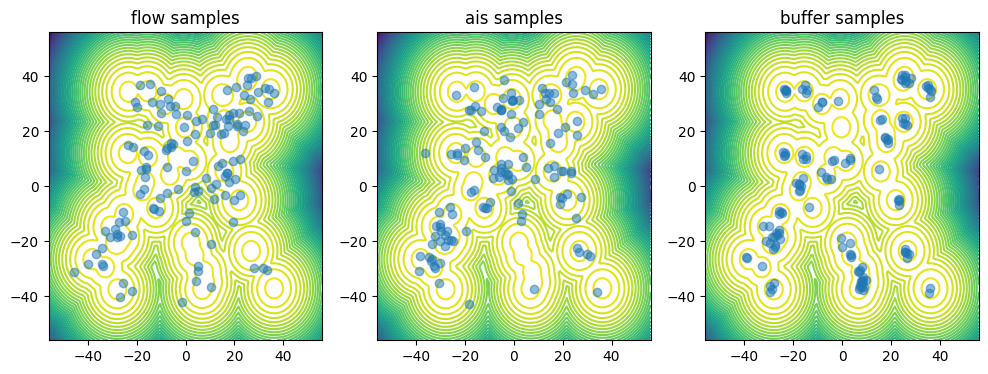

loss: 8.546055793762207, ess base: 0.3481827974319458,ess ais: 0.18555395305156708:  33%|███▎      | 1335/4000 [04:49<29:40,  1.50it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.33942985534668, ess base: 0.24004065990447998,ess ais: 0.12309165298938751:  33%|███▎      | 1336/4000 [04:50<23:37,  1.88it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.214702606201172, ess base: 0.2848920226097107,ess ais: 0.08688551187515259:  33%|███▎      | 1337/4000 [04:50<19:21,  2.29it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.190046310424805, ess base: 0.2367008924484253,ess ais: 0.05888888239860535:  33%|███▎      | 1338/4000 [04:50<16:22,  2.71it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 29.75994873046875, ess base: 0.22536376118659973,ess ais: 0.06072726100683212:  33%|███▎      | 1339/4000 [04:50<14:17,  3.10it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.116546630859375, ess base: 0.26534411311149597,ess ais: 0.09601661562919617:  34%|███▎      | 1340/4000 [04:50<12:48,  3.46it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.607619285583496, ess base: 0.19008751213550568,ess ais: 0.04511059820652008:  34%|███▎      | 1341/4000 [04:51<11:47,  3.76it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.814528465270996, ess base: 0.3021509051322937,ess ais: 0.15184184908866882:  34%|███▎      | 1342/4000 [04:51<11:08,  3.98it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.434995651245117, ess base: 0.2832081913948059,ess ais: 0.1772652268409729:  34%|███▎      | 1343/4000 [04:51<10:23,  4.26it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.478010177612305, ess base: 0.26946571469306946,ess ais: 0.08055893331766129:  34%|███▎      | 1345/4000 [04:52<10:04,  4.39it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.79359245300293, ess base: 0.3113412857055664,ess ais: 0.16570816934108734:  34%|███▎      | 1346/4000 [04:52<09:52,  4.48it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.032302856445312, ess base: 0.21306514739990234,ess ais: 0.03293487802147865:  34%|███▎      | 1347/4000 [04:52<09:43,  4.55it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7474486272.0, ess base: 0.2692575454711914,ess ais: 0.1296715885400772:  34%|███▎      | 1348/4000 [04:52<09:38,  4.58it/s]       

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.93864631652832, ess base: 0.24134337902069092,ess ais: 0.14487650990486145:  34%|███▎      | 1349/4000 [04:52<09:35,  4.61it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.329964637756348, ess base: 0.2761532962322235,ess ais: 0.15127626061439514:  34%|███▍      | 1350/4000 [04:53<09:32,  4.63it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.018746376037598, ess base: 0.2521556317806244,ess ais: 0.08115138858556747:  34%|███▍      | 1351/4000 [04:53<09:26,  4.68it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.916545867919922, ess base: 0.2036752700805664,ess ais: 0.038788534700870514:  34%|███▍      | 1352/4000 [04:53<09:22,  4.71it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.563750267028809, ess base: 0.2999021112918854,ess ais: 0.11180733144283295:  34%|███▍      | 1353/4000 [04:53<09:17,  4.75it/s] 

8 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.953913688659668, ess base: 0.33446070551872253,ess ais: 0.17264920473098755:  34%|███▍      | 1354/4000 [04:53<09:14,  4.77it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.424520492553711, ess base: 0.10449289530515671,ess ais: 0.007936508394777775:  34%|███▍      | 1356/4000 [04:54<09:25,  4.67it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.463899612426758, ess base: 0.29367440938949585,ess ais: 0.007936508394777775:  34%|███▍      | 1357/4000 [04:54<09:29,  4.64it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.110689163208008, ess base: 0.26742714643478394,ess ais: 0.11763820797204971:  34%|███▍      | 1358/4000 [04:54<09:34,  4.60it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.736407279968262, ess base: 0.26121044158935547,ess ais: 0.05475909262895584:  34%|███▍      | 1359/4000 [04:55<09:40,  4.55it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.037232398986816, ess base: 0.34025388956069946,ess ais: 0.1353551745414734:  34%|███▍      | 1360/4000 [04:55<09:39,  4.56it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.593330383300781, ess base: 0.24763217568397522,ess ais: 0.0943988785147667:  34%|███▍      | 1361/4000 [04:55<09:39,  4.55it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.070441246032715, ess base: 0.2927577793598175,ess ais: 0.007936508394777775:  34%|███▍      | 1362/4000 [04:55<09:39,  4.55it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.383159637451172, ess base: 0.3152850568294525,ess ais: 0.1547272950410843:  34%|███▍      | 1363/4000 [04:55<09:41,  4.54it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.570186614990234, ess base: 0.29562604427337646,ess ais: 0.15683335065841675:  34%|███▍      | 1364/4000 [04:56<09:20,  4.70it/s]

nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.8484907150268555, ess base: 0.2646764814853668,ess ais: 0.1101858913898468:  34%|███▍      | 1366/4000 [04:56<09:15,  4.74it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.810273170471191, ess base: 0.2818446457386017,ess ais: 0.1302039474248886:  34%|███▍      | 1367/4000 [04:56<09:15,  4.74it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.609686851501465, ess base: 0.2828659117221832,ess ais: 0.06255971640348434:  34%|███▍      | 1368/4000 [04:56<09:22,  4.68it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.056842803955078, ess base: 0.2505757212638855,ess ais: 0.09684183448553085:  34%|███▍      | 1369/4000 [04:57<09:30,  4.62it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.36568546295166, ess base: 0.3559946119785309,ess ais: 0.1898585706949234:  34%|███▍      | 1370/4000 [04:57<09:28,  4.63it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.091567993164062, ess base: 0.25367471575737,ess ais: 0.11412487179040909:  34%|███▍      | 1371/4000 [04:57<09:26,  4.64it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.63790512084961, ess base: 0.32143163681030273,ess ais: 0.007936570793390274:  34%|███▍      | 1372/4000 [04:57<09:27,  4.63it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.726544380187988, ess base: 0.24812589585781097,ess ais: 0.007874015718698502:  34%|███▍      | 1373/4000 [04:58<09:27,  4.63it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1267855.875, ess base: 0.1853848546743393,ess ais: 0.02668975479900837:  34%|███▍      | 1374/4000 [04:58<09:27,  4.63it/s]        

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.858686447143555, ess base: 0.2361038625240326,ess ais: 0.0078125:  34%|███▍      | 1375/4000 [04:58<09:23,  4.66it/s]    

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.064634323120117, ess base: 0.297282874584198,ess ais: 0.1557472199201584:  34%|███▍      | 1377/4000 [04:58<09:22,  4.66it/s]   

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.167070388793945, ess base: 0.27438607811927795,ess ais: 0.119852215051651:  34%|███▍      | 1378/4000 [04:59<09:24,  4.65it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.374200820922852, ess base: 0.2921588122844696,ess ais: 0.008064515888690948:  34%|███▍      | 1379/4000 [04:59<09:22,  4.66it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.097249031066895, ess base: 0.2670469284057617,ess ais: 0.05479687452316284:  34%|███▍      | 1380/4000 [04:59<09:23,  4.65it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.950139045715332, ess base: 0.22819772362709045,ess ais: 0.07969013601541519:  35%|███▍      | 1381/4000 [04:59<09:27,  4.61it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.611345291137695, ess base: 0.21758076548576355,ess ais: 0.10445629805326462:  35%|███▍      | 1382/4000 [04:59<09:30,  4.59it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.048510551452637, ess base: 0.2851203382015228,ess ais: 0.12036259472370148:  35%|███▍      | 1383/4000 [05:00<09:29,  4.59it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.8568220138549805, ess base: 0.28117018938064575,ess ais: 0.14693015813827515:  35%|███▍      | 1384/4000 [05:00<09:27,  4.61it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.916818141937256, ess base: 0.27917081117630005,ess ais: 0.12313807755708694:  35%|███▍      | 1385/4000 [05:00<09:26,  4.62it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.088458061218262, ess base: 0.27593833208084106,ess ais: 0.1145070493221283:  35%|███▍      | 1386/4000 [05:00<09:28,  4.60it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.838678359985352, ess base: 0.18711160123348236,ess ais: 0.028171638026833534:  35%|███▍      | 1387/4000 [05:01<09:25,  4.62it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.808418273925781, ess base: 0.2991524338722229,ess ais: 0.16450032591819763:  35%|███▍      | 1388/4000 [05:01<09:21,  4.65it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.424236297607422, ess base: 0.355473130941391,ess ais: 0.17900240421295166:  35%|███▍      | 1389/4000 [05:01<09:19,  4.66it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.54153823852539, ess base: 0.3040051758289337,ess ais: 0.14886799454689026:  35%|███▍      | 1390/4000 [05:01<09:20,  4.65it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.800260543823242, ess base: 0.251127153635025,ess ais: 0.07623156160116196:  35%|███▍      | 1392/4000 [05:02<09:26,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.94727897644043, ess base: 0.2573731243610382,ess ais: 0.12762804329395294:  35%|███▍      | 1393/4000 [05:02<09:34,  4.54it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.475784301757812, ess base: 0.2860025465488434,ess ais: 0.10281796753406525:  35%|███▍      | 1394/4000 [05:02<09:25,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.989832878112793, ess base: 0.34285005927085876,ess ais: 0.22640962898731232:  35%|███▍      | 1395/4000 [05:02<09:18,  4.67it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.75499439239502, ess base: 0.24117004871368408,ess ais: 0.0770251452922821:  35%|███▍      | 1396/4000 [05:02<09:15,  4.69it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.110843658447266, ess base: 0.22579728066921234,ess ais: 0.08541197329759598:  35%|███▍      | 1397/4000 [05:03<09:12,  4.71it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.678159713745117, ess base: 0.19161486625671387,ess ais: 0.036633480340242386:  35%|███▍      | 1398/4000 [05:03<09:09,  4.73it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.518719673156738, ess base: 0.3350004553794861,ess ais: 0.2209254801273346:  35%|███▍      | 1399/4000 [05:03<09:07,  4.75it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.251029968261719, ess base: 0.2944342792034149,ess ais: 0.1599544882774353:  35%|███▌      | 1400/4000 [05:03<09:07,  4.75it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.537878036499023, ess base: 0.24493570625782013,ess ais: 0.07510051876306534:  35%|███▌      | 1401/4000 [05:04<09:08,  4.74it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.183914184570312, ess base: 0.25062745809555054,ess ais: 0.1094505563378334:  35%|███▌      | 1402/4000 [05:04<09:09,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.39970874786377, ess base: 0.2236587256193161,ess ais: 0.06998851150274277:  35%|███▌      | 1403/4000 [05:04<09:06,  4.75it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.09528636932373, ess base: 0.3151528537273407,ess ais: 0.10391207039356232:  35%|███▌      | 1404/4000 [05:04<09:04,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.176965713500977, ess base: 0.27029281854629517,ess ais: 0.1405337154865265:  35%|███▌      | 1406/4000 [05:05<09:18,  4.64it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.82989501953125, ess base: 0.24398313462734222,ess ais: 0.1352766752243042:  35%|███▌      | 1407/4000 [05:05<09:28,  4.56it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.923501014709473, ess base: 0.25357452034950256,ess ais: 0.12252987921237946:  35%|███▌      | 1408/4000 [05:05<09:25,  4.59it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.738162994384766, ess base: 0.2703072130680084,ess ais: 0.1615995466709137:  35%|███▌      | 1409/4000 [05:05<09:26,  4.58it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.43429946899414, ess base: 0.2829793393611908,ess ais: 0.171797513961792:  35%|███▌      | 1410/4000 [05:05<09:28,  4.56it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.089441299438477, ess base: 0.3006899058818817,ess ais: 0.18915587663650513:  35%|███▌      | 1411/4000 [05:06<09:20,  4.62it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.572778701782227, ess base: 0.2707187235355377,ess ais: 0.00800000037997961:  35%|███▌      | 1412/4000 [05:06<09:21,  4.61it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.088254928588867, ess base: 0.24564869701862335,ess ais: 0.09147228300571442:  35%|███▌      | 1413/4000 [05:06<09:20,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.478254187930989e+32, ess base: 0.2056128978729248,ess ais: 0.022378262132406235:  35%|███▌      | 1414/4000 [05:06<09:19,  4.62it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.578346252441406, ess base: 0.2914745509624481,ess ais: 0.12797389924526215:  35%|███▌      | 1415/4000 [05:07<09:20,  4.61it/s]     

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.879920959472656, ess base: 0.24923743307590485,ess ais: 0.11484760046005249:  35%|███▌      | 1416/4000 [05:07<09:21,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.8004045486450195, ess base: 0.2544843256473541,ess ais: 0.09741133451461792:  35%|███▌      | 1418/4000 [05:07<09:21,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.264426231384277, ess base: 0.31180858612060547,ess ais: 0.15023523569107056:  35%|███▌      | 1419/4000 [05:07<09:22,  4.59it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.30672770738601685,ess ais: 0.00800000037997961:  36%|███▌      | 1420/4000 [05:08<09:05,  4.73it/s]              

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.712176322937012, ess base: 0.3521224558353424,ess ais: 0.20678545534610748:  36%|███▌      | 1422/4000 [05:08<09:16,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.431489944458008, ess base: 0.34137579798698425,ess ais: 0.21606197953224182:  36%|███▌      | 1423/4000 [05:08<09:18,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.365618705749512, ess base: 0.3666825294494629,ess ais: 0.23864413797855377:  36%|███▌      | 1424/4000 [05:09<09:23,  4.57it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.1195650100708, ess base: 0.3107384741306305,ess ais: 0.10737714916467667:  36%|███▌      | 1425/4000 [05:09<09:22,  4.58it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 159.6351318359375, ess base: 0.33932560682296753,ess ais: 0.1743430495262146:  36%|███▌      | 1426/4000 [05:09<09:22,  4.58it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.003114700317383, ess base: 0.26409152150154114,ess ais: 0.06577697396278381:  36%|███▌      | 1427/4000 [05:09<09:19,  4.60it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.922299861907959, ess base: 0.2820119857788086,ess ais: 0.10753819346427917:  36%|███▌      | 1429/4000 [05:10<09:22,  4.57it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.171558380126953, ess base: 0.28495723009109497,ess ais: 0.11650779843330383:  36%|███▌      | 1430/4000 [05:10<09:22,  4.57it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.647523880004883, ess base: 0.2717778980731964,ess ais: 0.08735911548137665:  36%|███▌      | 1431/4000 [05:10<09:22,  4.56it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.825069427490234, ess base: 0.1729615032672882,ess ais: 0.03634131699800491:  36%|███▌      | 1432/4000 [05:10<09:17,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.2739839553833, ess base: 0.308468222618103,ess ais: 0.15733535587787628:  36%|███▌      | 1433/4000 [05:10<09:17,  4.61it/s]   

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.622149467468262, ess base: 0.31984880566596985,ess ais: 0.16473087668418884:  36%|███▌      | 1436/4000 [05:11<09:11,  4.65it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.834030151367188, ess base: 0.3355221450328827,ess ais: 0.17493706941604614:  36%|███▌      | 1437/4000 [05:11<09:11,  4.65it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.092183113098145, ess base: 0.24326324462890625,ess ais: 0.008130080997943878:  36%|███▌      | 1438/4000 [05:12<09:15,  4.61it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 501949338222592.0, ess base: 0.3050912022590637,ess ais: 0.11473289132118225:  36%|███▌      | 1439/4000 [05:12<09:13,  4.63it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.669246673583984, ess base: 0.24116681516170502,ess ais: 0.1304032802581787:  36%|███▌      | 1440/4000 [05:12<09:13,  4.62it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.160903930664062, ess base: 0.3058546483516693,ess ais: 0.008064515888690948:  36%|███▌      | 1441/4000 [05:12<08:55,  4.78it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.73878812789917, ess base: 0.229656383395195,ess ais: 0.09175726771354675:  36%|███▌      | 1442/4000 [05:12<08:41,  4.91it/s]   

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.099767684936523, ess base: 0.2906542718410492,ess ais: 0.12265395373106003:  36%|███▌      | 1444/4000 [05:13<08:54,  4.78it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.029151916503906, ess base: 0.3243961036205292,ess ais: 0.007936508394777775:  36%|███▌      | 1445/4000 [05:13<08:57,  4.76it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.46439266204834, ess base: 0.29319286346435547,ess ais: 0.11658065766096115:  36%|███▌      | 1446/4000 [05:13<08:59,  4.73it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.559673309326172, ess base: 0.28333693742752075,ess ais: 0.1368863433599472:  36%|███▌      | 1447/4000 [05:13<09:03,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 76.18253326416016, ess base: 0.32623693346977234,ess ais: 0.12506748735904694:  36%|███▌      | 1448/4000 [05:14<09:06,  4.67it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.689093589782715, ess base: 0.27579718828201294,ess ais: 0.15673157572746277:  36%|███▋      | 1450/4000 [05:14<09:20,  4.55it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.14388656616211, ess base: 0.2800801396369934,ess ais: 0.1452874392271042:  36%|███▋      | 1451/4000 [05:14<09:27,  4.49it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 20.835350036621094, ess base: 0.30433163046836853,ess ais: 0.13487586379051208:  36%|███▋      | 1452/4000 [05:15<09:22,  4.53it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.537088394165039, ess base: 0.27814093232154846,ess ais: 0.1505068689584732:  36%|███▋      | 1453/4000 [05:15<09:16,  4.58it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.950843811035156, ess base: 0.25346696376800537,ess ais: 0.0685720443725586:  36%|███▋      | 1454/4000 [05:15<09:11,  4.62it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.880012512207031, ess base: 0.23260752856731415,ess ais: 0.04028164595365524:  36%|███▋      | 1455/4000 [05:15<09:08,  4.64it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.819297790527344, ess base: 0.24775005877017975,ess ais: 0.11355465650558472:  36%|███▋      | 1456/4000 [05:15<09:14,  4.59it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.129446029663086, ess base: 0.2197335660457611,ess ais: 0.1235836073756218:  36%|███▋      | 1457/4000 [05:16<09:13,  4.59it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.801450729370117, ess base: 0.23844212293624878,ess ais: 0.10286544263362885:  36%|███▋      | 1458/4000 [05:16<09:10,  4.62it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.451696395874023, ess base: 0.27995845675468445,ess ais: 0.13228443264961243:  36%|███▋      | 1459/4000 [05:16<09:11,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.342855453491211, ess base: 0.33660754561424255,ess ais: 0.19947177171707153:  36%|███▋      | 1460/4000 [05:16<09:08,  4.63it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.96017074584961, ess base: 0.300109326839447,ess ais: 0.16527430713176727:  37%|███▋      | 1461/4000 [05:16<09:05,  4.66it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.865880012512207, ess base: 0.3272019624710083,ess ais: 0.22011113166809082:  37%|███▋      | 1462/4000 [05:17<09:01,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 69.32257080078125, ess base: 0.38453245162963867,ess ais: 0.23790183663368225:  37%|███▋      | 1463/4000 [05:17<08:58,  4.71it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.085881233215332, ess base: 0.29828542470932007,ess ais: 0.1446135938167572:  37%|███▋      | 1464/4000 [05:17<08:56,  4.73it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.881536483764648, ess base: 0.2997777462005615,ess ais: 0.18455107510089874:  37%|███▋      | 1465/4000 [05:17<08:51,  4.77it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.64080810546875, ess base: 0.27351444959640503,ess ais: 0.15142306685447693:  37%|███▋      | 1466/4000 [05:18<08:48,  4.79it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.384139060974121, ess base: 0.28377655148506165,ess ais: 0.08347489684820175:  37%|███▋      | 1467/4000 [05:18<08:47,  4.80it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.303141593933105, ess base: 0.30029478669166565,ess ais: 0.1391305923461914:  37%|███▋      | 1468/4000 [05:18<08:46,  4.81it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.138453483581543, ess base: 0.28272056579589844,ess ais: 0.1283969283103943:  37%|███▋      | 1469/4000 [05:18<08:44,  4.83it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.293170928955078, ess base: 0.30751293897628784,ess ais: 0.17703597247600555:  37%|███▋      | 1470/4000 [05:18<08:45,  4.82it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.394977569580078, ess base: 0.3057279586791992,ess ais: 0.007938030175864697:  37%|███▋      | 1472/4000 [05:19<08:57,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.71703815460205, ess base: 0.2601735293865204,ess ais: 0.03559541702270508:  37%|███▋      | 1473/4000 [05:19<08:53,  4.73it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.689157485961914, ess base: 0.29042741656303406,ess ais: 0.09319587796926498:  37%|███▋      | 1474/4000 [05:19<08:52,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.455209732055664, ess base: 0.25078266859054565,ess ais: 0.1040445864200592:  37%|███▋      | 1475/4000 [05:19<08:55,  4.72it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.721083641052246, ess base: 0.26642048358917236,ess ais: 0.09335574507713318:  37%|███▋      | 1476/4000 [05:20<08:56,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 42.55272674560547, ess base: 0.3522249758243561,ess ais: 0.19491198658943176:  37%|███▋      | 1478/4000 [05:20<08:52,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.774761199951172, ess base: 0.342403382062912,ess ais: 0.007936508394777775:  37%|███▋      | 1480/4000 [05:20<08:47,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.23006820678711, ess base: 0.3010474443435669,ess ais: 0.14575575292110443:  37%|███▋      | 1481/4000 [05:21<08:42,  4.82it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.942915916442871, ess base: 0.24438977241516113,ess ais: 0.08786243200302124:  37%|███▋      | 1483/4000 [05:21<08:42,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.679093360900879, ess base: 0.309468150138855,ess ais: 0.157020702958107:  37%|███▋      | 1484/4000 [05:21<08:43,  4.80it/s]    

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.746726036071777, ess base: 0.36044543981552124,ess ais: 0.16124682128429413:  37%|███▋      | 1485/4000 [05:22<08:46,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.927920818328857, ess base: 0.3112189471721649,ess ais: 0.14180174469947815:  37%|███▋      | 1486/4000 [05:22<08:44,  4.79it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.848140716552734, ess base: 0.22490280866622925,ess ais: 0.008064515888690948:  37%|███▋      | 1487/4000 [05:22<08:31,  4.91it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.856667518615723, ess base: 0.3793773055076599,ess ais: 0.19401323795318604:  37%|███▋      | 1489/4000 [05:22<08:43,  4.80it/s]  

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.843629837036133, ess base: 0.3652038872241974,ess ais: 0.2208642065525055:  37%|███▋      | 1490/4000 [05:23<08:24,  4.98it/s] 

nan loss in replay step
nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.3386839032173157,ess ais: 0.15468190610408783:  37%|███▋      | 1492/4000 [05:23<08:22,  4.99it/s]              

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.849832534790039, ess base: 0.2671468257904053,ess ais: 0.14382025599479675:  37%|███▋      | 1493/4000 [05:23<08:15,  5.06it/s]

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.910489082336426, ess base: 0.34241390228271484,ess ais: 0.008064515888690948:  37%|███▋      | 1495/4000 [05:24<08:20,  5.01it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.887995719909668, ess base: 0.22029049694538116,ess ais: 0.03454570099711418:  37%|███▋      | 1496/4000 [05:24<08:13,  5.08it/s] 

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.06382942199707, ess base: 0.24531811475753784,ess ais: 0.06087217107415199:  37%|███▋      | 1498/4000 [05:24<08:20,  5.00it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.374387741088867, ess base: 0.24972516298294067,ess ais: 0.10254034399986267:  37%|███▋      | 1499/4000 [05:24<08:31,  4.89it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
nan grad norm in replay step


loss: inf, ess base: 0.35606855154037476,ess ais: 0.2153189331293106:  38%|███▊      | 1500/4000 [05:25<08:26,  4.94it/s]               

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 3.735033854510148e+35, ess base: 0.34020137786865234,ess ais: 0.14075656235218048:  38%|███▊      | 1502/4000 [05:25<08:36,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 9.711322784423828, ess base: 0.33312109112739563,ess ais: 0.17348769307136536:  38%|███▊      | 1503/4000 [05:25<08:44,  4.76it/s]    

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.699433326721191, ess base: 0.2894383370876312,ess ais: 0.14800335466861725:  38%|███▊      | 1504/4000 [05:25<08:42,  4.77it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 36.3153190612793, ess base: 0.3017474114894867,ess ais: 0.10813120007514954:  38%|███▊      | 1505/4000 [05:26<08:42,  4.77it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.36763858795166, ess base: 0.348479688167572,ess ais: 0.007936508394777775:  38%|███▊      | 1506/4000 [05:26<08:44,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.984820365905762, ess base: 0.263475626707077,ess ais: 0.007874015718698502:  38%|███▊      | 1507/4000 [05:26<08:27,  4.91it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 19.9717960357666, ess base: 0.17902259528636932,ess ais: 0.034491315484046936:  38%|███▊      | 1508/4000 [05:26<08:00,  5.19it/s]

nan loss in replay step
nan loss in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 9.199731826782227, ess base: 0.2572019100189209,ess ais: 0.0650559589266777:  38%|███▊      | 1510/4000 [05:27<07:55,  5.24it/s]  

5 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.23713476955890656,ess ais: 0.007874015718698502:  38%|███▊      | 1511/4000 [05:27<07:52,  5.27it/s]           

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.658305168151855, ess base: 0.3197996914386749,ess ais: 0.11598563194274902:  38%|███▊      | 1513/4000 [05:27<08:21,  4.96it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.297064781188965, ess base: 0.30082231760025024,ess ais: 0.14797881245613098:  38%|███▊      | 1514/4000 [05:27<08:28,  4.89it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.274482727050781, ess base: 0.2707454264163971,ess ais: 0.11307203769683838:  38%|███▊      | 1515/4000 [05:28<08:35,  4.82it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.651499271392822, ess base: 0.31347930431365967,ess ais: 0.16831137239933014:  38%|███▊      | 1516/4000 [05:28<08:40,  4.77it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 75.72144317626953, ess base: 0.39643189311027527,ess ais: 0.23447540402412415:  38%|███▊      | 1517/4000 [05:28<08:42,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.045741081237793, ess base: 0.2621559798717499,ess ais: 0.1341770440340042:  38%|███▊      | 1518/4000 [05:28<08:50,  4.68it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.59890365600586, ess base: 0.2927408218383789,ess ais: 0.16558460891246796:  38%|███▊      | 1520/4000 [05:29<08:56,  4.62it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.796382427215576, ess base: 0.3221014738082886,ess ais: 0.1298154890537262:  38%|███▊      | 1521/4000 [05:29<08:55,  4.63it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.591278076171875, ess base: 0.2836087644100189,ess ais: 0.042544860392808914:  38%|███▊      | 1522/4000 [05:29<08:54,  4.63it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.815360069274902, ess base: 0.3250702917575836,ess ais: 0.16424016654491425:  38%|███▊      | 1523/4000 [05:29<08:36,  4.80it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.246297836303711, ess base: 0.35209518671035767,ess ais: 0.15292015671730042:  38%|███▊      | 1526/4000 [05:30<08:51,  4.66it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.707206726074219, ess base: 0.3352346122264862,ess ais: 0.16912664473056793:  38%|███▊      | 1527/4000 [05:30<08:52,  4.64it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.827381610870361, ess base: 0.27489736676216125,ess ais: 0.09756582975387573:  38%|███▊      | 1528/4000 [05:30<08:56,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.935726165771484, ess base: 0.2968098819255829,ess ais: 0.007874015718698502:  38%|███▊      | 1529/4000 [05:31<08:56,  4.61it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.748287200927734, ess base: 0.2150239199399948,ess ais: 0.008064515888690948:  38%|███▊      | 1530/4000 [05:31<08:56,  4.61it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.46860122680664, ess base: 0.3141113519668579,ess ais: 0.14383216202259064:  38%|███▊      | 1531/4000 [05:31<08:55,  4.61it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.51535415649414, ess base: 0.30303722620010376,ess ais: 0.1680160015821457:  38%|███▊      | 1533/4000 [05:31<08:52,  4.63it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.703807830810547, ess base: 0.3083069920539856,ess ais: 0.08172405511140823:  38%|███▊      | 1534/4000 [05:32<08:55,  4.60it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 13.054624557495117, ess base: 0.2785511016845703,ess ais: 0.1274213343858719:  38%|███▊      | 1535/4000 [05:32<08:58,  4.57it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.331607818603516, ess base: 0.35260894894599915,ess ais: 0.22738799452781677:  38%|███▊      | 1537/4000 [05:32<08:56,  4.59it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.797096252441406, ess base: 0.284650593996048,ess ais: 0.08243259787559509:  38%|███▊      | 1538/4000 [05:33<08:52,  4.62it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.969141960144043, ess base: 0.3184778094291687,ess ais: 0.10973933339118958:  38%|███▊      | 1539/4000 [05:33<08:52,  4.62it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.215267181396484, ess base: 0.28564244508743286,ess ais: 0.11567960679531097:  38%|███▊      | 1540/4000 [05:33<08:51,  4.63it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.46413803100586, ess base: 0.3120259642601013,ess ais: 0.008060112595558167:  39%|███▊      | 1543/4000 [05:34<08:49,  4.64it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 2.071858598660051e+24, ess base: 0.2516196668148041,ess ais: 0.08034700900316238:  39%|███▊      | 1544/4000 [05:34<08:48,  4.65it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.38150405883789, ess base: 0.3050803542137146,ess ais: 0.09865632653236389:  39%|███▊      | 1545/4000 [05:34<08:47,  4.65it/s]     

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.2782825529575348,ess ais: 0.00800000037997961:  39%|███▊      | 1546/4000 [05:34<08:30,  4.80it/s]             

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.509990692138672, ess base: 0.3063216507434845,ess ais: 0.14960527420043945:  39%|███▊      | 1547/4000 [05:34<08:21,  4.89it/s]

nan loss in replay step


loss: 8.96934700012207, ess base: 0.2884027659893036,ess ais: 0.17751039564609528:  39%|███▊      | 1549/4000 [05:35<08:33,  4.77it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.116472244262695, ess base: 0.36312976479530334,ess ais: 0.20792239904403687:  39%|███▉      | 1550/4000 [05:35<08:39,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.353897094726562, ess base: 0.28188323974609375,ess ais: 0.13578766584396362:  39%|███▉      | 1551/4000 [05:35<08:45,  4.66it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.239794731140137, ess base: 0.37366724014282227,ess ais: 0.2533246874809265:  39%|███▉      | 1552/4000 [05:36<08:46,  4.65it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.600441932678223, ess base: 0.24469682574272156,ess ais: 0.13010181486606598:  39%|███▉      | 1553/4000 [05:36<08:46,  4.65it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.06016731262207, ess base: 0.3637387156486511,ess ais: 0.23761537671089172:  39%|███▉      | 1554/4000 [05:36<08:47,  4.64it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.590119361877441, ess base: 0.27001336216926575,ess ais: 0.10896898806095123:  39%|███▉      | 1555/4000 [05:36<08:48,  4.63it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.20462703704834, ess base: 0.3422847092151642,ess ais: 0.1886013150215149:  39%|███▉      | 1556/4000 [05:36<08:47,  4.63it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.667130470275879, ess base: 0.3641265332698822,ess ais: 0.21024470031261444:  39%|███▉      | 1557/4000 [05:37<08:50,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.928140163421631, ess base: 0.27039533853530884,ess ais: 0.007936508394777775:  39%|███▉      | 1558/4000 [05:37<08:49,  4.62it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.752492427825928, ess base: 0.4122330844402313,ess ais: 0.2556096911430359:  39%|███▉      | 1561/4000 [05:37<08:48,  4.61it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.16651725769043, ess base: 0.291772723197937,ess ais: 0.16430848836898804:  39%|███▉      | 1562/4000 [05:38<08:49,  4.60it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.70472526550293, ess base: 0.3344809412956238,ess ais: 0.2198948860168457:  39%|███▉      | 1565/4000 [05:38<09:35,  4.23it/s]    

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.111120223999023, ess base: 0.30371546745300293,ess ais: 0.1508820652961731:  39%|███▉      | 1566/4000 [05:39<09:18,  4.36it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.555889129638672, ess base: 0.254251092672348,ess ais: 0.1062084510922432:  39%|███▉      | 1567/4000 [05:39<09:10,  4.42it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.605129241943359, ess base: 0.26487624645233154,ess ais: 0.007936508394777775:  39%|███▉      | 1568/4000 [05:39<09:03,  4.48it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 12.707415580749512, ess base: 0.2990366816520691,ess ais: 0.1350201964378357:  39%|███▉      | 1569/4000 [05:39<09:05,  4.45it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.74309253692627, ess base: 0.24952305853366852,ess ais: 0.054806482046842575:  39%|███▉      | 1571/4000 [05:40<08:49,  4.59it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.303544998168945, ess base: 0.24710072576999664,ess ais: 0.09943606704473495:  39%|███▉      | 1572/4000 [05:40<08:43,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9750237464904785, ess base: 0.3317134976387024,ess ais: 0.14357051253318787:  39%|███▉      | 1574/4000 [05:40<08:39,  4.67it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.374073028564453, ess base: 0.215883269906044,ess ais: 0.007874015718698502:  39%|███▉      | 1575/4000 [05:41<08:41,  4.65it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.229473114013672, ess base: 0.2520606517791748,ess ais: 0.11092357337474823:  39%|███▉      | 1576/4000 [05:41<08:24,  4.80it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.905251979827881, ess base: 0.2248106598854065,ess ais: 0.06024168059229851:  39%|███▉      | 1577/4000 [05:41<08:12,  4.92it/s]

nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: inf, ess base: 0.411389023065567,ess ais: 0.29255154728889465:  39%|███▉      | 1579/4000 [05:41<07:55,  5.09it/s]               

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.911892890930176, ess base: 0.29202932119369507,ess ais: 0.12150321900844574:  40%|███▉      | 1581/4000 [05:42<08:13,  4.90it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.603785514831543, ess base: 0.28929710388183594,ess ais: 0.007936508394777775:  40%|███▉      | 1583/4000 [05:42<08:23,  4.80it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.134825706481934, ess base: 0.34402528405189514,ess ais: 0.19081684947013855:  40%|███▉      | 1584/4000 [05:42<08:29,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.942831039428711, ess base: 0.30559200048446655,ess ais: 0.13577201962471008:  40%|███▉      | 1585/4000 [05:43<08:33,  4.70it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.451257705688477, ess base: 0.3248378038406372,ess ais: 0.14907369017601013:  40%|███▉      | 1586/4000 [05:43<08:35,  4.69it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.005064964294434, ess base: 0.31622114777565,ess ais: 0.17248553037643433:  40%|███▉      | 1587/4000 [05:43<08:39,  4.64it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.038703918457031, ess base: 0.3767622709274292,ess ais: 0.18459853529930115:  40%|███▉      | 1588/4000 [05:43<08:40,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.29111385345459, ess base: 0.27715155482292175,ess ais: 0.1037539690732956:  40%|███▉      | 1589/4000 [05:44<08:38,  4.65it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.371786117553711, ess base: 0.3081355392932892,ess ais: 0.1750289350748062:  40%|███▉      | 1590/4000 [05:44<08:46,  4.58it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.404855728149414, ess base: 0.35163456201553345,ess ais: 0.1928437352180481:  40%|███▉      | 1591/4000 [05:44<08:42,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.203614234924316, ess base: 0.2802370488643646,ess ais: 0.11383125931024551:  40%|███▉      | 1592/4000 [05:44<08:39,  4.64it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.088823318481445, ess base: 0.24071313440799713,ess ais: 0.10859578847885132:  40%|███▉      | 1594/4000 [05:45<08:44,  4.58it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.15762710571289, ess base: 0.31548380851745605,ess ais: 0.1279546171426773:  40%|███▉      | 1595/4000 [05:45<08:40,  4.62it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.612277030944824, ess base: 0.21719804406166077,ess ais: 0.03873990848660469:  40%|███▉      | 1596/4000 [05:45<08:35,  4.67it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.153562545776367, ess base: 0.28632715344429016,ess ais: 0.13755249977111816:  40%|███▉      | 1597/4000 [05:45<08:35,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.843410015106201, ess base: 0.29653286933898926,ess ais: 0.1506650596857071:  40%|███▉      | 1598/4000 [05:45<08:35,  4.66it/s] 

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.447732925415039, ess base: 0.2864832282066345,ess ais: 0.17549742758274078:  40%|████      | 1600/4000 [05:46<08:34,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.96243143081665, ess base: 0.3465041518211365,ess ais: 0.17148442566394806:  40%|████      | 1601/4000 [05:46<08:20,  4.79it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.199604988098145, ess base: 0.3643508851528168,ess ais: 0.1796923577785492:  40%|████      | 1603/4000 [05:47<08:29,  4.71it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.906813621520996, ess base: 0.3750929534435272,ess ais: 0.21216672658920288:  40%|████      | 1605/4000 [05:47<08:33,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.68099308013916, ess base: 0.28714147210121155,ess ais: 0.1060582771897316:  40%|████      | 1606/4000 [05:47<08:35,  4.65it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.951635360717773, ess base: 0.12019733339548111,ess ais: 0.0182218998670578:  40%|████      | 1608/4000 [05:48<08:03,  4.95it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.8916425704956055, ess base: 0.3736313581466675,ess ais: 0.21575962007045746:  40%|████      | 1610/4000 [05:48<08:13,  4.85it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.707036972045898, ess base: 0.23568420112133026,ess ais: 0.09812917560338974:  40%|████      | 1611/4000 [05:48<08:16,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.304615020751953, ess base: 0.2960982918739319,ess ais: 0.1357763558626175:  40%|████      | 1612/4000 [05:48<08:18,  4.79it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.448644638061523, ess base: 0.30397599935531616,ess ais: 0.10059766471385956:  40%|████      | 1613/4000 [05:49<08:18,  4.79it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.63485336303711, ess base: 0.2248292714357376,ess ais: 0.007874015718698502:  40%|████      | 1615/4000 [05:49<08:05,  4.91it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.978219985961914, ess base: 0.34372076392173767,ess ais: 0.115773044526577:  40%|████      | 1617/4000 [05:49<08:20,  4.76it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.182443618774414, ess base: 0.37299907207489014,ess ais: 0.12441227585077286:  40%|████      | 1618/4000 [05:50<08:20,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.716802597045898, ess base: 0.3040449619293213,ess ais: 0.1747242510318756:  40%|████      | 1619/4000 [05:50<08:23,  4.73it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.724452018737793, ess base: 0.36892256140708923,ess ais: 0.013307071290910244:  41%|████      | 1622/4000 [05:50<08:24,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.012295722961426, ess base: 0.2819034457206726,ess ais: 0.008278610184788704:  41%|████      | 1623/4000 [05:51<08:25,  4.70it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.903006553649902, ess base: 0.3240777254104614,ess ais: 0.13660985231399536:  41%|████      | 1624/4000 [05:51<08:26,  4.69it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.83885383605957, ess base: 0.34802892804145813,ess ais: 0.14254648983478546:  41%|████      | 1625/4000 [05:51<08:24,  4.71it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.009119033813477, ess base: 0.22012972831726074,ess ais: 0.058983538299798965:  41%|████      | 1626/4000 [05:51<08:22,  4.72it/s]

6 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.852208137512207, ess base: 0.2791891396045685,ess ais: 0.13095931708812714:  41%|████      | 1627/4000 [05:52<08:24,  4.71it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.884083271026611, ess base: 0.22598998248577118,ess ais: 0.041607581079006195:  41%|████      | 1628/4000 [05:52<08:21,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.864044189453125, ess base: 0.32275334000587463,ess ais: 0.1825997531414032:  41%|████      | 1629/4000 [05:52<08:23,  4.71it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.250484466552734, ess base: 0.3548372983932495,ess ais: 0.007874015718698502:  41%|████      | 1630/4000 [05:52<08:22,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.221436500549316, ess base: 0.2912020981311798,ess ais: 0.007936508394777775:  41%|████      | 1631/4000 [05:52<08:20,  4.73it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.644026756286621, ess base: 0.29791489243507385,ess ais: 0.14882111549377441:  41%|████      | 1632/4000 [05:53<08:23,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.624226570129395, ess base: 0.35400158166885376,ess ais: 0.15922784805297852:  41%|████      | 1635/4000 [05:53<08:20,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.959446430206299, ess base: 0.2932484745979309,ess ais: 0.1525595337152481:  41%|████      | 1636/4000 [05:53<08:19,  4.73it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.327722549438477, ess base: 0.341266930103302,ess ais: 0.16825613379478455:  41%|████      | 1637/4000 [05:54<08:23,  4.69it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.421521186828613, ess base: 0.2827966809272766,ess ais: 0.06789101660251617:  41%|████      | 1639/4000 [05:54<08:21,  4.70it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.57116985321045, ess base: 0.3223138749599457,ess ais: 0.19159504771232605:  41%|████      | 1640/4000 [05:54<08:32,  4.60it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.99038553237915, ess base: 0.37503960728645325,ess ais: 0.22567251324653625:  41%|████      | 1643/4000 [05:55<08:30,  4.62it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.542699813842773, ess base: 0.3626847267150879,ess ais: 0.24021391570568085:  41%|████      | 1644/4000 [05:55<08:33,  4.59it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 852.993896484375, ess base: 0.2828969359397888,ess ais: 0.15359793603420258:  41%|████      | 1645/4000 [05:55<08:33,  4.59it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9123101234436035, ess base: 0.016860608011484146,ess ais: 0.010627247393131256:  41%|████      | 1646/4000 [05:56<08:28,  4.63it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.995586395263672, ess base: 0.3426511287689209,ess ais: 0.19932298362255096:  41%|████      | 1647/4000 [05:56<08:27,  4.64it/s]    

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.556581497192383, ess base: 0.34743377566337585,ess ais: 0.21085840463638306:  41%|████      | 1648/4000 [05:56<08:24,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.30224609375, ess base: 0.271273136138916,ess ais: 0.13586817681789398:  41%|████      | 1649/4000 [05:56<08:20,  4.70it/s]      

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.32702019810676575,ess ais: 0.00800000037997961:  41%|████▏     | 1650/4000 [05:56<08:03,  4.86it/s]        

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: inf, ess base: 0.34416112303733826,ess ais: 0.10511592030525208:  41%|████▏     | 1651/4000 [05:57<07:51,  4.98it/s]

nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.845973491668701, ess base: 0.3417069613933563,ess ais: 0.008064515888690948:  41%|████▏     | 1653/4000 [05:57<08:02,  4.87it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.681730270385742, ess base: 0.312203049659729,ess ais: 0.14312632381916046:  41%|████▏     | 1654/4000 [05:57<08:05,  4.83it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 1105945019023360.0, ess base: 0.33841219544410706,ess ais: 0.17132411897182465:  41%|████▏     | 1655/4000 [05:57<08:14,  4.74it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.72905158996582, ess base: 0.34282517433166504,ess ais: 0.12242291122674942:  41%|████▏     | 1656/4000 [05:58<08:22,  4.67it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.285666465759277, ess base: 0.33954179286956787,ess ais: 0.17652229964733124:  41%|████▏     | 1658/4000 [05:58<08:32,  4.57it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.607722282409668, ess base: 0.29931843280792236,ess ais: 0.15758463740348816:  42%|████▏     | 1662/4000 [05:59<08:22,  4.65it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.61965274810791, ess base: 0.29479655623435974,ess ais: 0.17795024812221527:  42%|████▏     | 1663/4000 [05:59<08:19,  4.68it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.720792770385742, ess base: 0.25916773080825806,ess ais: 0.11006268858909607:  42%|████▏     | 1665/4000 [06:00<08:29,  4.58it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.33591365814209, ess base: 0.2984810769557953,ess ais: 0.08521247655153275:  42%|████▏     | 1666/4000 [06:00<08:29,  4.58it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.825614929199219, ess base: 0.29819121956825256,ess ais: 0.14692652225494385:  42%|████▏     | 1668/4000 [06:00<08:31,  4.56it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.410249710083008, ess base: 0.38558152318000793,ess ais: 0.23816826939582825:  42%|████▏     | 1670/4000 [06:01<08:31,  4.55it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.932817459106445, ess base: 0.3301624357700348,ess ais: 0.18477477133274078:  42%|████▏     | 1671/4000 [06:01<08:36,  4.51it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9409356117248535, ess base: 0.3142015337944031,ess ais: 0.17510585486888885:  42%|████▏     | 1672/4000 [06:01<08:33,  4.54it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.798405647277832, ess base: 0.35910311341285706,ess ais: 0.20150423049926758:  42%|████▏     | 1673/4000 [06:01<08:31,  4.55it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.678434371948242, ess base: 0.3324671685695648,ess ais: 0.12995284795761108:  42%|████▏     | 1674/4000 [06:02<08:32,  4.54it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.612515926361084, ess base: 0.2858889400959015,ess ais: 0.11641330271959305:  42%|████▏     | 1675/4000 [06:02<08:28,  4.58it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.8249311447143555, ess base: 0.25453150272369385,ess ais: 0.0878918468952179:  42%|████▏     | 1676/4000 [06:02<08:27,  4.58it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.78826379776001, ess base: 0.3505822718143463,ess ais: 0.2000599503517151:  42%|████▏     | 1677/4000 [06:02<08:29,  4.56it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.00216293334961, ess base: 0.2954770624637604,ess ais: 0.15510006248950958:  42%|████▏     | 1679/4000 [06:03<08:30,  4.54it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.413348197937012, ess base: 0.36816978454589844,ess ais: 0.17737369239330292:  42%|████▏     | 1680/4000 [06:03<08:29,  4.55it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.599725723266602, ess base: 0.24638628959655762,ess ais: 0.08935524523258209:  42%|████▏     | 1681/4000 [06:03<08:30,  4.54it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.214085578918457, ess base: 0.29830658435821533,ess ais: 0.09907598793506622:  42%|████▏     | 1682/4000 [06:03<08:26,  4.58it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.458508491516113, ess base: 0.30327388644218445,ess ais: 0.15019485354423523:  42%|████▏     | 1683/4000 [06:04<08:26,  4.58it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.30971908569336, ess base: 0.26034867763519287,ess ais: 0.0804881826043129:  42%|████▏     | 1684/4000 [06:04<08:24,  4.59it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.66642951965332, ess base: 0.30013686418533325,ess ais: 0.12969332933425903:  42%|████▏     | 1685/4000 [06:04<08:22,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.925034523010254, ess base: 0.37219110131263733,ess ais: 0.21841296553611755:  42%|████▏     | 1686/4000 [06:04<08:25,  4.58it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.543668746948242, ess base: 0.33996912837028503,ess ais: 0.1650383621454239:  42%|████▏     | 1688/4000 [06:05<08:22,  4.60it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.8460588455200195, ess base: 0.2905811667442322,ess ais: 0.10374632477760315:  42%|████▏     | 1690/4000 [06:05<08:14,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.017927169799805, ess base: 0.4076175391674042,ess ais: 0.10478928685188293:  42%|████▏     | 1691/4000 [06:05<08:08,  4.72it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.489496231079102, ess base: 0.27438196539878845,ess ais: 0.10053520649671555:  42%|████▏     | 1692/4000 [06:06<08:04,  4.76it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.863565921783447, ess base: 0.38120684027671814,ess ais: 0.00800000037997961:  42%|████▏     | 1694/4000 [06:06<08:02,  4.78it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.919807434082031, ess base: 0.3561783730983734,ess ais: 0.17895953357219696:  42%|████▏     | 1696/4000 [06:06<07:53,  4.87it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.494028091430664, ess base: 0.33228644728660583,ess ais: 0.21138177812099457:  42%|████▏     | 1698/4000 [06:07<07:53,  4.86it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.917367935180664, ess base: 0.35605716705322266,ess ais: 0.16822148859500885:  42%|████▏     | 1699/4000 [06:07<07:53,  4.86it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 13.074356079101562, ess base: 0.36637595295906067,ess ais: 0.18730320036411285:  42%|████▎     | 1700/4000 [06:07<08:04,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9204792976379395, ess base: 0.4233720898628235,ess ais: 0.18562662601470947:  43%|████▎     | 1702/4000 [06:08<08:08,  4.70it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.056977272033691, ess base: 0.33388692140579224,ess ais: 0.15064889192581177:  43%|████▎     | 1704/4000 [06:08<08:08,  4.70it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.393495559692383, ess base: 0.34576573967933655,ess ais: 0.175566166639328:  43%|████▎     | 1706/4000 [06:08<08:12,  4.66it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.523651123046875, ess base: 0.2756052315235138,ess ais: 0.05952604487538338:  43%|████▎     | 1707/4000 [06:09<08:19,  4.59it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.211307525634766, ess base: 0.3523009419441223,ess ais: 0.1857052594423294:  43%|████▎     | 1708/4000 [06:09<08:21,  4.57it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.155381202697754, ess base: 0.33053281903266907,ess ais: 0.1036778911948204:  43%|████▎     | 1709/4000 [06:09<08:21,  4.57it/s]

5 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.404970169067383, ess base: 0.2988472580909729,ess ais: 0.0225332323461771:  43%|████▎     | 1710/4000 [06:09<08:22,  4.56it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.787322044372559, ess base: 0.2536452114582062,ess ais: 0.08902028948068619:  43%|████▎     | 1711/4000 [06:10<08:20,  4.58it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.366165161132812, ess base: 0.3398875594139099,ess ais: 0.19779767096042633:  43%|████▎     | 1712/4000 [06:10<08:17,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.028324127197266, ess base: 0.3132176995277405,ess ais: 0.16396836936473846:  43%|████▎     | 1713/4000 [06:10<08:07,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.71467924118042, ess base: 0.36989834904670715,ess ais: 0.22899951040744781:  43%|████▎     | 1716/4000 [06:11<07:54,  4.82it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.149267196655273, ess base: 0.2796124815940857,ess ais: 0.11597009748220444:  43%|████▎     | 1717/4000 [06:11<07:52,  4.83it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.159395217895508, ess base: 0.3559797704219818,ess ais: 0.23924541473388672:  43%|████▎     | 1718/4000 [06:11<07:51,  4.84it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.878877639770508, ess base: 0.3081163763999939,ess ais: 0.10768957436084747:  43%|████▎     | 1719/4000 [06:11<07:51,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.693352699279785, ess base: 0.3211545944213867,ess ais: 0.17936736345291138:  43%|████▎     | 1720/4000 [06:11<07:50,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.851531028747559, ess base: 0.300283819437027,ess ais: 0.15584401786327362:  43%|████▎     | 1721/4000 [06:12<07:50,  4.85it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.92659854888916, ess base: 0.3201456665992737,ess ais: 0.11330637335777283:  43%|████▎     | 1722/4000 [06:12<07:49,  4.86it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.025094032287598, ess base: 0.2714797258377075,ess ais: 0.09070290625095367:  43%|████▎     | 1724/4000 [06:12<07:44,  4.90it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.163545608520508, ess base: 0.3229832053184509,ess ais: 0.1390075385570526:  43%|████▎     | 1725/4000 [06:12<07:43,  4.91it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.824981689453125, ess base: 0.32671308517456055,ess ais: 0.1506827175617218:  43%|████▎     | 1726/4000 [06:13<07:43,  4.90it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.535768508911133, ess base: 0.23184756934642792,ess ais: 0.06311628222465515:  43%|████▎     | 1727/4000 [06:13<07:44,  4.90it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.054426193237305, ess base: 0.2754954993724823,ess ais: 0.1624472290277481:  43%|████▎     | 1728/4000 [06:13<07:44,  4.89it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.833510398864746, ess base: 0.3268353343009949,ess ais: 0.1609073281288147:  43%|████▎     | 1729/4000 [06:13<07:43,  4.90it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.40555477142334, ess base: 0.32391706109046936,ess ais: 0.17159785330295563:  43%|████▎     | 1730/4000 [06:13<07:41,  4.92it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.8330793380737305, ess base: 0.32157084345817566,ess ais: 0.18318195641040802:  43%|████▎     | 1732/4000 [06:14<07:51,  4.81it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.759529113769531, ess base: 0.36307162046432495,ess ais: 0.20851480960845947:  43%|████▎     | 1734/4000 [06:14<08:00,  4.71it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.803691864013672, ess base: 0.2936095595359802,ess ais: 0.10724732279777527:  43%|████▎     | 1735/4000 [06:15<07:51,  4.80it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.149893760681152, ess base: 0.31292524933815,ess ais: 0.13663142919540405:  43%|████▎     | 1738/4000 [06:15<07:40,  4.92it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.033212661743164, ess base: 0.36721271276474,ess ais: 0.23345066606998444:  44%|████▎     | 1740/4000 [06:16<07:33,  4.99it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.07799243927002, ess base: 0.30927935242652893,ess ais: 0.1603616625070572:  44%|████▎     | 1742/4000 [06:16<07:29,  5.02it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.507074356079102, ess base: 0.31239449977874756,ess ais: 0.16869714856147766:  44%|████▎     | 1744/4000 [06:16<07:30,  5.01it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.908819198608398, ess base: 0.3361925482749939,ess ais: 0.1578221619129181:  44%|████▎     | 1746/4000 [06:17<07:27,  5.04it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.869503974914551, ess base: 0.3771856129169464,ess ais: 0.19431184232234955:  44%|████▎     | 1748/4000 [06:17<07:24,  5.06it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 32.7431526184082, ess base: 0.3588321805000305,ess ais: 0.19950415194034576:  44%|████▍     | 1750/4000 [06:18<07:31,  4.98it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.893299102783203, ess base: 0.32976216077804565,ess ais: 0.13238459825515747:  44%|████▍     | 1755/4000 [06:19<07:32,  4.96it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.4677734375, ess base: 0.3333457112312317,ess ais: 0.16755840182304382:  44%|████▍     | 1756/4000 [06:19<07:34,  4.94it/s]      

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 491.70281982421875, ess base: 0.3745233118534088,ess ais: 0.22349539399147034:  44%|████▍     | 1759/4000 [06:19<07:34,  4.93it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.209936141967773, ess base: 0.26954036951065063,ess ais: 0.11422648280858994:  44%|████▍     | 1760/4000 [06:20<07:30,  4.97it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.337834358215332, ess base: 0.34512510895729065,ess ais: 0.244658961892128:  44%|████▍     | 1763/4000 [06:20<07:29,  4.98it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.463197708129883, ess base: 0.32253244519233704,ess ais: 0.17038574814796448:  44%|████▍     | 1764/4000 [06:20<07:31,  4.95it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.964821815490723, ess base: 0.3343607783317566,ess ais: 0.007936508394777775:  44%|████▍     | 1766/4000 [06:21<07:33,  4.93it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.576482772827148, ess base: 0.3290562331676483,ess ais: 0.13293926417827606:  44%|████▍     | 1767/4000 [06:21<07:33,  4.92it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.305013656616211, ess base: 0.3109923303127289,ess ais: 0.1331011950969696:  44%|████▍     | 1768/4000 [06:21<07:39,  4.86it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.066841125488281, ess base: 0.3148212432861328,ess ais: 0.15145078301429749:  44%|████▍     | 1769/4000 [06:21<07:44,  4.80it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.273490905761719, ess base: 0.3486367166042328,ess ais: 0.13734020292758942:  44%|████▍     | 1770/4000 [06:22<07:46,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.586644172668457, ess base: 0.3444322943687439,ess ais: 0.1640567034482956:  44%|████▍     | 1771/4000 [06:22<07:52,  4.72it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.734158039093018, ess base: 0.2838917374610901,ess ais: 0.0708417072892189:  44%|████▍     | 1772/4000 [06:22<07:57,  4.66it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.723461151123047, ess base: 0.3161158859729767,ess ais: 0.007874015718698502:  44%|████▍     | 1773/4000 [06:22<07:41,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.999135971069336, ess base: 0.32737669348716736,ess ais: 0.18056155741214752:  44%|████▍     | 1775/4000 [06:23<07:51,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.0902099609375, ess base: 0.26616740226745605,ess ais: 0.08333087712526321:  44%|████▍     | 1776/4000 [06:23<07:41,  4.82it/s]  

nan loss in replay step


loss: 8.142836570739746, ess base: 0.30124661326408386,ess ais: 0.13111819326877594:  44%|████▍     | 1777/4000 [06:23<07:48,  4.74it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


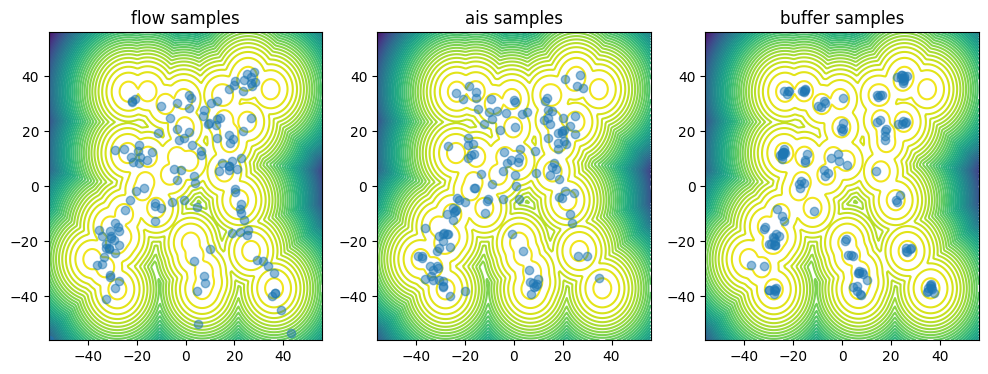

loss: 7.649025917053223, ess base: 0.3896983563899994,ess ais: 0.2100854218006134:  44%|████▍     | 1779/4000 [06:26<25:04,  1.48it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.421841621398926, ess base: 0.3705654442310333,ess ais: 0.18853947520256042:  44%|████▍     | 1780/4000 [06:26<20:00,  1.85it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.612875938415527, ess base: 0.2817308306694031,ess ais: 0.09649024158716202:  45%|████▍     | 1785/4000 [06:27<09:53,  3.73it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.933980464935303, ess base: 0.3618123531341553,ess ais: 0.17456769943237305:  45%|████▍     | 1787/4000 [06:27<09:03,  4.07it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.134902954101562, ess base: 0.30173927545547485,ess ais: 0.13831757009029388:  45%|████▍     | 1789/4000 [06:28<08:37,  4.27it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.533853530883789, ess base: 0.35644328594207764,ess ais: 0.18340818583965302:  45%|████▍     | 1791/4000 [06:28<08:25,  4.37it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.80777645111084, ess base: 0.3240683078765869,ess ais: 0.15923848748207092:  45%|████▍     | 1794/4000 [06:29<08:08,  4.52it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.210355758666992, ess base: 0.3314572274684906,ess ais: 0.13404205441474915:  45%|████▍     | 1796/4000 [06:29<08:04,  4.55it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.566882133483887, ess base: 0.3627088665962219,ess ais: 0.18839898705482483:  45%|████▍     | 1798/4000 [06:30<08:05,  4.53it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.33299446105957, ess base: 0.3530173897743225,ess ais: 0.17474593222141266:  45%|████▍     | 1799/4000 [06:30<08:02,  4.56it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.744648933410645, ess base: 0.35232335329055786,ess ais: 0.12238495796918869:  45%|████▌     | 1800/4000 [06:30<08:02,  4.56it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.823332786560059, ess base: 0.3011223375797272,ess ais: 0.13076099753379822:  45%|████▌     | 1801/4000 [06:31<08:01,  4.56it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.456863403320312, ess base: 0.31698235869407654,ess ais: 0.15177416801452637:  45%|████▌     | 1802/4000 [06:31<08:01,  4.57it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.781274795532227, ess base: 0.3002359867095947,ess ais: 0.14540645480155945:  45%|████▌     | 1803/4000 [06:31<08:03,  4.54it/s] 

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.723590850830078, ess base: 0.3522665798664093,ess ais: 0.13751502335071564:  45%|████▌     | 1804/4000 [06:31<08:02,  4.55it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.295034408569336, ess base: 0.3014449179172516,ess ais: 0.11697482317686081:  45%|████▌     | 1806/4000 [06:32<08:03,  4.54it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.021156311035156, ess base: 0.3337004780769348,ess ais: 0.15367025136947632:  45%|████▌     | 1807/4000 [06:32<08:04,  4.53it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.82470703125, ess base: 0.24581928551197052,ess ais: 0.09018148481845856:  45%|████▌     | 1808/4000 [06:32<08:07,  4.50it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.816484451293945, ess base: 0.3698188066482544,ess ais: 0.23796705901622772:  45%|████▌     | 1809/4000 [06:32<08:06,  4.50it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.797386169433594, ess base: 0.305188924074173,ess ais: 0.13684134185314178:  45%|████▌     | 1810/4000 [06:33<08:04,  4.52it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.425000190734863, ess base: 0.3736615478992462,ess ais: 0.20082145929336548:  45%|████▌     | 1811/4000 [06:33<08:02,  4.54it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.213747024536133, ess base: 0.19117434322834015,ess ais: 0.022134143859148026:  45%|████▌     | 1812/4000 [06:33<08:02,  4.53it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.886877059936523, ess base: 0.30989792943000793,ess ais: 0.1672569066286087:  45%|████▌     | 1813/4000 [06:33<08:01,  4.55it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.088587760925293, ess base: 0.2560730278491974,ess ais: 0.034230586141347885:  45%|████▌     | 1815/4000 [06:34<07:59,  4.56it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.744667053222656, ess base: 0.4166698455810547,ess ais: 0.22732798755168915:  45%|████▌     | 1817/4000 [06:34<08:01,  4.54it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.790548324584961, ess base: 0.30251145362854004,ess ais: 0.12516342103481293:  45%|████▌     | 1818/4000 [06:34<08:06,  4.48it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.068214416503906, ess base: 0.3891831338405609,ess ais: 0.008000711910426617:  45%|████▌     | 1819/4000 [06:35<08:01,  4.53it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.30340576171875, ess base: 0.2896905243396759,ess ais: 0.07273885607719421:  46%|████▌     | 1820/4000 [06:35<08:03,  4.51it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9693522453308105, ess base: 0.3056923449039459,ess ais: 0.11834484338760376:  46%|████▌     | 1822/4000 [06:35<08:05,  4.49it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.99508810043335, ess base: 0.3492589592933655,ess ais: 0.1400383710861206:  46%|████▌     | 1823/4000 [06:35<08:05,  4.48it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.167316436767578, ess base: 0.3459765911102295,ess ais: 0.15240725874900818:  46%|████▌     | 1825/4000 [06:36<08:02,  4.51it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.62681770324707, ess base: 0.33488529920578003,ess ais: 0.22684213519096375:  46%|████▌     | 1827/4000 [06:36<08:01,  4.52it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.91236686706543, ess base: 0.3219589293003082,ess ais: 0.18994924426078796:  46%|████▌     | 1830/4000 [06:37<07:55,  4.56it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.853912353515625, ess base: 0.3521873950958252,ess ais: 0.14316947758197784:  46%|████▌     | 1831/4000 [06:37<07:56,  4.55it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.106822967529297, ess base: 0.3228003680706024,ess ais: 0.1369970291852951:  46%|████▌     | 1832/4000 [06:37<07:56,  4.55it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.946465492248535, ess base: 0.3575853705406189,ess ais: 0.20518967509269714:  46%|████▌     | 1833/4000 [06:38<07:58,  4.52it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.468656539916992, ess base: 0.37761807441711426,ess ais: 0.2213856279850006:  46%|████▌     | 1834/4000 [06:38<08:02,  4.49it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.238982200622559, ess base: 0.2664013206958771,ess ais: 0.10926028341054916:  46%|████▌     | 1836/4000 [06:38<08:09,  4.42it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.086058616638184, ess base: 0.34456947445869446,ess ais: 0.18128103017807007:  46%|████▌     | 1837/4000 [06:39<08:07,  4.43it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.132312774658203, ess base: 0.34425264596939087,ess ais: 0.18837258219718933:  46%|████▌     | 1838/4000 [06:39<08:08,  4.43it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.876896858215332, ess base: 0.3688124716281891,ess ais: 0.18054594099521637:  46%|████▌     | 1839/4000 [06:39<08:07,  4.43it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.752044677734375, ess base: 0.29047924280166626,ess ais: 0.1550382524728775:  46%|████▌     | 1840/4000 [06:39<08:08,  4.42it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.539680480957031, ess base: 0.3120623230934143,ess ais: 0.10537189245223999:  46%|████▌     | 1842/4000 [06:40<08:09,  4.40it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.157780647277832, ess base: 0.29038184881210327,ess ais: 0.14323733747005463:  46%|████▌     | 1843/4000 [06:40<08:05,  4.44it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.784466743469238, ess base: 0.33344757556915283,ess ais: 0.17160581052303314:  46%|████▌     | 1845/4000 [06:40<08:03,  4.45it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.505102157592773, ess base: 0.2928259074687958,ess ais: 0.12684305012226105:  46%|████▌     | 1846/4000 [06:41<08:01,  4.48it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.386816024780273, ess base: 0.3031754791736603,ess ais: 0.05553705245256424:  46%|████▌     | 1847/4000 [06:41<07:57,  4.51it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.616069793701172, ess base: 0.3054632246494293,ess ais: 0.14679718017578125:  46%|████▌     | 1848/4000 [06:41<07:59,  4.49it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.787221908569336, ess base: 0.3533463776111603,ess ais: 0.1873036026954651:  46%|████▌     | 1849/4000 [06:41<08:01,  4.47it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9165940284729, ess base: 0.35291823744773865,ess ais: 0.12688060104846954:  46%|████▋     | 1850/4000 [06:41<08:01,  4.47it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.764009952545166, ess base: 0.40011611580848694,ess ais: 0.22603315114974976:  46%|████▋     | 1855/4000 [06:43<07:41,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.593957901000977, ess base: 0.36418282985687256,ess ais: 0.007874015718698502:  46%|████▋     | 1856/4000 [06:43<07:38,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.15861988067627, ess base: 0.3551015257835388,ess ais: 0.18348903954029083:  46%|████▋     | 1858/4000 [06:43<07:30,  4.75it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.308965682983398, ess base: 0.3486022353172302,ess ais: 0.1959192454814911:  46%|████▋     | 1859/4000 [06:43<07:24,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.371435165405273, ess base: 0.37151288986206055,ess ais: 0.00800000037997961:  47%|████▋     | 1862/4000 [06:44<07:32,  4.72it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.019786834716797, ess base: 0.3152482211589813,ess ais: 0.06569954752922058:  47%|████▋     | 1864/4000 [06:44<07:30,  4.74it/s] 

nan grad norm in replay step


loss: 8.175901412963867, ess base: 0.36263781785964966,ess ais: 0.14082813262939453:  47%|████▋     | 1866/4000 [06:45<07:30,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.17110824584961, ess base: 0.24962642788887024,ess ais: 0.07414606958627701:  47%|████▋     | 1868/4000 [06:45<07:28,  4.75it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.86436653137207, ess base: 0.2820787727832794,ess ais: 0.1343805193901062:  47%|████▋     | 1869/4000 [06:45<07:27,  4.76it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.994782447814941, ess base: 0.32094570994377136,ess ais: 0.13931353390216827:  47%|████▋     | 1870/4000 [06:46<07:28,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.198150634765625, ess base: 0.32512804865837097,ess ais: 0.16587071120738983:  47%|████▋     | 1871/4000 [06:46<07:28,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.627458572387695, ess base: 0.27933061122894287,ess ais: 0.11417403072118759:  47%|████▋     | 1872/4000 [06:46<07:28,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.915061950683594, ess base: 0.31548526883125305,ess ais: 0.007874015718698502:  47%|████▋     | 1873/4000 [06:46<07:26,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.004918098449707, ess base: 0.28417330980300903,ess ais: 0.1290527731180191:  47%|████▋     | 1874/4000 [06:47<07:09,  4.95it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.341712951660156, ess base: 0.3748301863670349,ess ais: 0.20648999512195587:  47%|████▋     | 1875/4000 [06:47<07:12,  4.91it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.012675285339355, ess base: 0.33391985297203064,ess ais: 0.20189893245697021:  47%|████▋     | 1877/4000 [06:47<07:47,  4.54it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 13.419538497924805, ess base: 0.3266119956970215,ess ais: 0.13446907699108124:  47%|████▋     | 1878/4000 [06:47<07:49,  4.52it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 37.863712310791016, ess base: 0.34621089696884155,ess ais: 0.15137432515621185:  47%|████▋     | 1880/4000 [06:48<07:49,  4.52it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.851805210113525, ess base: 0.3408055603504181,ess ais: 0.21998874843120575:  47%|████▋     | 1882/4000 [06:48<07:44,  4.56it/s]  

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.320801734924316, ess base: 0.3453470766544342,ess ais: 0.20540259778499603:  47%|████▋     | 1883/4000 [06:49<07:42,  4.57it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.524436950683594, ess base: 0.31167230010032654,ess ais: 0.15705573558807373:  47%|████▋     | 1884/4000 [06:49<07:43,  4.57it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.864891052246094, ess base: 0.3663639724254608,ess ais: 0.00800000037997961:  47%|████▋     | 1887/4000 [06:49<07:52,  4.47it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.348877429962158, ess base: 0.42435428500175476,ess ais: 0.25164440274238586:  47%|████▋     | 1889/4000 [06:50<07:44,  4.54it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.194547653198242, ess base: 0.37482938170433044,ess ais: 0.21166923642158508:  47%|████▋     | 1891/4000 [06:50<07:42,  4.56it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.02968692779541, ess base: 0.3343217372894287,ess ais: 0.007874015718698502:  47%|████▋     | 1892/4000 [06:50<07:42,  4.56it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.038678169250488, ess base: 0.274791419506073,ess ais: 0.09567346423864365:  47%|████▋     | 1893/4000 [06:51<07:42,  4.56it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.952601432800293, ess base: 0.31730136275291443,ess ais: 0.15031491219997406:  47%|████▋     | 1896/4000 [06:51<07:45,  4.52it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.596187591552734, ess base: 0.312549352645874,ess ais: 0.1554042398929596:  47%|████▋     | 1898/4000 [06:52<07:42,  4.54it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.828649520874023, ess base: 0.35164713859558105,ess ais: 0.09631109237670898:  47%|████▋     | 1899/4000 [06:52<07:43,  4.53it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.928366661071777, ess base: 0.2325122058391571,ess ais: 0.17362622916698456:  48%|████▊     | 1900/4000 [06:52<07:45,  4.51it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.655736923217773, ess base: 0.3446177840232849,ess ais: 0.10484322160482407:  48%|████▊     | 1901/4000 [06:52<07:46,  4.50it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.846386909484863, ess base: 0.3416256904602051,ess ais: 0.19837085902690887:  48%|████▊     | 1903/4000 [06:53<07:48,  4.48it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.897712230682373, ess base: 0.34042292833328247,ess ais: 0.16621771454811096:  48%|████▊     | 1904/4000 [06:53<07:46,  4.49it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.917364597320557, ess base: 0.4048950970172882,ess ais: 0.20896238088607788:  48%|████▊     | 1905/4000 [06:53<07:43,  4.52it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.037874221801758, ess base: 0.31937146186828613,ess ais: 0.10351038724184036:  48%|████▊     | 1906/4000 [06:54<07:38,  4.57it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.769417762756348, ess base: 0.34237954020500183,ess ais: 0.12241516262292862:  48%|████▊     | 1908/4000 [06:54<07:37,  4.57it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.77810287475586, ess base: 0.3369845747947693,ess ais: 0.2155541032552719:  48%|████▊     | 1909/4000 [06:54<07:30,  4.64it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 16.012447357177734, ess base: 0.3270356357097626,ess ais: 0.15386518836021423:  48%|████▊     | 1912/4000 [06:55<07:22,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.027474403381348, ess base: 0.3234833776950836,ess ais: 0.12845303118228912:  48%|████▊     | 1914/4000 [06:55<07:20,  4.74it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.90305233001709, ess base: 0.32059478759765625,ess ais: 0.1520785391330719:  48%|████▊     | 1915/4000 [06:55<07:21,  4.72it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.060795783996582, ess base: 0.3651873767375946,ess ais: 0.13602326810359955:  48%|████▊     | 1917/4000 [06:56<07:08,  4.86it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.06377124786377, ess base: 0.35536670684814453,ess ais: 0.1681804656982422:  48%|████▊     | 1920/4000 [06:57<07:21,  4.71it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.539765357971191, ess base: 0.32175031304359436,ess ais: 0.18036489188671112:  48%|████▊     | 1921/4000 [06:57<07:22,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.054267883300781, ess base: 0.2788824439048767,ess ais: 0.11590848118066788:  48%|████▊     | 1925/4000 [06:58<07:19,  4.72it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.2902761697769165,ess ais: 0.00800000037997961:  48%|████▊     | 1926/4000 [06:58<07:08,  4.84it/s]               

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.010147094726562, ess base: 0.3297516107559204,ess ais: 0.1791774183511734:  48%|████▊     | 1930/4000 [06:59<07:15,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.498462677001953, ess base: 0.35281550884246826,ess ais: 0.13652150332927704:  48%|████▊     | 1932/4000 [06:59<07:11,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.716004371643066, ess base: 0.33390361070632935,ess ais: 0.18886619806289673:  48%|████▊     | 1933/4000 [06:59<07:20,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.471105575561523, ess base: 0.3501991927623749,ess ais: 0.15664635598659515:  48%|████▊     | 1936/4000 [07:00<07:24,  4.64it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.905195236206055, ess base: 0.32561632990837097,ess ais: 0.007936508394777775:  48%|████▊     | 1937/4000 [07:00<07:11,  4.78it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.395172119140625, ess base: 0.3365940749645233,ess ais: 0.21293264627456665:  48%|████▊     | 1940/4000 [07:01<07:24,  4.64it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.22201919555664, ess base: 0.32009297609329224,ess ais: 0.14202632009983063:  49%|████▊     | 1943/4000 [07:01<07:28,  4.59it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.868755340576172, ess base: 0.3322399854660034,ess ais: 0.1526222676038742:  49%|████▊     | 1945/4000 [07:02<07:30,  4.56it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.610960960388184, ess base: 0.33810266852378845,ess ais: 0.11607979238033295:  49%|████▊     | 1946/4000 [07:02<07:31,  4.55it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.952960014343262, ess base: 0.3446810245513916,ess ais: 0.1423904001712799:  49%|████▊     | 1947/4000 [07:02<07:31,  4.55it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 28.068920135498047, ess base: 0.33933040499687195,ess ais: 0.08453133702278137:  49%|████▊     | 1949/4000 [07:03<07:29,  4.57it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.233251571655273, ess base: 0.2790142893791199,ess ais: 0.007936508394777775:  49%|████▉     | 1950/4000 [07:03<07:14,  4.72it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.78537654876709, ess base: 0.3336046636104584,ess ais: 0.18689018487930298:  49%|████▉     | 1951/4000 [07:03<07:03,  4.84it/s]  

nan loss in replay step


loss: 8.395204544067383, ess base: 0.3175469636917114,ess ais: 0.10857494920492172:  49%|████▉     | 1953/4000 [07:04<07:13,  4.73it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.288810729980469, ess base: 0.3563031554222107,ess ais: 0.2080337107181549:  49%|████▉     | 1954/4000 [07:04<07:18,  4.66it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.092350006103516, ess base: 0.2656897008419037,ess ais: 0.13451500236988068:  49%|████▉     | 1955/4000 [07:04<07:18,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.458930015563965, ess base: 0.3277508318424225,ess ais: 0.19884881377220154:  49%|████▉     | 1956/4000 [07:04<08:28,  4.02it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.900659561157227, ess base: 0.335941880941391,ess ais: 0.12026994675397873:  49%|████▉     | 1958/4000 [07:05<08:06,  4.20it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.170093536376953, ess base: 0.35395076870918274,ess ais: 0.007936508394777775:  49%|████▉     | 1959/4000 [07:05<07:41,  4.43it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 10.409185409545898, ess base: 0.34289512038230896,ess ais: 0.11887148767709732:  49%|████▉     | 1960/4000 [07:05<07:19,  4.64it/s]

nan loss in replay step


loss: nan, ess base: 0.31134653091430664,ess ais: 0.11792270094156265:  49%|████▉     | 1961/4000 [07:05<07:06,  4.78it/s]               

nan loss in replay step


loss: 7.710160732269287, ess base: 0.37432822585105896,ess ais: 0.20813734829425812:  49%|████▉     | 1965/4000 [07:06<07:13,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.029962539672852, ess base: 0.3951285183429718,ess ais: 0.18904857337474823:  49%|████▉     | 1966/4000 [07:06<07:13,  4.69it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.734602928161621, ess base: 0.2523120045661926,ess ais: 0.11506485193967819:  49%|████▉     | 1968/4000 [07:07<07:15,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.981375694274902, ess base: 0.34568673372268677,ess ais: 0.18364906311035156:  49%|████▉     | 1969/4000 [07:07<07:19,  4.62it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.694136619567871, ess base: 0.41840559244155884,ess ais: 0.2514709234237671:  49%|████▉     | 1971/4000 [07:08<07:20,  4.60it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.543022155761719, ess base: 0.35701027512550354,ess ais: 0.16603130102157593:  49%|████▉     | 1973/4000 [07:08<07:23,  4.57it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.757122993469238, ess base: 0.3815067708492279,ess ais: 0.2026716023683548:  49%|████▉     | 1974/4000 [07:08<07:24,  4.56it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.361495018005371, ess base: 0.3376092314720154,ess ais: 0.007936508394777775:  49%|████▉     | 1975/4000 [07:08<07:24,  4.56it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.898590087890625, ess base: 0.30913054943084717,ess ais: 0.12048965692520142:  49%|████▉     | 1976/4000 [07:09<07:25,  4.54it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.816209316253662, ess base: 0.45753762125968933,ess ais: 0.2818079888820648:  49%|████▉     | 1978/4000 [07:09<07:23,  4.56it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.138256072998047, ess base: 0.3354993462562561,ess ais: 0.16726528108119965:  50%|████▉     | 1980/4000 [07:10<08:01,  4.20it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.37306547164917, ess base: 0.3964272737503052,ess ais: 0.2079111933708191:  50%|████▉     | 1982/4000 [07:10<07:57,  4.23it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.859433174133301, ess base: 0.355076402425766,ess ais: 0.17267492413520813:  50%|████▉     | 1983/4000 [07:10<07:41,  4.37it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.182653427124023, ess base: 0.39802125096321106,ess ais: 0.26196181774139404:  50%|████▉     | 1984/4000 [07:11<07:29,  4.49it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.412962913513184, ess base: 0.34997713565826416,ess ais: 0.16419744491577148:  50%|████▉     | 1985/4000 [07:11<07:19,  4.58it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.384598731994629, ess base: 0.34524786472320557,ess ais: 0.007936508394777775:  50%|████▉     | 1987/4000 [07:11<07:04,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.15945816040039, ess base: 0.3775392472743988,ess ais: 0.24125677347183228:  50%|████▉     | 1988/4000 [07:11<06:55,  4.84it/s]   

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.892421722412109, ess base: 0.3896700441837311,ess ais: 0.197899729013443:  50%|████▉     | 1994/4000 [07:13<07:03,  4.74it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.030380249023438, ess base: 0.376181423664093,ess ais: 0.19281290471553802:  50%|████▉     | 1995/4000 [07:13<07:06,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.607309341430664, ess base: 0.35596951842308044,ess ais: 0.1858144998550415:  50%|████▉     | 1997/4000 [07:13<07:13,  4.62it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.721400260925293, ess base: 0.35257238149642944,ess ais: 0.1408037543296814:  50%|████▉     | 1999/4000 [07:14<07:10,  4.65it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.597804069519043, ess base: 0.3044828176498413,ess ais: 0.1459398716688156:  50%|█████     | 2001/4000 [07:14<07:22,  4.52it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.6262712478637695, ess base: 0.2445075511932373,ess ais: 0.035391923040151596:  50%|█████     | 2005/4000 [07:15<07:17,  4.56it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.904275894165039, ess base: 0.35039371252059937,ess ais: 0.1880653351545334:  50%|█████     | 2006/4000 [07:15<07:06,  4.68it/s]  

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 16.663131713867188, ess base: 0.373501181602478,ess ais: 0.11759331077337265:  50%|█████     | 2007/4000 [07:15<06:48,  4.88it/s]

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.150852680206299, ess base: 0.32211363315582275,ess ais: 0.1572573333978653:  50%|█████     | 2009/4000 [07:16<06:47,  4.89it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.4020891189575195, ess base: 0.33517616987228394,ess ais: 0.14639508724212646:  50%|█████     | 2010/4000 [07:16<06:49,  4.86it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.715278148651123, ess base: 0.41861966252326965,ess ais: 0.19779646396636963:  50%|█████     | 2011/4000 [07:16<06:51,  4.83it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.368165969848633, ess base: 0.30037492513656616,ess ais: 0.11591342091560364:  50%|█████     | 2012/4000 [07:16<06:49,  4.85it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.756710052490234, ess base: 0.3806321918964386,ess ais: 0.2052561640739441:  50%|█████     | 2014/4000 [07:17<06:47,  4.87it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.826877593994141, ess base: 0.37753865122795105,ess ais: 0.17479978501796722:  50%|█████     | 2016/4000 [07:17<06:52,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.426055908203125, ess base: 0.3622627854347229,ess ais: 0.22478394210338593:  50%|█████     | 2017/4000 [07:17<06:51,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.926790237426758, ess base: 0.3491821587085724,ess ais: 0.008347668685019016:  50%|█████     | 2019/4000 [07:18<06:53,  4.79it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.485352039337158, ess base: 0.33095672726631165,ess ais: 0.16037896275520325:  50%|█████     | 2020/4000 [07:18<06:53,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.681765556335449, ess base: 0.38785091042518616,ess ais: 0.16294708847999573:  51%|█████     | 2024/4000 [07:19<06:49,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.370295524597168, ess base: 0.31756410002708435,ess ais: 0.1466040313243866:  51%|█████     | 2027/4000 [07:20<06:56,  4.74it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.646392345428467, ess base: 0.3676100969314575,ess ais: 0.19139842689037323:  51%|█████     | 2029/4000 [07:20<06:56,  4.73it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.304530143737793, ess base: 0.30839505791664124,ess ais: 0.12145669013261795:  51%|█████     | 2031/4000 [07:20<06:57,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.084574699401855, ess base: 0.32801440358161926,ess ais: 0.1299777328968048:  51%|█████     | 2034/4000 [07:21<06:57,  4.71it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.113848686218262, ess base: 0.2789590358734131,ess ais: 0.052040159702301025:  51%|█████     | 2035/4000 [07:21<06:56,  4.72it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.510400772094727, ess base: 0.39734846353530884,ess ais: 0.18130503594875336:  51%|█████     | 2037/4000 [07:22<06:54,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.606829643249512, ess base: 0.30280375480651855,ess ais: 0.00800000037997961:  51%|█████     | 2038/4000 [07:22<06:55,  4.72it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.954184055328369, ess base: 0.35439252853393555,ess ais: 0.2170870453119278:  51%|█████     | 2039/4000 [07:22<06:53,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.100054740905762, ess base: 0.37055066227912903,ess ais: 0.2266218215227127:  51%|█████     | 2040/4000 [07:22<06:51,  4.76it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.801933765411377, ess base: 0.39997240900993347,ess ais: 0.24652881920337677:  51%|█████     | 2042/4000 [07:23<06:47,  4.80it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.586260795593262, ess base: 0.3293401896953583,ess ais: 0.14633621275424957:  51%|█████     | 2044/4000 [07:23<06:50,  4.77it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.634014129638672, ess base: 0.336501806974411,ess ais: 0.15275368094444275:  51%|█████     | 2046/4000 [07:24<06:52,  4.74it/s] 

nan grad norm in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.528377532958984, ess base: 0.32717466354370117,ess ais: 0.08579667657613754:  51%|█████     | 2047/4000 [07:24<06:53,  4.72it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.860733985900879, ess base: 0.3306351602077484,ess ais: 0.1302320957183838:  51%|█████▏    | 2051/4000 [07:25<06:57,  4.67it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.597833633422852, ess base: 0.3742457926273346,ess ais: 0.2183784395456314:  51%|█████▏    | 2053/4000 [07:25<07:02,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.363412857055664, ess base: 0.39832770824432373,ess ais: 0.2554570138454437:  51%|█████▏    | 2054/4000 [07:25<07:01,  4.62it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.841317176818848, ess base: 0.3729981780052185,ess ais: 0.20616218447685242:  51%|█████▏    | 2058/4000 [07:26<07:09,  4.52it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.61956787109375, ess base: 0.37464824318885803,ess ais: 0.21468710899353027:  51%|█████▏    | 2059/4000 [07:26<07:11,  4.50it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.528087615966797, ess base: 0.3949301540851593,ess ais: 0.23576603829860687:  52%|█████▏    | 2060/4000 [07:27<07:10,  4.51it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.328937530517578, ess base: 0.3628166615962982,ess ais: 0.03897355869412422:  52%|█████▏    | 2065/4000 [07:28<07:04,  4.56it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.6666483879089355, ess base: 0.39194485545158386,ess ais: 0.24333004653453827:  52%|█████▏    | 2066/4000 [07:28<07:04,  4.56it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.909871578216553, ess base: 0.29107919335365295,ess ais: 0.10128677636384964:  52%|█████▏    | 2069/4000 [07:29<07:08,  4.50it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.581014633178711, ess base: 0.3180537521839142,ess ais: 0.09156309813261032:  52%|█████▏    | 2071/4000 [07:29<07:06,  4.52it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.229761123657227, ess base: 0.32486608624458313,ess ais: 0.16135717928409576:  52%|█████▏    | 2073/4000 [07:29<07:04,  4.54it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.053030967712402, ess base: 0.4005894958972931,ess ais: 0.007936508394777775:  52%|█████▏    | 2074/4000 [07:30<07:02,  4.56it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.00747299194336, ess base: 0.26284486055374146,ess ais: 0.059670016169548035:  52%|█████▏    | 2075/4000 [07:30<07:01,  4.57it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.739868640899658, ess base: 0.3993295431137085,ess ais: 0.25816425681114197:  52%|█████▏    | 2077/4000 [07:30<06:44,  4.76it/s] 

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.45327377319336, ess base: 0.40210431814193726,ess ais: 0.2455427050590515:  52%|█████▏    | 2079/4000 [07:31<06:50,  4.68it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9655303955078125, ess base: 0.29481321573257446,ess ais: 0.11008695513010025:  52%|█████▏    | 2080/4000 [07:31<06:39,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.259604454040527, ess base: 0.3456328213214874,ess ais: 0.11026697605848312:  52%|█████▏    | 2082/4000 [07:31<06:35,  4.85it/s]  

nan loss in replay step


loss: 8.415349960327148, ess base: 0.37490007281303406,ess ais: 0.14440280199050903:  52%|█████▏    | 2083/4000 [07:32<06:26,  4.96it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.542877197265625, ess base: 0.24685628712177277,ess ais: 0.007874015718698502:  52%|█████▏    | 2086/4000 [07:32<06:30,  4.90it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.711944580078125, ess base: 0.4379519820213318,ess ais: 0.28093862533569336:  52%|█████▏    | 2088/4000 [07:33<06:38,  4.80it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.3379053473472595,ess ais: 0.20318324863910675:  52%|█████▏    | 2089/4000 [07:33<06:28,  4.92it/s]              

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.208303451538086, ess base: 0.38612765073776245,ess ais: 0.1973133534193039:  52%|█████▏    | 2090/4000 [07:33<06:20,  5.02it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.4076123833656311,ess ais: 0.007874015718698502:  52%|█████▏    | 2092/4000 [07:33<06:14,  5.09it/s]             

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.687771797180176, ess base: 0.420785516500473,ess ais: 0.23192785680294037:  52%|█████▏    | 2093/4000 [07:34<06:25,  4.94it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.161425590515137, ess base: 0.3270007073879242,ess ais: 0.007874015718698502:  52%|█████▏    | 2095/4000 [07:34<06:42,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.23779010772705, ess base: 0.17274120450019836,ess ais: 0.023222440853714943:  52%|█████▏    | 2097/4000 [07:34<06:41,  4.74it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 9.423242568969727, ess base: 0.4012265205383301,ess ais: 0.007874015718698502:  52%|█████▎    | 2100/4000 [07:35<06:37,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.884344100952148, ess base: 0.3779156804084778,ess ais: 0.007907355204224586:  53%|█████▎    | 2101/4000 [07:35<06:40,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.4093337059021, ess base: 0.42475757002830505,ess ais: 0.1755916178226471:  53%|█████▎    | 2102/4000 [07:36<06:39,  4.75it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.179882049560547, ess base: 0.32346129417419434,ess ais: 0.20213961601257324:  53%|█████▎    | 2103/4000 [07:36<06:26,  4.91it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.892473220825195, ess base: 0.3754398226737976,ess ais: 0.22112630307674408:  53%|█████▎    | 2107/4000 [07:37<06:36,  4.77it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.538853645324707, ess base: 0.374654620885849,ess ais: 0.21590764820575714:  53%|█████▎    | 2109/4000 [07:37<06:37,  4.75it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.810240745544434, ess base: 0.3542459309101105,ess ais: 0.12112611532211304:  53%|█████▎    | 2110/4000 [07:37<06:41,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.171656608581543, ess base: 0.3707790970802307,ess ais: 0.2113487273454666:  53%|█████▎    | 2112/4000 [07:38<06:41,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.545967102050781, ess base: 0.3593394160270691,ess ais: 0.1633005440235138:  53%|█████▎    | 2113/4000 [07:38<06:42,  4.69it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.264703750610352, ess base: 0.3615952432155609,ess ais: 0.14843954145908356:  53%|█████▎    | 2115/4000 [07:38<06:47,  4.63it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.613250732421875, ess base: 0.3641910254955292,ess ais: 0.16380542516708374:  53%|█████▎    | 2119/4000 [07:39<06:50,  4.58it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.75096321105957, ess base: 0.3624565005302429,ess ais: 0.1813366562128067:  53%|█████▎    | 2123/4000 [07:40<07:19,  4.27it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.904314041137695, ess base: 0.3873952627182007,ess ais: 0.18235981464385986:  53%|█████▎    | 2124/4000 [07:40<07:08,  4.38it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.097806930541992, ess base: 0.39896687865257263,ess ais: 0.24051429331302643:  53%|█████▎    | 2125/4000 [07:41<07:00,  4.46it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 200.3908233642578, ess base: 0.3705838918685913,ess ais: 0.21483254432678223:  53%|█████▎    | 2127/4000 [07:41<06:53,  4.53it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.177026748657227, ess base: 0.3577110767364502,ess ais: 0.19352129101753235:  53%|█████▎    | 2128/4000 [07:41<06:52,  4.54it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.062667846679688, ess base: 0.30862370133399963,ess ais: 0.18004046380519867:  53%|█████▎    | 2130/4000 [07:42<06:46,  4.60it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.489400863647461, ess base: 0.37803536653518677,ess ais: 0.007874015718698502:  53%|█████▎    | 2133/4000 [07:42<06:39,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.78727912902832, ess base: 0.3435691297054291,ess ais: 0.15010328590869904:  53%|█████▎    | 2134/4000 [07:43<06:38,  4.68it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.26594352722168, ess base: 0.38222554326057434,ess ais: 0.20254206657409668:  53%|█████▎    | 2135/4000 [07:43<06:37,  4.70it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.350058555603027, ess base: 0.3258955180644989,ess ais: 0.14667761325836182:  53%|█████▎    | 2136/4000 [07:43<06:37,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.795266151428223, ess base: 0.3435084819793701,ess ais: 0.16788583993911743:  53%|█████▎    | 2138/4000 [07:43<06:38,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.595479965209961, ess base: 0.3944273591041565,ess ais: 0.24851739406585693:  53%|█████▎    | 2139/4000 [07:44<06:39,  4.66it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.33586311340332, ess base: 0.43174004554748535,ess ais: 0.29261648654937744:  54%|█████▎    | 2144/4000 [07:45<06:44,  4.59it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.390450477600098, ess base: 0.3392615020275116,ess ais: 0.18889154493808746:  54%|█████▎    | 2147/4000 [07:45<06:39,  4.64it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.751324653625488, ess base: 0.2741030156612396,ess ais: 0.0078125:  54%|█████▎    | 2148/4000 [07:46<06:25,  4.80it/s]          

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.607780933380127, ess base: 0.3654699921607971,ess ais: 0.24871934950351715:  54%|█████▍    | 2151/4000 [07:46<06:32,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 8.032231330871582, ess base: 0.34999772906303406,ess ais: 0.1705673187971115:  54%|█████▍    | 2154/4000 [07:47<06:32,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.712356567382812, ess base: 0.3668946325778961,ess ais: 0.21043017506599426:  54%|█████▍    | 2155/4000 [07:47<06:32,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.457260131835938, ess base: 0.4300631582736969,ess ais: 0.007874015718698502:  54%|█████▍    | 2157/4000 [07:47<06:36,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.21497917175293, ess base: 0.3190966546535492,ess ais: 0.18026234209537506:  54%|█████▍    | 2159/4000 [07:48<06:35,  4.66it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.698182106018066, ess base: 0.4070137143135071,ess ais: 0.2539435029029846:  54%|█████▍    | 2160/4000 [07:48<06:37,  4.63it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.62514591217041, ess base: 0.3948952555656433,ess ais: 0.08973230421543121:  54%|█████▍    | 2165/4000 [07:49<06:39,  4.60it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.8814802169799805, ess base: 0.33433985710144043,ess ais: 0.15159353613853455:  54%|█████▍    | 2167/4000 [07:50<06:46,  4.51it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.963868141174316, ess base: 0.3792354166507721,ess ais: 0.2104748636484146:  54%|█████▍    | 2172/4000 [07:51<06:37,  4.59it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.391921997070312, ess base: 0.33470088243484497,ess ais: 0.13652782142162323:  54%|█████▍    | 2176/4000 [07:52<06:31,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.7859883308410645, ess base: 0.40014034509658813,ess ais: 0.19225609302520752:  54%|█████▍    | 2178/4000 [07:52<06:27,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.319226264953613, ess base: 0.33739936351776123,ess ais: 0.11246486008167267:  55%|█████▍    | 2184/4000 [07:53<06:28,  4.67it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.796299457550049, ess base: 0.376132994890213,ess ais: 0.18468241393566132:  55%|█████▍    | 2188/4000 [07:54<06:28,  4.66it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.841899871826172, ess base: 0.41535380482673645,ess ais: 0.25357571244239807:  55%|█████▍    | 2192/4000 [07:55<06:29,  4.64it/s]

4 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.517228126525879, ess base: 0.39841124415397644,ess ais: 0.20730961859226227:  55%|█████▍    | 2195/4000 [07:56<06:23,  4.71it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.1481294631958, ess base: 0.3368987441062927,ess ais: 0.007874015718698502:  55%|█████▍    | 2196/4000 [07:56<06:24,  4.70it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.669547080993652, ess base: 0.2919522225856781,ess ais: 0.174845352768898:  55%|█████▌    | 2200/4000 [07:57<06:19,  4.75it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.143424034118652, ess base: 0.3344583213329315,ess ais: 0.10288185626268387:  55%|█████▌    | 2202/4000 [07:57<06:18,  4.75it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.83626937866211, ess base: 0.3526320457458496,ess ais: 0.14961953461170197:  55%|█████▌    | 2207/4000 [07:58<06:20,  4.72it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.708480834960938, ess base: 0.37185588479042053,ess ais: 0.16601531207561493:  55%|█████▌    | 2208/4000 [07:58<06:19,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.080950736999512, ess base: 0.34853485226631165,ess ais: 0.08728083968162537:  55%|█████▌    | 2211/4000 [07:59<06:16,  4.75it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.5493035316467285, ess base: 0.42748379707336426,ess ais: 0.27144330739974976:  55%|█████▌    | 2212/4000 [07:59<06:20,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.950594425201416, ess base: 0.3200860917568207,ess ais: 0.08568395674228668:  55%|█████▌    | 2217/4000 [08:00<06:20,  4.69it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.004495620727539, ess base: 0.41479939222335815,ess ais: 0.2703540027141571:  56%|█████▌    | 2220/4000 [08:01<06:18,  4.70it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.340672492980957, ess base: 0.3764328360557556,ess ais: 0.19488190114498138:  56%|█████▌    | 2221/4000 [08:01<06:16,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.08205509185791, ess base: 0.3593282401561737,ess ais: 0.14526905119419098:  56%|█████▌    | 2221/4000 [08:01<06:16,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
3 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


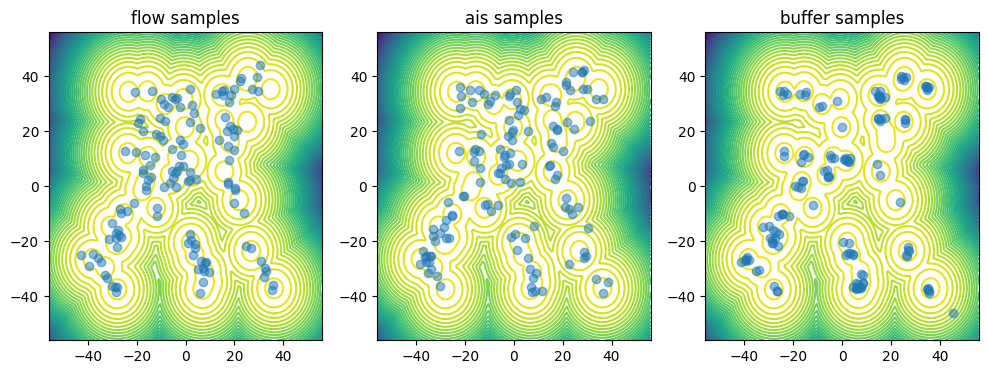

loss: 9.39279556274414, ess base: 0.30082234740257263,ess ais: 0.10035564750432968:  56%|█████▌    | 2227/4000 [08:05<09:29,  3.11it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.536760330200195, ess base: 0.3735305964946747,ess ais: 0.23023778200149536:  56%|█████▌    | 2231/4000 [08:05<07:00,  4.21it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.667266845703125, ess base: 0.3638386130332947,ess ais: 0.21184386312961578:  56%|█████▌    | 2232/4000 [08:06<06:46,  4.35it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.594847679138184, ess base: 0.3199235498905182,ess ais: 0.10379300266504288:  56%|█████▌    | 2239/4000 [08:07<06:11,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.218109130859375, ess base: 0.37193185091018677,ess ais: 0.2203003466129303:  56%|█████▌    | 2240/4000 [08:07<06:09,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.916574478149414, ess base: 0.4108284115791321,ess ais: 0.2673853635787964:  56%|█████▌    | 2241/4000 [08:08<06:07,  4.79it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.574141502380371, ess base: 0.37704944610595703,ess ais: 0.16156791150569916:  56%|█████▌    | 2243/4000 [08:08<05:54,  4.95it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.909221172332764, ess base: 0.3311733603477478,ess ais: 0.12719769775867462:  56%|█████▌    | 2245/4000 [08:08<06:01,  4.86it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.13448715209961, ess base: 0.3810370862483978,ess ais: 0.19713175296783447:  56%|█████▋    | 2252/4000 [08:10<06:10,  4.72it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.023813247680664, ess base: 0.3850235342979431,ess ais: 0.23533236980438232:  56%|█████▋    | 2253/4000 [08:10<06:12,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.036500930786133, ess base: 0.37840890884399414,ess ais: 0.19788050651550293:  56%|█████▋    | 2255/4000 [08:10<06:10,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.109445571899414, ess base: 0.37519609928131104,ess ais: 0.254688024520874:  56%|█████▋    | 2256/4000 [08:11<06:09,  4.72it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.795366287231445, ess base: 0.3489271104335785,ess ais: 0.0078125:  56%|█████▋    | 2258/4000 [08:11<05:55,  4.90it/s]            

nan loss in replay step


loss: inf, ess base: 0.411464124917984,ess ais: 0.22381623089313507:  56%|█████▋    | 2259/4000 [08:11<05:43,  5.06it/s]     

nan loss in replay step


loss: 9.38878059387207, ess base: 0.42911291122436523,ess ais: 0.2378688007593155:  57%|█████▋    | 2261/4000 [08:12<05:57,  4.87it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.7728271484375, ess base: 0.3557031750679016,ess ais: 0.1627621352672577:  57%|█████▋    | 2263/4000 [08:12<06:02,  4.79it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.962770462036133, ess base: 0.23915264010429382,ess ais: 0.007878696545958519:  57%|█████▋    | 2264/4000 [08:12<06:03,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.519180297851562, ess base: 0.3904646337032318,ess ais: 0.0078125:  57%|█████▋    | 2266/4000 [08:13<06:01,  4.79it/s]            

nan grad norm in replay step
nan loss in replay step


loss: 7.984539031982422, ess base: 0.34763017296791077,ess ais: 0.14788585901260376:  57%|█████▋    | 2268/4000 [08:13<05:55,  4.88it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.680210590362549, ess base: 0.43394359946250916,ess ais: 0.2717389762401581:  57%|█████▋    | 2270/4000 [08:14<05:49,  4.96it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 3.3454718328793005e+32, ess base: 0.42295804619789124,ess ais: 0.17169307172298431:  57%|█████▋    | 2271/4000 [08:14<06:01,  4.79it/s]

nan grad norm in replay step


loss: 8.77574348449707, ess base: 0.37197616696357727,ess ais: 0.2550275921821594:  57%|█████▋    | 2273/4000 [08:14<06:04,  4.73it/s]       

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.070380210876465, ess base: 0.2672807574272156,ess ais: 0.0700780376791954:  57%|█████▋    | 2275/4000 [08:15<05:59,  4.79it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.897478103637695, ess base: 0.39894503355026245,ess ais: 0.1898692548274994:  57%|█████▋    | 2276/4000 [08:15<05:56,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.138758659362793, ess base: 0.33192333579063416,ess ais: 0.11337195336818695:  57%|█████▋    | 2283/4000 [08:16<05:53,  4.86it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.603278160095215, ess base: 0.34782734513282776,ess ais: 0.20571205019950867:  57%|█████▋    | 2286/4000 [08:17<05:55,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.792226791381836, ess base: 0.35461899638175964,ess ais: 0.20693565905094147:  57%|█████▋    | 2287/4000 [08:17<05:54,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.148296356201172, ess base: 0.40638190507888794,ess ais: 0.007874015718698502:  57%|█████▋    | 2288/4000 [08:17<05:53,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.795261383056641, ess base: 0.3786623775959015,ess ais: 0.16759145259857178:  57%|█████▋    | 2289/4000 [08:18<05:51,  4.87it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.3321606516838074,ess ais: 0.08480627834796906:  57%|█████▋    | 2291/4000 [08:18<05:35,  5.09it/s]               

nan loss in replay step


loss: 7.966777801513672, ess base: 0.3367198407649994,ess ais: 0.11955581605434418:  57%|█████▋    | 2297/4000 [08:19<05:49,  4.87it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.375728607177734, ess base: 0.44205623865127563,ess ais: 0.2637239396572113:  58%|█████▊    | 2307/4000 [08:21<05:50,  4.84it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.30115973949432373,ess ais: 0.12399902194738388:  58%|█████▊    | 2310/4000 [08:22<05:40,  4.96it/s]               

nan loss in replay step


loss: 8.047407150268555, ess base: 0.41589805483818054,ess ais: 0.29139530658721924:  58%|█████▊    | 2313/4000 [08:22<05:40,  4.96it/s]

nan loss in replay step


loss: inf, ess base: 0.41947436332702637,ess ais: 0.27443021535873413:  58%|█████▊    | 2315/4000 [08:23<05:41,  4.93it/s]              

nan loss in replay step


loss: 8.729409217834473, ess base: 0.45217445492744446,ess ais: 0.26538076996803284:  58%|█████▊    | 2317/4000 [08:23<05:47,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.106526374816895, ess base: 0.32413527369499207,ess ais: 0.13050532341003418:  58%|█████▊    | 2318/4000 [08:23<05:37,  4.99it/s]

nan loss in replay step


loss: 7.50144624710083, ess base: 0.44445717334747314,ess ais: 0.276690274477005:  58%|█████▊    | 2321/4000 [08:24<05:39,  4.95it/s]   

nan loss in replay step


loss: 7.914408206939697, ess base: 0.4319518506526947,ess ais: 0.24252557754516602:  58%|█████▊    | 2324/4000 [08:25<05:51,  4.77it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.393913269042969, ess base: 0.3876732289791107,ess ais: 0.22189494967460632:  58%|█████▊    | 2327/4000 [08:25<05:57,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.215665817260742, ess base: 0.34678658843040466,ess ais: 0.1566208451986313:  58%|█████▊    | 2329/4000 [08:26<06:00,  4.64it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.867334365844727, ess base: 0.4486910402774811,ess ais: 0.2977026402950287:  58%|█████▊    | 2330/4000 [08:26<05:56,  4.69it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.216707229614258, ess base: 0.47750017046928406,ess ais: 0.2960444688796997:  58%|█████▊    | 2337/4000 [08:27<05:55,  4.68it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.002392768859863, ess base: 0.31436243653297424,ess ais: 0.007937568239867687:  58%|█████▊    | 2338/4000 [08:28<05:52,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 13.76468276977539, ess base: 0.4068871736526489,ess ais: 0.23268382251262665:  58%|█████▊    | 2339/4000 [08:28<05:51,  4.72it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.754999160766602, ess base: 0.45497530698776245,ess ais: 0.28624284267425537:  59%|█████▊    | 2345/4000 [08:29<05:49,  4.74it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.71046257019043, ess base: 0.3795483708381653,ess ais: 0.23196649551391602:  59%|█████▊    | 2347/4000 [08:30<05:55,  4.65it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.3362521827220917,ess ais: 0.17537821829319:  59%|█████▊    | 2348/4000 [08:30<05:41,  4.84it/s]                

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.45394515991211, ess base: 0.4262760281562805,ess ais: 0.18898040056228638:  59%|█████▉    | 2352/4000 [08:31<05:52,  4.67it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.619573593139648, ess base: 0.3580636978149414,ess ais: 0.18467120826244354:  59%|█████▉    | 2355/4000 [08:31<05:45,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.670101642608643, ess base: 0.42660394310951233,ess ais: 0.24799612164497375:  59%|█████▉    | 2362/4000 [08:33<05:39,  4.82it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.504373550415039, ess base: 0.3928113877773285,ess ais: 0.18243932723999023:  59%|█████▉    | 2373/4000 [08:35<05:39,  4.79it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.530325889587402, ess base: 0.4068047106266022,ess ais: 0.21652084589004517:  60%|█████▉    | 2384/4000 [08:37<05:33,  4.85it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.638605117797852, ess base: 0.3677169680595398,ess ais: 0.20636793971061707:  60%|█████▉    | 2389/4000 [08:38<05:37,  4.78it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.38184258341789246,ess ais: 0.19693885743618011:  60%|█████▉    | 2393/4000 [08:39<05:21,  5.00it/s]             

nan loss in replay step


loss: inf, ess base: 0.3559918701648712,ess ais: 0.22163255512714386:  60%|█████▉    | 2395/4000 [08:40<05:21,  5.00it/s]     

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.104554176330566, ess base: 0.31836533546447754,ess ais: 0.04991531744599342:  60%|█████▉    | 2398/4000 [08:40<05:26,  4.90it/s]

nan grad norm in replay step


loss: inf, ess base: 0.38446542620658875,ess ais: 0.15456421673297882:  60%|██████    | 2400/4000 [08:41<05:24,  4.93it/s]              

nan loss in replay step


loss: inf, ess base: 0.3835057318210602,ess ais: 0.2182425856590271:  60%|██████    | 2402/4000 [08:41<05:16,  5.04it/s]                

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.921207904815674, ess base: 0.4136841297149658,ess ais: 0.23593761026859283:  60%|██████    | 2405/4000 [08:42<05:26,  4.88it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 980.3414916992188, ess base: 0.3872430920600891,ess ais: 0.20813171565532684:  60%|██████    | 2406/4000 [08:42<05:26,  4.88it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.47263240814209, ess base: 0.33564987778663635,ess ais: 0.00782760325819254:  60%|██████    | 2407/4000 [08:42<05:25,  4.90it/s]

nan grad norm in replay step


loss: 1.6269583245311046e+25, ess base: 0.39163607358932495,ess ais: 0.2083858698606491:  60%|██████    | 2410/4000 [08:43<05:28,  4.85it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.8141350746154785, ess base: 0.47082167863845825,ess ais: 0.3331182599067688:  61%|██████    | 2423/4000 [08:45<05:29,  4.79it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.23709487915039, ess base: 0.41924014687538147,ess ais: 0.23288902640342712:  61%|██████    | 2436/4000 [08:48<05:36,  4.65it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.808888912200928, ess base: 0.3820377588272095,ess ais: 0.25217267870903015:  61%|██████    | 2440/4000 [08:49<05:27,  4.76it/s] 

nan loss in replay step
nan loss in replay step


loss: 7.514822483062744, ess base: 0.38631999492645264,ess ais: 0.24127718806266785:  61%|██████    | 2441/4000 [08:49<05:22,  4.83it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.15046501159668, ess base: 0.34406259655952454,ess ais: 0.16579435765743256:  61%|██████    | 2443/4000 [08:50<05:41,  4.56it/s] 

nan loss in replay step


loss: 9.233716011047363, ess base: 0.3684132993221283,ess ais: 0.22415637969970703:  61%|██████    | 2444/4000 [08:50<05:31,  4.69it/s]

nan loss in replay step


loss: 7.3321685791015625, ess base: 0.3450607359409332,ess ais: 0.13627876341342926:  61%|██████    | 2448/4000 [08:51<05:39,  4.58it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.163378715515137, ess base: 0.3685110807418823,ess ais: 0.0078125:  61%|██████▏   | 2450/4000 [08:51<05:40,  4.55it/s]           

nan grad norm in replay step


loss: 8.150071144104004, ess base: 0.3438097834587097,ess ais: 0.13634471595287323:  61%|██████▏   | 2454/4000 [08:52<06:17,  4.10it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.548500061035156, ess base: 0.3943149447441101,ess ais: 0.22422967851161957:  62%|██████▏   | 2463/4000 [08:54<05:31,  4.64it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.979782104492188, ess base: 0.4332514703273773,ess ais: 0.25630030035972595:  62%|██████▏   | 2465/4000 [08:55<05:23,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.606535911560059, ess base: 0.335256963968277,ess ais: 0.2146974503993988:  62%|██████▏   | 2467/4000 [08:55<05:20,  4.79it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.21312141418457, ess base: 0.3795468509197235,ess ais: 0.2142992913722992:  62%|██████▏   | 2473/4000 [08:56<05:22,  4.74it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.266519546508789, ess base: 0.37320882081985474,ess ais: 0.007874015718698502:  62%|██████▏   | 2474/4000 [08:56<05:27,  4.65it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 17.57786750793457, ess base: 0.47956520318984985,ess ais: 0.2855699956417084:  62%|██████▏   | 2476/4000 [08:57<05:24,  4.69it/s]  

nan grad norm in replay step


loss: 8.086324691772461, ess base: 0.3510889708995819,ess ais: 0.13320256769657135:  62%|██████▏   | 2479/4000 [08:58<05:20,  4.74it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.403141021728516, ess base: 0.3971441686153412,ess ais: 0.11170147359371185:  62%|██████▏   | 2494/4000 [09:01<05:19,  4.71it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.944280624389648, ess base: 0.3664546310901642,ess ais: 0.22252967953681946:  62%|██████▏   | 2499/4000 [09:02<05:18,  4.71it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.686190605163574, ess base: 0.37677982449531555,ess ais: 0.00781250186264515:  63%|██████▎   | 2503/4000 [09:03<05:11,  4.80it/s]

nan grad norm in replay step
nan loss in replay step


loss: 8.072498321533203, ess base: 0.40781882405281067,ess ais: 0.22188864648342133:  63%|██████▎   | 2505/4000 [09:03<05:04,  4.91it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.430481910705566, ess base: 0.3666374385356903,ess ais: 0.15971769392490387:  63%|██████▎   | 2515/4000 [09:05<05:10,  4.78it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.60216999053955, ess base: 0.3328050971031189,ess ais: 0.07543222606182098:  63%|██████▎   | 2516/4000 [09:05<05:09,  4.80it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.764876365661621, ess base: 0.38571542501449585,ess ais: 0.16187012195587158:  63%|██████▎   | 2520/4000 [09:06<05:02,  4.89it/s]

nan loss in replay step


loss: 7.934678554534912, ess base: 0.3576872944831848,ess ais: 0.0078125:  63%|██████▎   | 2529/4000 [09:08<05:03,  4.85it/s]            

nan loss in replay step
nan loss in replay step


loss: 8.2774076461792, ess base: 0.41858580708503723,ess ais: 0.23150135576725006:  63%|██████▎   | 2531/4000 [09:08<04:55,  4.97it/s]  

nan loss in replay step


loss: inf, ess base: 0.3232821524143219,ess ais: 0.19731539487838745:  63%|██████▎   | 2532/4000 [09:09<04:52,  5.01it/s]             

nan loss in replay step


loss: 7.992016792297363, ess base: 0.4305887818336487,ess ais: 0.2431006133556366:  63%|██████▎   | 2534/4000 [09:09<04:54,  4.97it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.36036792397499084,ess ais: 0.1895611733198166:  63%|██████▎   | 2535/4000 [09:09<04:50,  5.04it/s]             

nan loss in replay step


loss: 7.840158462524414, ess base: 0.38536393642425537,ess ais: 0.1876668483018875:  64%|██████▍   | 2550/4000 [09:12<05:03,  4.78it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.394753456115723, ess base: 0.4071606695652008,ess ais: 0.20504215359687805:  64%|██████▍   | 2552/4000 [09:13<05:06,  4.73it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9762139320373535, ess base: 0.40429770946502686,ess ais: 0.19093486666679382:  64%|██████▍   | 2553/4000 [09:13<05:03,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.163660049438477, ess base: 0.40095165371894836,ess ais: 0.19397905468940735:  64%|██████▍   | 2562/4000 [09:15<05:14,  4.57it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.778802871704102, ess base: 0.42183685302734375,ess ais: 0.22212088108062744:  64%|██████▍   | 2565/4000 [09:16<05:18,  4.50it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.515907287597656, ess base: 0.31794533133506775,ess ais: 0.1464056372642517:  64%|██████▍   | 2573/4000 [09:17<05:12,  4.57it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.34454345703125, ess base: 0.4009281396865845,ess ais: 0.1780593991279602:  64%|██████▍   | 2579/4000 [09:19<04:41,  5.04it/s]   

nan loss in replay step
nan loss in replay step


loss: 7.539643287658691, ess base: 0.36368852853775024,ess ais: 0.18870232999324799:  65%|██████▍   | 2582/4000 [09:19<04:40,  5.05it/s]

nan loss in replay step


loss: 8.05456829071045, ess base: 0.39774835109710693,ess ais: 0.20598210394382477:  65%|██████▍   | 2584/4000 [09:20<04:54,  4.80it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.4611276090145111,ess ais: 0.26656845211982727:  65%|██████▍   | 2585/4000 [09:20<04:48,  4.91it/s]              

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.0048828125, ess base: 0.4585900604724884,ess ais: 0.2563977539539337:  65%|██████▍   | 2587/4000 [09:20<04:45,  4.96it/s]       

nan loss in replay step


loss: 7.995478630065918, ess base: 0.4040464460849762,ess ais: 0.236030712723732:  65%|██████▍   | 2589/4000 [09:21<04:47,  4.90it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.37229666113853455,ess ais: 0.19241473078727722:  65%|██████▍   | 2592/4000 [09:21<04:41,  5.01it/s]             

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.3962721824645996,ess ais: 0.21550679206848145:  65%|██████▍   | 2595/4000 [09:22<04:43,  4.96it/s]                 

nan loss in replay step


loss: 8.70707893371582, ess base: 0.3449333608150482,ess ais: 0.11681494116783142:  65%|██████▍   | 2598/4000 [09:22<04:47,  4.88it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.979070663452148, ess base: 0.4182242453098297,ess ais: 0.2677314877510071:  65%|██████▍   | 2599/4000 [09:23<04:49,  4.83it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.916314125061035, ess base: 0.4355134963989258,ess ais: 0.2299443930387497:  65%|██████▌   | 2604/4000 [09:24<04:53,  4.76it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.444219589233398, ess base: 0.43724262714385986,ess ais: 0.20101071894168854:  65%|██████▌   | 2606/4000 [09:24<04:52,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.493399620056152, ess base: 0.3436952829360962,ess ais: 0.00787401758134365:  65%|██████▌   | 2607/4000 [09:24<04:58,  4.67it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.18177604675293, ess base: 0.38309675455093384,ess ais: 0.19371873140335083:  65%|██████▌   | 2609/4000 [09:25<04:54,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.65762710571289, ess base: 0.3890383839607239,ess ais: 0.2411993145942688:  65%|██████▌   | 2613/4000 [09:26<04:50,  4.77it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.872913360595703, ess base: 0.4296953082084656,ess ais: 0.21789966523647308:  65%|██████▌   | 2614/4000 [09:26<04:53,  4.72it/s]

nan grad norm in replay step


loss: 5.673532827421901e+16, ess base: 0.3235830068588257,ess ais: 0.06365536898374557:  65%|██████▌   | 2616/4000 [09:26<04:54,  4.69it/s]

nan grad norm in replay step


loss: 7.680924415588379, ess base: 0.4298761487007141,ess ais: 0.21900753676891327:  65%|██████▌   | 2619/4000 [09:27<04:53,  4.70it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.954527378082275, ess base: 0.44216373562812805,ess ais: 0.27380117774009705:  66%|██████▌   | 2621/4000 [09:27<04:53,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.650165557861328, ess base: 0.4211167097091675,ess ais: 0.17795732617378235:  66%|██████▌   | 2624/4000 [09:28<04:48,  4.76it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.818540573120117, ess base: 0.1429288238286972,ess ais: 0.014187078922986984:  66%|██████▌   | 2630/4000 [09:29<04:53,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.007116317749023, ess base: 0.4881702661514282,ess ais: 0.3031739294528961:  66%|██████▌   | 2638/4000 [09:31<04:47,  4.74it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.799708366394043, ess base: 0.4137430191040039,ess ais: 0.11343809962272644:  66%|██████▌   | 2640/4000 [09:31<04:46,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 27.403480529785156, ess base: 0.31867241859436035,ess ais: 0.07000479102134705:  66%|██████▌   | 2642/4000 [09:32<04:48,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.336010932922363, ess base: 0.3500301241874695,ess ais: 0.16112078726291656:  66%|██████▌   | 2649/4000 [09:33<04:41,  4.79it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.381982803344727, ess base: 0.3303260803222656,ess ais: 0.10393286496400833:  66%|██████▋   | 2650/4000 [09:33<04:43,  4.76it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.797049522399902, ess base: 0.3601645231246948,ess ais: 0.007874015718698502:  66%|██████▋   | 2651/4000 [09:34<04:44,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.788131237030029, ess base: 0.3832758963108063,ess ais: 0.2278643250465393:  66%|██████▋   | 2652/4000 [09:34<04:37,  4.86it/s]  

nan loss in replay step


loss: 8.006566047668457, ess base: 0.4071941375732422,ess ais: 0.2133149802684784:  66%|██████▋   | 2656/4000 [09:35<04:47,  4.67it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.45245361328125, ess base: 0.4333052635192871,ess ais: 0.26308396458625793:  66%|██████▋   | 2657/4000 [09:35<04:47,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.6099395751953125, ess base: 0.40138405561447144,ess ais: 0.0078125:  67%|██████▋   | 2662/4000 [09:36<04:34,  4.87it/s]           

nan loss in replay step


loss: 7.797995567321777, ess base: 0.4244799017906189,ess ais: 0.24106965959072113:  67%|██████▋   | 2664/4000 [09:36<04:38,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.3621523678302765,ess ais: 0.19192266464233398:  67%|██████▋   | 2665/4000 [09:37<04:34,  4.86it/s]              

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.125478744506836, ess base: 0.33833688497543335,ess ais: 0.12141621112823486:  67%|██████▋   | 2666/4000 [09:37<04:42,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


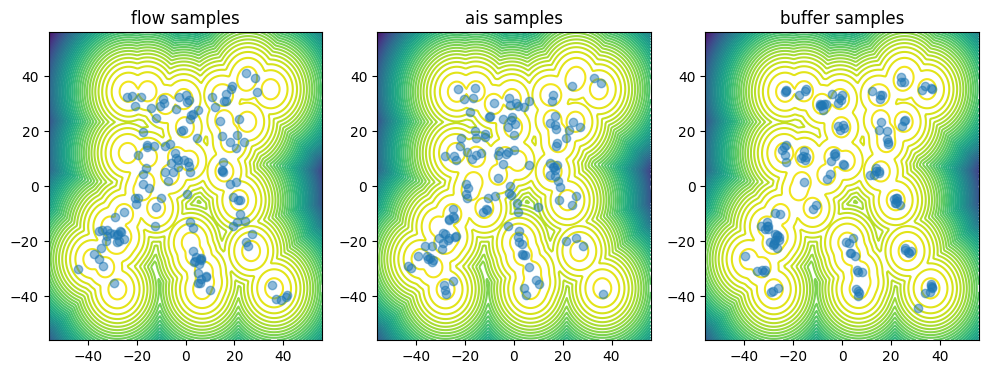

loss: 8.854192733764648, ess base: 0.3803713917732239,ess ais: 0.1974720060825348:  67%|██████▋   | 2668/4000 [09:39<14:11,  1.56it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.003002166748047, ess base: 0.3887086510658264,ess ais: 0.22708797454833984:  67%|██████▋   | 2670/4000 [09:40<09:12,  2.41it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: inf, ess base: 0.4699244499206543,ess ais: 0.28879815340042114:  67%|██████▋   | 2674/4000 [09:40<05:32,  3.99it/s]               

nan loss in replay step


loss: 7.927887439727783, ess base: 0.4108632206916809,ess ais: 0.1988835483789444:  67%|██████▋   | 2678/4000 [09:41<04:48,  4.58it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.811376571655273, ess base: 0.4430801272392273,ess ais: 0.3172015845775604:  67%|██████▋   | 2683/4000 [09:42<04:48,  4.57it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.494169235229492, ess base: 0.35447028279304504,ess ais: 0.2435416430234909:  67%|██████▋   | 2687/4000 [09:43<04:42,  4.66it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.928478240966797, ess base: 0.40160292387008667,ess ais: 0.19527140259742737:  67%|██████▋   | 2689/4000 [09:44<04:41,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.6442365646362305, ess base: 0.349250465631485,ess ais: 0.16510601341724396:  67%|██████▋   | 2690/4000 [09:44<04:47,  4.56it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.34399700164795, ess base: 0.42392000555992126,ess ais: 0.2633924186229706:  67%|██████▋   | 2691/4000 [09:44<04:45,  4.59it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 13.221567153930664, ess base: 0.37677666544914246,ess ais: 0.2477845549583435:  67%|██████▋   | 2692/4000 [09:44<04:46,  4.57it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.942737102508545, ess base: 0.3457876443862915,ess ais: 0.1731041967868805:  67%|██████▋   | 2694/4000 [09:45<04:45,  4.58it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.4281463623046875, ess base: 0.40068909525871277,ess ais: 0.23637360334396362:  68%|██████▊   | 2701/4000 [09:46<04:46,  4.54it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.04101276397705, ess base: 0.4136401116847992,ess ais: 0.008751876652240753:  68%|██████▊   | 2703/4000 [09:47<04:43,  4.57it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.7371392250061035, ess base: 0.46876224875450134,ess ais: 0.2843179404735565:  68%|██████▊   | 2709/4000 [09:48<04:39,  4.62it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.722219467163086, ess base: 0.3677918612957001,ess ais: 0.14835792779922485:  68%|██████▊   | 2712/4000 [09:49<04:42,  4.57it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.208948135375977, ess base: 0.4831785261631012,ess ais: 0.30177587270736694:  68%|██████▊   | 2714/4000 [09:49<04:41,  4.57it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.658876419067383, ess base: 0.4803854525089264,ess ais: 0.26496148109436035:  68%|██████▊   | 2717/4000 [09:50<04:38,  4.61it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.912586688995361, ess base: 0.4226617217063904,ess ais: 0.16579078137874603:  68%|██████▊   | 2720/4000 [09:50<04:36,  4.63it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.4387712478637695, ess base: 0.4701060354709625,ess ais: 0.00796979945152998:  68%|██████▊   | 2723/4000 [09:51<04:32,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.703937530517578, ess base: 0.382595419883728,ess ais: 0.007874015718698502:  68%|██████▊   | 2724/4000 [09:51<04:30,  4.71it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.001429557800293, ess base: 0.36564791202545166,ess ais: 0.16989636421203613:  68%|██████▊   | 2725/4000 [09:51<04:23,  4.85it/s]

nan loss in replay step


loss: 10.404521942138672, ess base: 0.36426016688346863,ess ais: 0.22383160889148712:  68%|██████▊   | 2728/4000 [09:52<04:29,  4.72it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.524359703063965, ess base: 0.3950583040714264,ess ais: 0.22480550408363342:  68%|██████▊   | 2739/4000 [09:54<04:23,  4.78it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.780052185058594, ess base: 0.42212796211242676,ess ais: 0.2242584079504013:  68%|██████▊   | 2740/4000 [09:55<04:22,  4.79it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.828754425048828, ess base: 0.41904187202453613,ess ais: 0.16067756712436676:  69%|██████▊   | 2742/4000 [09:55<04:21,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.026466369628906, ess base: 0.4065232574939728,ess ais: 0.271727055311203:  69%|██████▊   | 2749/4000 [09:57<04:23,  4.74it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.652652263641357, ess base: 0.47548919916152954,ess ais: 0.29508668184280396:  69%|██████▉   | 2757/4000 [09:58<04:18,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.922489166259766, ess base: 0.4442366659641266,ess ais: 0.25046998262405396:  69%|██████▉   | 2760/4000 [09:59<04:19,  4.78it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.833218574523926, ess base: 0.4713899791240692,ess ais: 0.007874015718698502:  69%|██████▉   | 2764/4000 [10:00<04:27,  4.63it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.314478874206543, ess base: 0.4223334789276123,ess ais: 0.23231811821460724:  69%|██████▉   | 2769/4000 [10:01<04:24,  4.66it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.536890983581543, ess base: 0.3543344736099243,ess ais: 0.13079310953617096:  70%|██████▉   | 2780/4000 [10:03<04:22,  4.64it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.650532245635986, ess base: 0.3662666082382202,ess ais: 0.18034188449382782:  70%|██████▉   | 2788/4000 [10:05<04:20,  4.65it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: nan, ess base: 0.36573442816734314,ess ais: 0.13902723789215088:  70%|██████▉   | 2792/4000 [10:06<04:00,  5.01it/s]              

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.009513854980469, ess base: 0.4768357276916504,ess ais: 0.23644115030765533:  70%|██████▉   | 2797/4000 [10:07<04:10,  4.80it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.914631366729736, ess base: 0.4153258800506592,ess ais: 0.1590753197669983:  70%|██████▉   | 2798/4000 [10:07<04:12,  4.76it/s] 

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.301040649414062, ess base: 0.38653361797332764,ess ais: 0.17585177719593048:  70%|███████   | 2802/4000 [10:08<03:58,  5.02it/s]

nan loss in replay step
nan loss in replay step


loss: 8.82837200164795, ess base: 0.4830152094364166,ess ais: 0.2637937366962433:  70%|███████   | 2803/4000 [10:08<04:03,  4.91it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.225311279296875, ess base: 0.35130739212036133,ess ais: 0.18679246306419373:  70%|███████   | 2804/4000 [10:08<04:07,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.451717376708984, ess base: 0.41898611187934875,ess ais: 0.007874015718698502:  70%|███████   | 2805/4000 [10:08<04:10,  4.77it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.416507720947266, ess base: 0.33184173703193665,ess ais: 0.1655801385641098:  70%|███████   | 2807/4000 [10:09<04:12,  4.73it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.134988784790039, ess base: 0.35957032442092896,ess ais: 0.1637621521949768:  70%|███████   | 2812/4000 [10:10<04:15,  4.64it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.774637699127197, ess base: 0.2998104989528656,ess ais: 0.07790837436914444:  70%|███████   | 2815/4000 [10:11<04:15,  4.63it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.992859363555908, ess base: 0.4329337477684021,ess ais: 0.262530654668808:  70%|███████   | 2816/4000 [10:11<04:14,  4.64it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.854272842407227, ess base: 0.37890148162841797,ess ais: 0.1764436662197113:  70%|███████   | 2817/4000 [10:11<04:13,  4.67it/s]

3 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.245923042297363, ess base: 0.3686961829662323,ess ais: 0.19512218236923218:  70%|███████   | 2820/4000 [10:12<04:13,  4.65it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.368778228759766, ess base: 0.39325153827667236,ess ais: 0.17367111146450043:  71%|███████   | 2822/4000 [10:12<04:12,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.598325252532959, ess base: 0.5015433430671692,ess ais: 0.31387418508529663:  71%|███████   | 2823/4000 [10:12<04:12,  4.66it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.732409954071045, ess base: 0.4405469596385956,ess ais: 0.22190159559249878:  71%|███████   | 2829/4000 [10:14<04:08,  4.71it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.084003448486328, ess base: 0.3184872567653656,ess ais: 0.15309537947177887:  71%|███████   | 2832/4000 [10:14<04:14,  4.58it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.186767578125, ess base: 0.44877833127975464,ess ais: 0.25204724073410034:  71%|███████   | 2833/4000 [10:14<04:17,  4.54it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.475897789001465, ess base: 0.42147403955459595,ess ais: 0.12572339177131653:  71%|███████   | 2835/4000 [10:15<04:10,  4.66it/s] 

nan grad norm in replay step


loss: 7.232848167419434, ess base: 0.4437234699726105,ess ais: 0.24055315554141998:  71%|███████   | 2836/4000 [10:15<04:01,  4.83it/s] 

nan loss in replay step


loss: 7.525331497192383, ess base: 0.42310166358947754,ess ais: 0.21430261433124542:  71%|███████   | 2841/4000 [10:16<04:08,  4.66it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.295602798461914, ess base: 0.4065662920475006,ess ais: 0.18129703402519226:  71%|███████   | 2842/4000 [10:16<04:00,  4.82it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.130350112915039, ess base: 0.40191715955734253,ess ais: 0.2018604427576065:  71%|███████   | 2845/4000 [10:17<04:04,  4.72it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.423057556152344, ess base: 0.4216200113296509,ess ais: 0.24835677444934845:  71%|███████▏  | 2851/4000 [10:18<04:04,  4.70it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.678200721740723, ess base: 0.43695008754730225,ess ais: 0.2983279526233673:  71%|███████▏  | 2855/4000 [10:19<04:00,  4.76it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.179061889648438, ess base: 0.3599448502063751,ess ais: 0.16334575414657593:  71%|███████▏  | 2859/4000 [10:20<04:01,  4.72it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.452949523925781, ess base: 0.41521599888801575,ess ais: 0.22391942143440247:  72%|███████▏  | 2860/4000 [10:20<04:00,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.812412261962891, ess base: 0.35240334272384644,ess ais: 0.1705053448677063:  72%|███████▏  | 2864/4000 [10:21<04:00,  4.71it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.061175346374512, ess base: 0.40156111121177673,ess ais: 0.23171232640743256:  72%|███████▏  | 2867/4000 [10:22<04:05,  4.61it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.158086776733398, ess base: 0.3678424656391144,ess ais: 0.12782512605190277:  72%|███████▏  | 2873/4000 [10:23<04:00,  4.69it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.196037292480469, ess base: 0.331075519323349,ess ais: 0.1745854765176773:  72%|███████▏  | 2880/4000 [10:24<04:03,  4.61it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 26.77142906188965, ess base: 0.4400941729545593,ess ais: 0.22145742177963257:  72%|███████▏  | 2883/4000 [10:25<04:05,  4.56it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.077553749084473, ess base: 0.4299203157424927,ess ais: 0.2360123246908188:  72%|███████▏  | 2891/4000 [10:27<04:05,  4.52it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.460016250610352, ess base: 0.39435386657714844,ess ais: 0.17713935673236847:  73%|███████▎  | 2902/4000 [10:29<03:47,  4.82it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.541676044464111, ess base: 0.36902207136154175,ess ais: 0.17296326160430908:  73%|███████▎  | 2904/4000 [10:30<03:53,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.606247901916504, ess base: 0.41043543815612793,ess ais: 0.23874682188034058:  73%|███████▎  | 2906/4000 [10:30<03:56,  4.62it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.387918472290039, ess base: 0.40301504731178284,ess ais: 0.2589467167854309:  73%|███████▎  | 2911/4000 [10:31<03:50,  4.72it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.095462799072266, ess base: 0.39855828881263733,ess ais: 0.2079799920320511:  73%|███████▎  | 2912/4000 [10:31<03:52,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.790104866027832, ess base: 0.40030455589294434,ess ais: 0.2054297775030136:  73%|███████▎  | 2914/4000 [10:32<03:50,  4.71it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.819409370422363, ess base: 0.3965388238430023,ess ais: 0.2512952387332916:  73%|███████▎  | 2916/4000 [10:32<03:49,  4.73it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.68796157836914, ess base: 0.4447018504142761,ess ais: 0.21442212164402008:  73%|███████▎  | 2918/4000 [10:33<03:49,  4.72it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.705377578735352, ess base: 0.2948204278945923,ess ais: 0.03844499960541725:  73%|███████▎  | 2919/4000 [10:33<03:50,  4.70it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.781774520874023, ess base: 0.45177018642425537,ess ais: 0.3096081018447876:  73%|███████▎  | 2937/4000 [10:37<03:51,  4.60it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9198431968688965, ess base: 0.45286083221435547,ess ais: 0.25206178426742554:  74%|███████▎  | 2940/4000 [10:37<03:46,  4.69it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.159161567687988, ess base: 0.42821669578552246,ess ais: 0.007874015718698502:  74%|███████▎  | 2941/4000 [10:38<03:46,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.219779014587402, ess base: 0.4282456636428833,ess ais: 0.2424083799123764:  74%|███████▎  | 2942/4000 [10:38<03:38,  4.84it/s]   

nan loss in replay step
nan loss in replay step


loss: 8.087056159973145, ess base: 0.3984564244747162,ess ais: 0.22674566507339478:  74%|███████▎  | 2944/4000 [10:38<03:31,  4.99it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.982382774353027, ess base: 0.4431653618812561,ess ais: 0.31799182295799255:  74%|███████▎  | 2947/4000 [10:39<03:35,  4.89it/s]

nan loss in replay step


loss: 8.500062942504883, ess base: 0.39813217520713806,ess ais: 0.2167472094297409:  74%|███████▎  | 2948/4000 [10:39<03:36,  4.85it/s]

nan grad norm in replay step


loss: inf, ess base: 0.45137590169906616,ess ais: 0.2530360519886017:  74%|███████▎  | 2949/4000 [10:39<03:32,  4.95it/s]              

nan loss in replay step


loss: inf, ess base: 0.40003788471221924,ess ais: 0.2371402084827423:  74%|███████▍  | 2951/4000 [10:40<03:36,  4.84it/s]            

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.183180809020996, ess base: 0.3171910047531128,ess ais: 0.008473897352814674:  74%|███████▍  | 2952/4000 [10:40<03:32,  4.94it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.254814147949219, ess base: 0.4037540555000305,ess ais: 0.24803701043128967:  74%|███████▍  | 2954/4000 [10:40<03:34,  4.89it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.028478622436523, ess base: 0.35489654541015625,ess ais: 0.1727486401796341:  74%|███████▍  | 2956/4000 [10:41<03:43,  4.67it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.685870170593262, ess base: 0.38059791922569275,ess ais: 0.1701839715242386:  74%|███████▍  | 2957/4000 [10:41<03:37,  4.79it/s]

nan loss in replay step


loss: 8.122490882873535, ess base: 0.3701660931110382,ess ais: 0.18260681629180908:  74%|███████▍  | 2959/4000 [10:41<03:33,  4.87it/s]

nan loss in replay step


loss: 10.681429862976074, ess base: 0.4573097229003906,ess ais: 0.26108720898628235:  74%|███████▍  | 2961/4000 [10:42<03:30,  4.94it/s]

nan loss in replay step


loss: 8.063508987426758, ess base: 0.459133505821228,ess ais: 0.2924158275127411:  74%|███████▍  | 2963/4000 [10:42<03:26,  5.01it/s]   

nan loss in replay step


loss: 8.321050643920898, ess base: 0.3985246419906616,ess ais: 0.15620020031929016:  74%|███████▍  | 2966/4000 [10:43<03:31,  4.89it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.482057571411133, ess base: 0.41597580909729004,ess ais: 0.2157842218875885:  74%|███████▍  | 2970/4000 [10:43<03:30,  4.90it/s] 

nan loss in replay step


loss: 8.091536521911621, ess base: 0.46753039956092834,ess ais: 0.2903997600078583:  74%|███████▍  | 2972/4000 [10:44<03:34,  4.80it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.4518592655658722,ess ais: 0.19946441054344177:  74%|███████▍  | 2973/4000 [10:44<03:28,  4.92it/s]              

nan loss in replay step


loss: inf, ess base: 0.3929474651813507,ess ais: 0.218370720744133:  74%|███████▍  | 2976/4000 [10:45<03:34,  4.77it/s]               

nan loss in replay step


loss: 7.8070478439331055, ess base: 0.4597214460372925,ess ais: 0.20502202212810516:  74%|███████▍  | 2978/4000 [10:45<03:31,  4.84it/s]

nan loss in replay step
nan loss in replay step


loss: 8.218729972839355, ess base: 0.3706349730491638,ess ais: 0.12425762414932251:  75%|███████▍  | 2981/4000 [10:46<03:34,  4.75it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.43407854437828064,ess ais: 0.2757225036621094:  75%|███████▍  | 2982/4000 [10:46<03:31,  4.80it/s]              

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.755700588226318, ess base: 0.3753940463066101,ess ais: 0.1792406588792801:  75%|███████▍  | 2985/4000 [10:47<03:26,  4.91it/s]  

nan loss in replay step


loss: inf, ess base: 0.4339182376861572,ess ais: 0.20859988033771515:  75%|███████▍  | 2986/4000 [10:47<03:22,  5.00it/s]             

nan loss in replay step


loss: 7.871641635894775, ess base: 0.40441593527793884,ess ais: 0.21690940856933594:  75%|███████▍  | 2988/4000 [10:47<03:29,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.39268621802330017,ess ais: 0.007812567055225372:  75%|███████▍  | 2989/4000 [10:47<03:17,  5.11it/s]             

nan loss in replay step
nan loss in replay step
nan loss in replay step


loss: 7.620663642883301, ess base: 0.3610411286354065,ess ais: 0.007874015718698502:  75%|███████▍  | 2991/4000 [10:48<03:21,  5.01it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 15.7747802734375, ess base: 0.40976014733314514,ess ais: 0.24911609292030334:  75%|███████▍  | 2992/4000 [10:48<03:23,  4.95it/s] 

nan grad norm in replay step


loss: inf, ess base: 0.4101177453994751,ess ais: 0.234449565410614:  75%|███████▍  | 2994/4000 [10:48<03:17,  5.10it/s]                

nan loss in replay step
nan loss in replay step


loss: 8.733358383178711, ess base: 0.38788697123527527,ess ais: 0.129475936293602:  75%|███████▍  | 2995/4000 [10:49<03:24,  4.91it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 29.00327491760254, ess base: 0.39443570375442505,ess ais: 0.17096221446990967:  75%|███████▍  | 2996/4000 [10:49<03:19,  5.04it/s]

nan loss in replay step


loss: 8.732937812805176, ess base: 0.4421536326408386,ess ais: 0.06502098590135574:  75%|███████▍  | 2998/4000 [10:49<03:26,  4.86it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.144113540649414, ess base: 0.3800203800201416,ess ais: 0.21200497448444366:  75%|███████▍  | 2999/4000 [10:49<03:23,  4.92it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.88054084777832, ess base: 0.3951997458934784,ess ais: 0.19815997779369354:  75%|███████▌  | 3002/4000 [10:50<03:32,  4.69it/s]  

nan loss in replay step


loss: inf, ess base: 0.4205097556114197,ess ais: 0.21382059156894684:  75%|███████▌  | 3007/4000 [10:51<03:21,  4.93it/s]               

nan loss in replay step
nan loss in replay step


loss: inf, ess base: 0.36078447103500366,ess ais: 0.17616790533065796:  75%|███████▌  | 3009/4000 [10:52<03:17,  5.02it/s]             

nan loss in replay step


loss: inf, ess base: 0.46714240312576294,ess ais: 0.33727797865867615:  75%|███████▌  | 3011/4000 [10:52<03:14,  5.10it/s]             

nan loss in replay step


loss: 7.534371376037598, ess base: 0.3903653919696808,ess ais: 0.18637074530124664:  75%|███████▌  | 3015/4000 [10:53<03:22,  4.85it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.028924942016602, ess base: 0.43439820408821106,ess ais: 0.28955432772636414:  75%|███████▌  | 3016/4000 [10:53<03:16,  5.02it/s]

nan loss in replay step


loss: 7.505465030670166, ess base: 0.4135732650756836,ess ais: 0.25612470507621765:  75%|███████▌  | 3018/4000 [10:53<03:13,  5.07it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: inf, ess base: 0.47869569063186646,ess ais: 0.2684478163719177:  76%|███████▌  | 3020/4000 [10:54<03:13,  5.07it/s]              

nan loss in replay step


loss: 12.426546096801758, ess base: 0.4097348749637604,ess ais: 0.23892226815223694:  76%|███████▌  | 3022/4000 [10:54<03:18,  4.93it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.24804973602295, ess base: 0.34432289004325867,ess ais: 0.17089949548244476:  76%|███████▌  | 3023/4000 [10:54<03:15,  4.99it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 13.683045387268066, ess base: 0.3214840888977051,ess ais: 0.10542429983615875:  76%|███████▌  | 3026/4000 [10:55<03:26,  4.72it/s]

nan grad norm in replay step


loss: 8.23736572265625, ess base: 0.46897318959236145,ess ais: 0.28144747018814087:  76%|███████▌  | 3029/4000 [10:56<03:17,  4.91it/s] 

nan loss in replay step
nan loss in replay step


loss: 7.288304805755615, ess base: 0.5144358277320862,ess ais: 0.3385959565639496:  76%|███████▌  | 3031/4000 [10:56<03:12,  5.02it/s]  

nan loss in replay step


loss: inf, ess base: 0.42674264311790466,ess ais: 0.22394229471683502:  76%|███████▌  | 3032/4000 [10:56<03:08,  5.13it/s]            

nan loss in replay step


loss: 7.89031457901001, ess base: 0.4492364227771759,ess ais: 0.2193230241537094:  76%|███████▌  | 3035/4000 [10:57<03:10,  5.06it/s]  

nan loss in replay step


loss: 7.759490489959717, ess base: 0.4777207374572754,ess ais: 0.268729567527771:  76%|███████▌  | 3037/4000 [10:57<03:09,  5.10it/s]  

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.4742484986782074,ess ais: 0.2677049934864044:  76%|███████▌  | 3041/4000 [10:58<03:11,  5.02it/s]                

nan loss in replay step


loss: 8.829508781433105, ess base: 0.3826414942741394,ess ais: 0.17357121407985687:  76%|███████▌  | 3043/4000 [10:58<03:10,  5.02it/s]

nan loss in replay step


loss: inf, ess base: 0.4539836347103119,ess ais: 0.30881139636039734:  76%|███████▌  | 3044/4000 [10:59<03:07,  5.10it/s]              

nan loss in replay step


loss: 8.457396507263184, ess base: 0.4355968236923218,ess ais: 0.2609013319015503:  76%|███████▌  | 3047/4000 [10:59<03:10,  5.00it/s] 

nan loss in replay step
2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.762197494506836, ess base: 0.43391063809394836,ess ais: 0.24474698305130005:  76%|███████▌  | 3049/4000 [11:00<03:13,  4.91it/s]

nan loss in replay step
nan loss in replay step


loss: 8.194437026977539, ess base: 0.45072242617607117,ess ais: 0.28587836027145386:  76%|███████▋  | 3052/4000 [11:00<03:08,  5.03it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.611301422119141, ess base: 0.42259299755096436,ess ais: 0.28639668226242065:  76%|███████▋  | 3054/4000 [11:01<03:07,  5.05it/s]

nan loss in replay step


loss: 7.702216148376465, ess base: 0.4161176383495331,ess ais: 0.20883886516094208:  76%|███████▋  | 3056/4000 [11:01<03:13,  4.88it/s] 

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.4502355456352234,ess ais: 0.20101121068000793:  76%|███████▋  | 3057/4000 [11:01<03:08,  4.99it/s]              

nan loss in replay step


loss: 7.788632392883301, ess base: 0.397419273853302,ess ais: 0.15175838768482208:  76%|███████▋  | 3059/4000 [11:02<03:13,  4.86it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.22269365191459656,ess ais: 0.027569573372602463:  77%|███████▋  | 3062/4000 [11:02<03:03,  5.12it/s]             

nan loss in replay step
nan loss in replay step


loss: inf, ess base: 0.36399996280670166,ess ais: 0.1273353546857834:  77%|███████▋  | 3065/4000 [11:03<03:25,  4.56it/s]               

nan loss in replay step


loss: 8.572477340698242, ess base: 0.29004988074302673,ess ais: 0.09323478490114212:  77%|███████▋  | 3067/4000 [11:03<03:12,  4.84it/s]

nan loss in replay step
nan loss in replay step


loss: 8.266624450683594, ess base: 0.45681899785995483,ess ais: 0.24946849048137665:  77%|███████▋  | 3069/4000 [11:04<03:08,  4.94it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.995478630065918, ess base: 0.49787527322769165,ess ais: 0.31603512167930603:  77%|███████▋  | 3071/4000 [11:04<03:09,  4.91it/s]

nan grad norm in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.44153231382369995,ess ais: 0.18284231424331665:  77%|███████▋  | 3073/4000 [11:05<03:11,  4.84it/s]              

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.942776679992676, ess base: 0.3602134883403778,ess ais: 0.10094175487756729:  77%|███████▋  | 3075/4000 [11:05<03:08,  4.92it/s] 

nan loss in replay step


loss: inf, ess base: 0.44323766231536865,ess ais: 0.2513660192489624:  77%|███████▋  | 3078/4000 [11:06<03:07,  4.92it/s]               

nan loss in replay step


loss: 8.014132499694824, ess base: 0.3982020914554596,ess ais: 0.1688915640115738:  77%|███████▋  | 3080/4000 [11:06<03:04,  4.98it/s] 

nan loss in replay step


loss: 8.091360092163086, ess base: 0.5188243389129639,ess ais: 0.2579132616519928:  77%|███████▋  | 3084/4000 [11:07<03:00,  5.06it/s] 

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.943305969238281, ess base: 0.420675128698349,ess ais: 0.21743428707122803:  77%|███████▋  | 3085/4000 [11:07<02:58,  5.12it/s]

nan loss in replay step


loss: inf, ess base: 0.3487650454044342,ess ais: 0.10334060341119766:  77%|███████▋  | 3088/4000 [11:08<02:57,  5.15it/s]               

nan loss in replay step
nan loss in replay step


loss: 10.026420593261719, ess base: 0.3874814212322235,ess ais: 0.18425224721431732:  77%|███████▋  | 3089/4000 [11:08<02:54,  5.21it/s]

nan loss in replay step


loss: 8.75124740600586, ess base: 0.45870640873908997,ess ais: 0.2656753957271576:  77%|███████▋  | 3091/4000 [11:08<02:52,  5.26it/s]  

nan loss in replay step
nan loss in replay step


loss: 7.786374092102051, ess base: 0.38684412837028503,ess ais: 0.24509546160697937:  77%|███████▋  | 3094/4000 [11:09<02:58,  5.06it/s]

nan loss in replay step


loss: 28.813199996948242, ess base: 0.37647807598114014,ess ais: 0.10659308731555939:  77%|███████▋  | 3098/4000 [11:10<03:06,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.848373413085938, ess base: 0.37301966547966003,ess ais: 0.11428315192461014:  77%|███████▋  | 3099/4000 [11:10<03:06,  4.84it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.668701171875, ess base: 0.38106563687324524,ess ais: 0.20923210680484772:  78%|███████▊  | 3103/4000 [11:11<03:06,  4.80it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.852045059204102, ess base: 0.34717535972595215,ess ais: 0.12608571350574493:  78%|███████▊  | 3109/4000 [11:12<03:05,  4.81it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.575784683227539, ess base: 0.45494410395622253,ess ais: 0.21704480051994324:  78%|███████▊  | 3110/4000 [11:12<03:05,  4.79it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


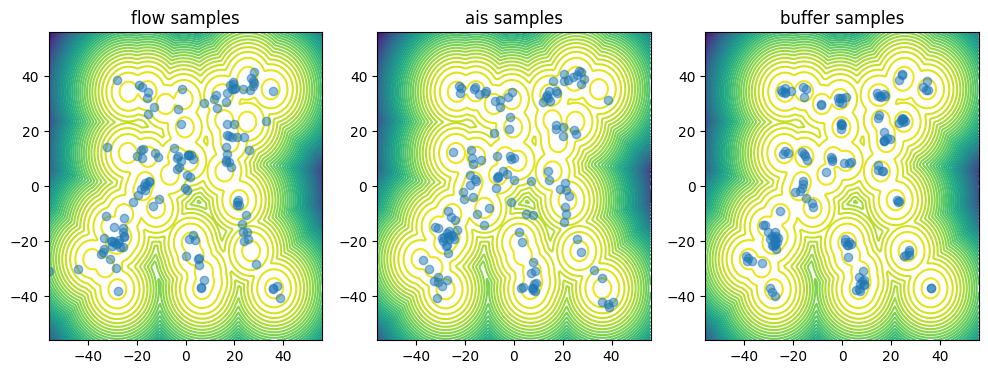

loss: 7.506856918334961, ess base: 0.40424129366874695,ess ais: 0.2308419942855835:  78%|███████▊  | 3128/4000 [11:18<03:01,  4.79it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.46214771270752, ess base: 0.4623015522956848,ess ais: 0.2591484785079956:  78%|███████▊  | 3130/4000 [11:18<02:55,  4.97it/s]  

nan loss in replay step


loss: 7.3812150955200195, ess base: 0.414928674697876,ess ais: 0.2270675152540207:  78%|███████▊  | 3132/4000 [11:19<02:49,  5.12it/s]

nan loss in replay step
nan loss in replay step


loss: inf, ess base: 0.47991594672203064,ess ais: 0.22613924741744995:  78%|███████▊  | 3133/4000 [11:19<02:49,  5.11it/s]            

nan loss in replay step


loss: 7.831428527832031, ess base: 0.42557159066200256,ess ais: 0.2678753137588501:  79%|███████▊  | 3149/4000 [11:22<03:05,  4.58it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.312570571899414, ess base: 0.43250495195388794,ess ais: 0.24454787373542786:  79%|███████▉  | 3150/4000 [11:23<03:05,  4.59it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.093733787536621, ess base: 0.440719336271286,ess ais: 0.23392082750797272:  79%|███████▉  | 3159/4000 [11:24<02:57,  4.74it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.253239631652832, ess base: 0.3339070677757263,ess ais: 0.1368888020515442:  79%|███████▉  | 3163/4000 [11:25<02:55,  4.77it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.215023040771484, ess base: 0.41572412848472595,ess ais: 0.28221672773361206:  79%|███████▉  | 3169/4000 [11:27<02:53,  4.78it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.891542434692383, ess base: 0.40881916880607605,ess ais: 0.24755966663360596:  79%|███████▉  | 3172/4000 [11:27<02:49,  4.87it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.346963882446289, ess base: 0.44035574793815613,ess ais: 0.24755361676216125:  79%|███████▉  | 3174/4000 [11:28<02:47,  4.93it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.535508155822754, ess base: 0.4117920696735382,ess ais: 0.19403114914894104:  79%|███████▉  | 3177/4000 [11:28<02:50,  4.82it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.4670987129211426,ess ais: 0.2698661983013153:  79%|███████▉  | 3179/4000 [11:29<02:48,  4.86it/s]               

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.3534713089466095,ess ais: 0.07404545694589615:  80%|███████▉  | 3182/4000 [11:29<02:52,  4.73it/s]              

nan loss in replay step


loss: 8.451891899108887, ess base: 0.4723356366157532,ess ais: 0.2633327543735504:  80%|███████▉  | 3184/4000 [11:30<02:49,  4.82it/s] 

nan loss in replay step


loss: inf, ess base: 0.41373059153556824,ess ais: 0.26975637674331665:  80%|███████▉  | 3187/4000 [11:30<02:47,  4.87it/s]                   

nan grad norm in replay step
nan loss in replay step


loss: 7.304327964782715, ess base: 0.40638864040374756,ess ais: 0.19492055475711823:  80%|███████▉  | 3188/4000 [11:31<02:49,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.887231826782227, ess base: 0.4453500807285309,ess ais: 0.26325398683547974:  80%|███████▉  | 3190/4000 [11:31<02:47,  4.84it/s] 

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.581527233123779, ess base: 0.4759678542613983,ess ais: 0.26714736223220825:  80%|███████▉  | 3192/4000 [11:31<02:44,  4.90it/s]

nan loss in replay step


loss: inf, ess base: 0.46108222007751465,ess ais: 0.2109980285167694:  80%|███████▉  | 3194/4000 [11:32<02:42,  4.97it/s]               

nan loss in replay step


loss: 7.722277641296387, ess base: 0.45578256249427795,ess ais: 0.20148254930973053:  80%|███████▉  | 3197/4000 [11:32<02:42,  4.93it/s]

nan loss in replay step


loss: 15.510528564453125, ess base: 0.44389697909355164,ess ais: 0.22722387313842773:  80%|███████▉  | 3199/4000 [11:33<02:46,  4.81it/s]

nan grad norm in replay step


loss: 8.633289337158203, ess base: 0.4433986246585846,ess ais: 0.17059192061424255:  80%|████████  | 3200/4000 [11:33<02:47,  4.76it/s]  

nan grad norm in replay step


loss: inf, ess base: 0.4411904513835907,ess ais: 0.23608772456645966:  80%|████████  | 3202/4000 [11:33<02:44,  4.85it/s]              

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.357236862182617, ess base: 0.44022977352142334,ess ais: 0.24107132852077484:  80%|████████  | 3205/4000 [11:34<02:42,  4.89it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.545785903930664, ess base: 0.402879923582077,ess ais: 0.19749946892261505:  80%|████████  | 3207/4000 [11:34<02:43,  4.85it/s]  

nan loss in replay step


loss: 9.336490631103516, ess base: 0.40247610211372375,ess ais: 0.18775992095470428:  80%|████████  | 3210/4000 [11:35<02:40,  4.92it/s] 

nan loss in replay step


loss: 7.737614631652832, ess base: 0.3436373174190521,ess ais: 0.15640294551849365:  80%|████████  | 3213/4000 [11:36<02:44,  4.78it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.33963146805763245,ess ais: 0.11003263294696808:  80%|████████  | 3215/4000 [11:36<02:40,  4.89it/s]               

nan loss in replay step


loss: 7.813947677612305, ess base: 0.4491073191165924,ess ais: 0.05931129306554794:  80%|████████  | 3217/4000 [11:37<02:37,  4.98it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.416330337524414, ess base: 0.40330666303634644,ess ais: 0.17420616745948792:  80%|████████  | 3218/4000 [11:37<02:40,  4.89it/s]

nan grad norm in replay step


loss: 7.424255847930908, ess base: 0.2899024188518524,ess ais: 0.04204845055937767:  80%|████████  | 3219/4000 [11:37<02:36,  4.98it/s] 

nan loss in replay step
nan loss in replay step


loss: 7.630575180053711, ess base: 0.4110660254955292,ess ais: 0.007874015718698502:  81%|████████  | 3221/4000 [11:37<02:38,  4.93it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.035842895507812, ess base: 0.5092180371284485,ess ais: 0.3440089523792267:  81%|████████  | 3222/4000 [11:38<02:34,  5.03it/s]  

nan loss in replay step


loss: 7.697196006774902, ess base: 0.4084853529930115,ess ais: 0.20334379374980927:  81%|████████  | 3223/4000 [11:38<02:32,  5.08it/s]

nan loss in replay step


loss: inf, ess base: 0.43474656343460083,ess ais: 0.23435738682746887:  81%|████████  | 3224/4000 [11:38<02:31,  5.13it/s]             

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.637385368347168, ess base: 0.4029957354068756,ess ais: 0.15943947434425354:  81%|████████  | 3226/4000 [11:38<02:37,  4.93it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.138530731201172, ess base: 0.3402002155780792,ess ais: 0.18563464283943176:  81%|████████  | 3229/4000 [11:39<02:42,  4.75it/s] 

nan grad norm in replay step


loss: 8.369791030883789, ess base: 0.4407375156879425,ess ais: 0.2754950225353241:  81%|████████  | 3231/4000 [11:39<02:44,  4.69it/s] 

nan loss in replay step


loss: inf, ess base: 0.5044848322868347,ess ais: 0.31978821754455566:  81%|████████  | 3233/4000 [11:40<02:40,  4.76it/s]             

nan loss in replay step


loss: 8.013837814331055, ess base: 0.44583839178085327,ess ais: 0.2537040114402771:  81%|████████  | 3237/4000 [11:41<02:34,  4.93it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.764347553253174, ess base: 0.4263949990272522,ess ais: 0.23376227915287018:  81%|████████  | 3240/4000 [11:41<02:33,  4.96it/s] 

nan loss in replay step


loss: 8.096168518066406, ess base: 0.398792564868927,ess ais: 0.0078125:  81%|████████  | 3241/4000 [11:41<02:34,  4.91it/s]           

nan grad norm in replay step
nan loss in replay step


loss: 7.810044765472412, ess base: 0.4348893165588379,ess ais: 0.2083699256181717:  81%|████████  | 3243/4000 [11:42<02:28,  5.09it/s]

nan grad norm in replay step
nan loss in replay step


loss: 8.085840225219727, ess base: 0.5047459006309509,ess ais: 0.2877495288848877:  81%|████████  | 3244/4000 [11:42<02:32,  4.96it/s]

nan grad norm in replay step


loss: 7.965658664703369, ess base: 0.4157944321632385,ess ais: 0.2256336361169815:  81%|████████  | 3246/4000 [11:42<02:30,  5.02it/s]

nan loss in replay step


loss: inf, ess base: 0.39417749643325806,ess ais: 0.2829725444316864:  81%|████████▏ | 3250/4000 [11:43<02:26,  5.11it/s]              

nan loss in replay step
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.756974220275879, ess base: 0.3515367805957794,ess ais: 0.14143192768096924:  81%|████████▏ | 3255/4000 [11:44<02:40,  4.65it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.068007469177246, ess base: 0.4053567349910736,ess ais: 0.20740091800689697:  81%|████████▏ | 3257/4000 [11:45<02:38,  4.70it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.090460777282715, ess base: 0.35885855555534363,ess ais: 0.23847098648548126:  81%|████████▏ | 3258/4000 [11:45<02:36,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.015584945678711, ess base: 0.4537739157676697,ess ais: 0.30187687277793884:  82%|████████▏ | 3263/4000 [11:46<02:34,  4.77it/s] 

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.005288124084473, ess base: 0.44031432271003723,ess ais: 0.22874949872493744:  82%|████████▏ | 3264/4000 [11:46<02:35,  4.73it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.543110370635986, ess base: 0.4615931510925293,ess ais: 0.0078125:  82%|████████▏ | 3275/4000 [11:49<02:34,  4.68it/s]            

nan grad norm in replay step
nan loss in replay step


loss: 7.820155143737793, ess base: 0.38534945249557495,ess ais: 0.20791564881801605:  82%|████████▏ | 3282/4000 [11:50<02:29,  4.79it/s]

nan loss in replay step
nan loss in replay step


loss: 7.770975112915039, ess base: 0.4930209219455719,ess ais: 0.2770034372806549:  82%|████████▏ | 3287/4000 [11:51<02:20,  5.09it/s]  

nan loss in replay step
nan loss in replay step


loss: 7.6338605880737305, ess base: 0.4556453824043274,ess ais: 0.2757379412651062:  82%|████████▏ | 3288/4000 [11:51<02:22,  4.98it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.3331217765808105, ess base: 0.4998425245285034,ess ais: 0.29821208119392395:  82%|████████▏ | 3289/4000 [11:51<02:26,  4.84it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.477904319763184, ess base: 0.5146834850311279,ess ais: 0.33790186047554016:  82%|████████▏ | 3290/4000 [11:52<02:24,  4.92it/s] 

nan loss in replay step


loss: 8.328311920166016, ess base: 0.42900100350379944,ess ais: 0.2710034251213074:  82%|████████▎ | 3300/4000 [11:54<02:29,  4.67it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.66727066040039, ess base: 0.4611872136592865,ess ais: 0.2076476514339447:  83%|████████▎ | 3310/4000 [11:56<02:27,  4.69it/s]    

nan grad norm in replay step


loss: 7.58729362487793, ess base: 0.49130913615226746,ess ais: 0.007936508394777775:  83%|████████▎ | 3317/4000 [11:57<02:26,  4.67it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: inf, ess base: 0.3533255159854889,ess ais: 0.1866491734981537:  83%|████████▎ | 3319/4000 [11:58<02:18,  4.93it/s]                

nan loss in replay step
nan loss in replay step


loss: 7.527795791625977, ess base: 0.41876310110092163,ess ais: 0.20116253197193146:  83%|████████▎ | 3321/4000 [11:58<02:15,  5.02it/s]

nan loss in replay step
nan loss in replay step


loss: 7.779123306274414, ess base: 0.4566711485385895,ess ais: 0.24611328542232513:  83%|████████▎ | 3323/4000 [11:59<02:13,  5.07it/s] 

nan loss in replay step
nan loss in replay step


loss: 8.092194557189941, ess base: 0.41342175006866455,ess ais: 0.23590943217277527:  83%|████████▎ | 3324/4000 [11:59<02:17,  4.91it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.892385482788086, ess base: 0.4716949760913849,ess ais: 0.007874015718698502:  83%|████████▎ | 3325/4000 [11:59<02:21,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.522642135620117, ess base: 0.4492734670639038,ess ais: 0.2807159423828125:  83%|████████▎ | 3326/4000 [11:59<02:24,  4.67it/s]  

nan grad norm in replay step


loss: inf, ess base: 0.40409526228904724,ess ais: 0.2577861547470093:  83%|████████▎ | 3328/4000 [12:00<02:13,  5.02it/s]             

nan loss in replay step
nan loss in replay step
nan loss in replay step


loss: 11.440855979919434, ess base: 0.39703047275543213,ess ais: 0.1945771723985672:  83%|████████▎ | 3329/4000 [12:00<02:18,  4.85it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.137004852294922, ess base: 0.3615489900112152,ess ais: 0.18345077335834503:  83%|████████▎ | 3331/4000 [12:00<02:23,  4.67it/s]  

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.884507179260254, ess base: 0.42761147022247314,ess ais: 0.23052242398262024:  83%|████████▎ | 3333/4000 [12:01<02:23,  4.66it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.688933372497559, ess base: 0.37300729751586914,ess ais: 0.0678555965423584:  84%|████████▎ | 3340/4000 [12:02<02:24,  4.55it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9616570472717285, ess base: 0.39996394515037537,ess ais: 0.10707069933414459:  84%|████████▎ | 3342/4000 [12:03<02:22,  4.61it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.733563423156738, ess base: 0.45413100719451904,ess ais: 0.0078125:  84%|████████▎ | 3345/4000 [12:03<02:17,  4.76it/s]           

nan loss in replay step
nan loss in replay step


loss: 8.366798400878906, ess base: 0.32591184973716736,ess ais: 0.10145602375268936:  84%|████████▎ | 3347/4000 [12:04<02:16,  4.78it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.998442649841309, ess base: 0.41204699873924255,ess ais: 0.1451817899942398:  84%|████████▍ | 3360/4000 [12:07<02:17,  4.67it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.879227638244629, ess base: 0.3397640585899353,ess ais: 0.05971897020936012:  84%|████████▍ | 3363/4000 [12:07<02:16,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.009122848510742, ess base: 0.42756274342536926,ess ais: 0.26412394642829895:  84%|████████▍ | 3372/4000 [12:09<02:12,  4.74it/s]

nan loss in replay step
nan loss in replay step


loss: 7.5530595779418945, ess base: 0.42943495512008667,ess ais: 0.24057023227214813:  84%|████████▍ | 3374/4000 [12:10<02:07,  4.91it/s]

nan loss in replay step


loss: 7.831198692321777, ess base: 0.4882751405239105,ess ais: 0.2504071891307831:  85%|████████▍ | 3387/4000 [12:12<02:09,  4.74it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.986513137817383, ess base: 0.4485089182853699,ess ais: 0.3142983317375183:  85%|████████▍ | 3396/4000 [12:14<02:13,  4.51it/s]   

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.27889633178711, ess base: 0.4496338367462158,ess ais: 0.2783663868904114:  85%|████████▌ | 3400/4000 [12:15<02:03,  4.86it/s]   

nan loss in replay step
nan loss in replay step


loss: 8.685969092287452e+27, ess base: 0.3349922001361847,ess ais: 0.06567259877920151:  85%|████████▌ | 3403/4000 [12:16<02:00,  4.94it/s]

nan grad norm in replay step


loss: 9.355433464050293, ess base: 0.41745492815971375,ess ais: 0.21755073964595795:  85%|████████▌ | 3407/4000 [12:17<02:02,  4.85it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.972814559936523, ess base: 0.5078123211860657,ess ais: 0.2996287941932678:  85%|████████▌ | 3413/4000 [12:18<01:59,  4.89it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.882583618164062, ess base: 0.40988197922706604,ess ais: 0.2110789716243744:  85%|████████▌ | 3414/4000 [12:18<02:00,  4.88it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.101365089416504, ess base: 0.3293921649456024,ess ais: 0.10730855166912079:  86%|████████▌ | 3422/4000 [12:20<02:02,  4.73it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.026926040649414, ess base: 0.3199752867221832,ess ais: 0.13774839043617249:  86%|████████▌ | 3444/4000 [12:24<01:54,  4.85it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.35733699798584, ess base: 0.38454464077949524,ess ais: 0.20576298236846924:  86%|████████▋ | 3453/4000 [12:26<01:52,  4.87it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.598800182342529, ess base: 0.45280274748802185,ess ais: 0.23937183618545532:  86%|████████▋ | 3454/4000 [12:26<01:52,  4.86it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 15.644486427307129, ess base: 0.43036043643951416,ess ais: 0.19480904936790466:  87%|████████▋ | 3464/4000 [12:28<01:51,  4.80it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.221113204956055, ess base: 0.376110702753067,ess ais: 0.18122537434101105:  87%|████████▋ | 3467/4000 [12:29<01:51,  4.80it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.57133960723877, ess base: 0.3869248926639557,ess ais: 0.15323905646800995:  87%|████████▋ | 3473/4000 [12:30<01:51,  4.74it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.834509372711182, ess base: 0.4305781126022339,ess ais: 0.25246456265449524:  87%|████████▋ | 3476/4000 [12:31<01:50,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 346.1568908691406, ess base: 0.483294278383255,ess ais: 0.352689266204834:  87%|████████▋ | 3478/4000 [12:31<01:51,  4.67it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.456587791442871, ess base: 0.4443974494934082,ess ais: 0.008658736012876034:  87%|████████▋ | 3497/4000 [12:35<01:47,  4.68it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.621881484985352, ess base: 0.45931413769721985,ess ais: 0.28885358572006226:  88%|████████▊ | 3509/4000 [12:38<01:43,  4.74it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7043.36083984375, ess base: 0.4638567864894867,ess ais: 0.2763083577156067:  88%|████████▊ | 3531/4000 [12:43<01:40,  4.69it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.231675148010254, ess base: 0.33221694827079773,ess ais: 0.17234012484550476:  88%|████████▊ | 3532/4000 [12:43<01:37,  4.82it/s]

nan loss in replay step


loss: 7.765883445739746, ess base: 0.41554224491119385,ess ais: 0.0078125:  88%|████████▊ | 3534/4000 [12:43<01:35,  4.88it/s]          

nan loss in replay step
nan loss in replay step


loss: 7.267074108123779, ess base: 0.4544919431209564,ess ais: 0.2543603181838989:  88%|████████▊ | 3536/4000 [12:44<01:35,  4.87it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.900093078613281, ess base: 0.23229052126407623,ess ais: 0.14177532494068146:  88%|████████▊ | 3539/4000 [12:44<01:36,  4.79it/s]

nan loss in replay step


loss: 9.654107093811035, ess base: 0.4165991544723511,ess ais: 0.23296485841274261:  89%|████████▊ | 3541/4000 [12:45<01:33,  4.88it/s] 

nan loss in replay step
nan loss in replay step


loss: 7.556755542755127, ess base: 0.30975404381752014,ess ais: 0.07174267619848251:  89%|████████▊ | 3545/4000 [12:46<01:32,  4.94it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 8.14788818359375, ess base: 0.438564658164978,ess ais: 0.24322335422039032:  89%|████████▊ | 3548/4000 [12:46<01:35,  4.73it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.11109733581543, ess base: 0.4694305956363678,ess ais: 0.21116504073143005:  89%|████████▉ | 3553/4000 [12:47<01:35,  4.66it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.212403297424316, ess base: 0.4700061082839966,ess ais: 0.3017594814300537:  89%|████████▉ | 3554/4000 [12:48<01:35,  4.66it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


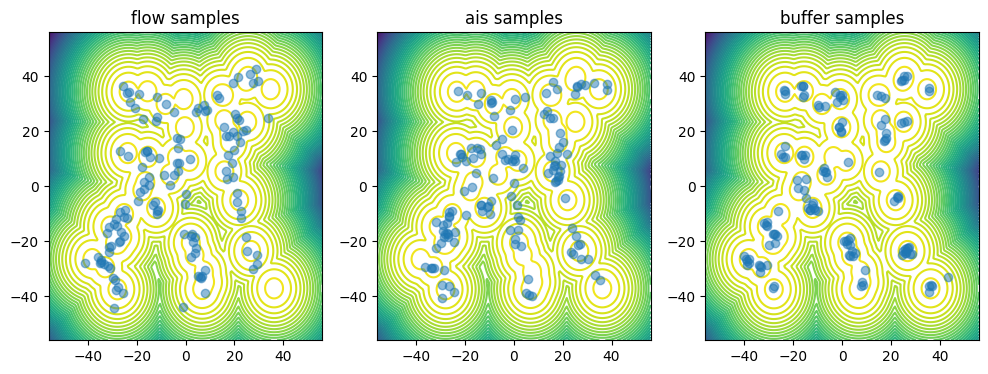

loss: 7.830825328826904, ess base: 0.4431340992450714,ess ais: 0.2761191427707672:  89%|████████▉ | 3562/4000 [12:51<01:54,  3.83it/s]   

nan loss in replay step
nan loss in replay step


loss: inf, ess base: 0.4255102276802063,ess ais: 0.24016731977462769:  89%|████████▉ | 3563/4000 [12:52<01:46,  4.11it/s]             

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.518965721130371, ess base: 0.35726723074913025,ess ais: 0.15191687643527985:  89%|████████▉ | 3564/4000 [12:52<01:39,  4.39it/s]

nan loss in replay step


loss: nan, ess base: 0.45117488503456116,ess ais: 0.0078125:  89%|████████▉ | 3565/4000 [12:52<01:37,  4.48it/s]                        

nan loss in replay step
nan loss in replay step


loss: 7.7053751945495605, ess base: 0.44086313247680664,ess ais: 0.10145504027605057:  89%|████████▉ | 3571/4000 [12:53<01:38,  4.36it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.800980567932129, ess base: 0.39410534501075745,ess ais: 0.15433119237422943:  89%|████████▉ | 3576/4000 [12:55<01:57,  3.59it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.462691307067871, ess base: 0.44579988718032837,ess ais: 0.32086846232414246:  89%|████████▉ | 3579/4000 [12:56<01:40,  4.17it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.834997177124023, ess base: 0.4791041612625122,ess ais: 0.28827300667762756:  90%|████████▉ | 3580/4000 [12:56<01:38,  4.27it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.393810272216797, ess base: 0.47932758927345276,ess ais: 0.3364545702934265:  90%|████████▉ | 3593/4000 [12:59<01:29,  4.57it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.012710571289062, ess base: 0.4274548590183258,ess ais: 0.23803949356079102:  90%|████████▉ | 3599/4000 [13:00<01:29,  4.49it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.835630416870117, ess base: 0.43292853236198425,ess ais: 0.2867888808250427:  90%|█████████ | 3600/4000 [13:00<01:28,  4.51it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.770819187164307, ess base: 0.4260079562664032,ess ais: 0.22360938787460327:  90%|█████████ | 3607/4000 [13:02<01:26,  4.55it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.243430137634277, ess base: 0.3656821846961975,ess ais: 0.16189801692962646:  90%|█████████ | 3609/4000 [13:02<01:24,  4.62it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 11.650575637817383, ess base: 0.4383239448070526,ess ais: 0.007936508394777775:  91%|█████████ | 3622/4000 [13:05<01:20,  4.68it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.393542289733887, ess base: 0.33634278178215027,ess ais: 0.007874015718698502:  91%|█████████ | 3635/4000 [13:08<01:17,  4.71it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.288000106811523, ess base: 0.4223608374595642,ess ais: 0.1806151121854782:  91%|█████████ | 3637/4000 [13:08<01:12,  4.99it/s]   

nan loss in replay step
nan loss in replay step


loss: 9.12086296081543, ess base: 0.45400261878967285,ess ais: 0.2107422947883606:  91%|█████████ | 3638/4000 [13:09<01:10,  5.11it/s]

nan loss in replay step


loss: 8.673812866210938, ess base: 0.4395028352737427,ess ais: 0.20963256061077118:  91%|█████████ | 3641/4000 [13:09<01:11,  5.00it/s]

nan loss in replay step


loss: inf, ess base: 0.401578426361084,ess ais: 0.2077130526304245:  91%|█████████ | 3642/4000 [13:09<01:12,  4.94it/s]                

nan loss in replay step


loss: 7.88472318649292, ess base: 0.3969540596008301,ess ais: 0.26001548767089844:  91%|█████████ | 3645/4000 [13:10<01:11,  4.97it/s]  

nan loss in replay step


loss: 8.31151294708252, ess base: 0.4473012387752533,ess ais: 0.2389453947544098:  91%|█████████ | 3648/4000 [13:11<01:13,  4.81it/s]  

nan grad norm in replay step


loss: 9.237857818603516, ess base: 0.36406391859054565,ess ais: 0.15345154702663422:  91%|█████████ | 3649/4000 [13:11<01:13,  4.78it/s]

nan grad norm in replay step


loss: 8.563671112060547, ess base: 0.31022533774375916,ess ais: 0.07195306569337845:  91%|█████████▏| 3652/4000 [13:11<01:11,  4.90it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: inf, ess base: 0.3881586194038391,ess ais: 0.18437159061431885:  91%|█████████▏| 3656/4000 [13:12<01:10,  4.90it/s]               

nan loss in replay step


loss: 7.622322082519531, ess base: 0.4302407503128052,ess ais: 0.22690188884735107:  91%|█████████▏| 3657/4000 [13:13<01:11,  4.81it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.590272426605225, ess base: 0.5601989030838013,ess ais: 0.42289644479751587:  91%|█████████▏| 3659/4000 [13:13<01:10,  4.84it/s]

nan loss in replay step


loss: 7.981480121612549, ess base: 0.4156346619129181,ess ais: 0.20856599509716034:  92%|█████████▏| 3661/4000 [13:13<01:11,  4.77it/s]

nan grad norm in replay step


loss: 5.188711522124084e+22, ess base: 0.46525731682777405,ess ais: 0.2488953322172165:  92%|█████████▏| 3662/4000 [13:14<01:10,  4.81it/s]

nan grad norm in replay step


loss: 2.906826590844279e+31, ess base: 0.4386378228664398,ess ais: 0.19453418254852295:  92%|█████████▏| 3663/4000 [13:14<01:11,  4.69it/s]

nan grad norm in replay step


loss: 7.929380893707275, ess base: 0.4611615538597107,ess ais: 0.23099714517593384:  92%|█████████▏| 3665/4000 [13:14<01:11,  4.68it/s]    

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.917024612426758, ess base: 0.49226897954940796,ess ais: 0.2661011219024658:  92%|█████████▏| 3666/4000 [13:14<01:12,  4.63it/s]

nan grad norm in replay step


loss: 8.491096496582031, ess base: 0.410304456949234,ess ais: 0.2509605288505554:  92%|█████████▏| 3667/4000 [13:15<01:10,  4.70it/s]  

nan grad norm in replay step


loss: 9.875726699829102, ess base: 0.40627753734588623,ess ais: 0.12215021252632141:  92%|█████████▏| 3670/4000 [13:15<01:09,  4.75it/s]

nan grad norm in replay step


loss: 8.237215995788574, ess base: 0.3504522740840912,ess ais: 0.10184922069311142:  92%|█████████▏| 3673/4000 [13:16<01:08,  4.80it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step


loss: 7.926172256469727, ess base: 0.4248652756214142,ess ais: 0.23628966510295868:  92%|█████████▏| 3678/4000 [13:17<01:08,  4.73it/s]

nan grad norm in replay step


loss: 1.5237607182301135e+19, ess base: 0.4981033205986023,ess ais: 0.29180908203125:  92%|█████████▏| 3680/4000 [13:17<01:08,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan grad norm in replay step


loss: 11.902754783630371, ess base: 0.4235767126083374,ess ais: 0.18496552109718323:  92%|█████████▏| 3684/4000 [13:18<01:06,  4.75it/s] 

nan loss in replay step


loss: inf, ess base: 0.3332449197769165,ess ais: 0.10655158758163452:  92%|█████████▏| 3690/4000 [13:20<01:06,  4.65it/s]               

1 nan/inf samples/log-probs/log-weights encountered at chain init.
nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.4578423500061035, ess base: 0.483022540807724,ess ais: 0.2519128620624542:  92%|█████████▏| 3695/4000 [13:21<01:04,  4.75it/s]  

nan grad norm in replay step


loss: 8.589323043823242, ess base: 0.4697551727294922,ess ais: 0.2807425260543823:  92%|█████████▏| 3696/4000 [13:21<01:03,  4.75it/s]

nan grad norm in replay step


loss: 9.077058792114258, ess base: 0.42235487699508667,ess ais: 0.21445511281490326:  92%|█████████▎| 3700/4000 [13:22<01:02,  4.79it/s]

nan grad norm in replay step


loss: 7.38995361328125, ess base: 0.3950384855270386,ess ais: 0.1655074805021286:  93%|█████████▎| 3701/4000 [13:22<01:00,  4.97it/s]   

nan loss in replay step


loss: 1.601471901899874e+34, ess base: 0.4007427990436554,ess ais: 0.17671865224838257:  93%|█████████▎| 3703/4000 [13:22<01:00,  4.92it/s]

nan grad norm in replay step


loss: 9.083667755126953, ess base: 0.46564558148384094,ess ais: 0.3045879304409027:  93%|█████████▎| 3720/4000 [13:26<00:59,  4.69it/s]    

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.378789901733398, ess base: 0.4104214906692505,ess ais: 0.20184974372386932:  93%|█████████▎| 3722/4000 [13:26<01:00,  4.59it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.675826549530029, ess base: 0.4893149137496948,ess ais: 0.3217555582523346:  93%|█████████▎| 3724/4000 [13:27<00:59,  4.66it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 9.105377197265625, ess base: 0.348935604095459,ess ais: 0.14363379776477814:  94%|█████████▎| 3746/4000 [13:31<00:53,  4.75it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.28497314453125, ess base: 0.408029705286026,ess ais: 0.23184260725975037:  94%|█████████▍| 3757/4000 [13:34<00:50,  4.81it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.358620643615723, ess base: 0.4337310194969177,ess ais: 0.22061429917812347:  94%|█████████▍| 3766/4000 [13:36<00:49,  4.75it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.417588233947754, ess base: 0.5063138008117676,ess ais: 0.31205621361732483:  94%|█████████▍| 3768/4000 [13:36<00:48,  4.77it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 10.27755355834961, ess base: 0.4310653507709503,ess ais: 0.25023114681243896:  94%|█████████▍| 3772/4000 [13:37<00:47,  4.75it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.193595886230469, ess base: 0.4073024392127991,ess ais: 0.2563033998012543:  95%|█████████▍| 3782/4000 [13:39<00:44,  4.89it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.180852890014648, ess base: 0.48318150639533997,ess ais: 0.24887427687644958:  95%|█████████▍| 3784/4000 [13:39<00:44,  4.90it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.366142272949219, ess base: 0.4205537736415863,ess ais: 0.2780110239982605:  95%|█████████▍| 3793/4000 [13:41<00:43,  4.73it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.622973442077637, ess base: 0.43727853894233704,ess ais: 0.23211711645126343:  95%|█████████▌| 3800/4000 [13:43<00:42,  4.67it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.605524063110352, ess base: 0.42236047983169556,ess ais: 0.20263497531414032:  95%|█████████▌| 3811/4000 [13:45<00:41,  4.57it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.132987976074219, ess base: 0.40175068378448486,ess ais: 0.18698236346244812:  96%|█████████▌| 3824/4000 [13:48<00:38,  4.57it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.307501316070557, ess base: 0.426670640707016,ess ais: 0.26309484243392944:  96%|█████████▌| 3828/4000 [13:49<00:37,  4.60it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.593839645385742, ess base: 0.45524144172668457,ess ais: 0.2439325749874115:  96%|█████████▌| 3831/4000 [13:49<00:37,  4.48it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: nan, ess base: 0.3558197617530823,ess ais: 0.12591174244880676:  96%|█████████▌| 3834/4000 [13:50<00:35,  4.63it/s]              

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.024426460266113, ess base: 0.47432875633239746,ess ais: 0.2665662169456482:  96%|█████████▌| 3847/4000 [13:53<00:32,  4.64it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.9309844970703125, ess base: 0.46528634428977966,ess ais: 0.2919760048389435:  96%|█████████▋| 3855/4000 [13:55<00:31,  4.60it/s]

2 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.644102096557617, ess base: 0.41581031680107117,ess ais: 0.22344686090946198:  97%|█████████▋| 3868/4000 [13:57<00:28,  4.68it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.174535751342773, ess base: 0.4861913323402405,ess ais: 0.3355799913406372:  97%|█████████▋| 3874/4000 [13:59<00:28,  4.37it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.507308006286621, ess base: 0.3792887330055237,ess ais: 0.1740129292011261:  97%|█████████▋| 3883/4000 [14:01<00:29,  3.99it/s]  

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.6118316650390625, ess base: 0.4494766891002655,ess ais: 0.2125951647758484:  97%|█████████▋| 3885/4000 [14:01<00:27,  4.15it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.540631294250488, ess base: 0.43113240599632263,ess ais: 0.234501451253891:  97%|█████████▋| 3895/4000 [14:04<00:22,  4.68it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.640948295593262, ess base: 0.40828609466552734,ess ais: 0.22637441754341125:  98%|█████████▊| 3925/4000 [14:10<00:16,  4.57it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.368622779846191, ess base: 0.41218212246894836,ess ais: 0.20548290014266968:  98%|█████████▊| 3927/4000 [14:10<00:15,  4.60it/s]

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 8.151076316833496, ess base: 0.48227038979530334,ess ais: 0.2623679041862488:  98%|█████████▊| 3931/4000 [14:11<00:14,  4.66it/s] 

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.545261859893799, ess base: 0.343792200088501,ess ais: 0.007874015718698502: 100%|█████████▉| 3999/4000 [14:26<00:00,  4.54it/s]   

1 nan/inf samples/log-probs/log-weights encountered at chain init.


loss: 7.6468119621276855, ess base: 0.4052533507347107,ess ais: 0.22236637771129608: 100%|█████████▉| 3999/4000 [14:26<00:00,  4.54it/s]

nan loss in replay step
1 nan/inf samples/log-probs/log-weights encountered at chain init.
1 nan/inf samples/log-probs/log-weights encountered at chain init.


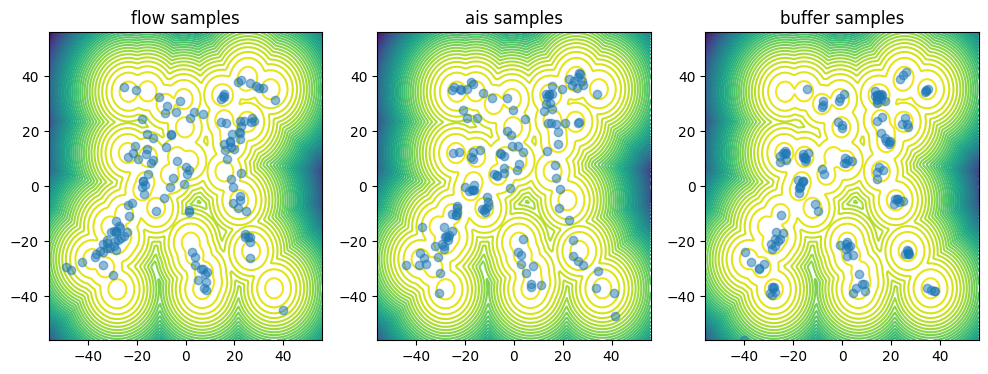

loss: 7.6468119621276855, ess base: 0.4052533507347107,ess ais: 0.22236637771129608: 100%|██████████| 4000/4000 [14:28<00:00,  4.60it/s]

Timelimit not set


In [9]:
# Now run!
trainer.run(n_iterations=n_iterations, batch_size=batch_size, n_plot=n_plots, \
            n_eval=n_eval, eval_batch_size=eval_batch_size, save=False)  # note that the progress bar during training prints ESS w.r.t p^2/q. 

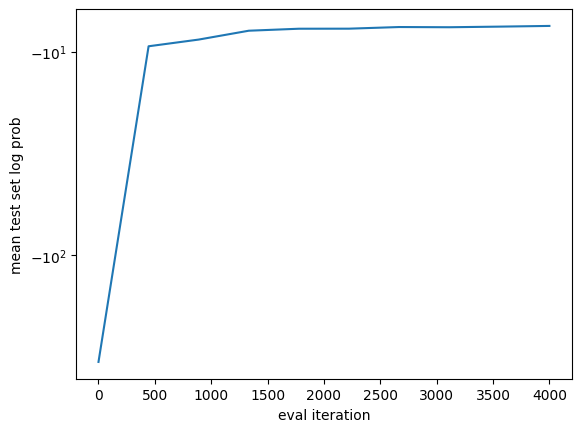

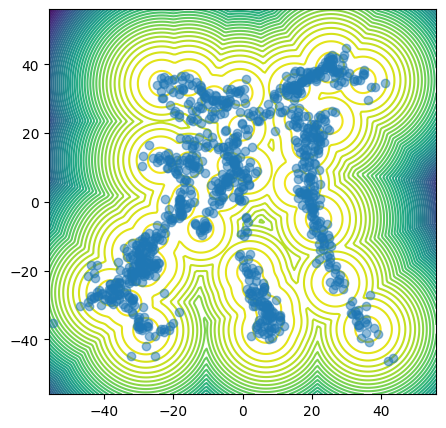

In [10]:
# Test set probability using samples from the target distribution.
eval_iters = np.linspace(0, n_iterations, n_eval)
plt.plot(eval_iters, logger.history['flow_test_set_mean_log_prob_p_target'])
plt.ylabel("mean test set log prob")
plt.xlabel("eval iteration")
plt.yscale("symlog")

fig, axs = plt.subplots(1, 1, figsize=(5, 5))
target.to("cpu")
plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs, n_contour_levels=50, grid_width_n_points=200)
target.to("cuda")

n_samples = 1000
samples_flow = fab_model.flow.sample((n_samples,)).detach()
plot_marginal_pair(samples_flow, ax=axs, bounds=plotting_bounds)

### Training a regular flow with Reverse KL

In [11]:
loss_type = "flow_reverse_kl" # can set to "target_foward_kl" for training by maximum likelihood of samples from the GMM target.

# Create flow using the same architecture.
flow = make_wrapped_normflow_realnvp(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = False)
optimizer = torch.optim.Adam(flow.parameters(), lr=lr)
logger = ListLogger(save=False) # save training history

# use GPU if available
if torch.cuda.is_available():
    flow.cuda()
    transition_operator.cuda()
    target.to("cuda")
    print(f"Running with GPU")

n_iterations = int(3*(n_iterations)) # Training the flow by KL minimisation is cheaper per iteration, so we run it for more iterations.

Running with GPU


In [12]:
reverse_kld_model = FABModel(flow=flow,
                     target_distribution=target,
                     n_intermediate_distributions=n_intermediate_distributions,
                     transition_operator=transition_operator,
                     loss_type=loss_type,
                     alpha=1.0)

def plot_flow_reverse_kld(fab_model, n_samples = 300):
    fig, axs = plt.subplots(1,1, figsize=(4, 4))
    target.to("cpu")
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs, n_contour_levels=50, grid_width_n_points=200)
    target.to("cuda")

    # plot flow samples
    samples_flow = fab_model.flow.sample((n_samples,))
    plot_marginal_pair(samples_flow, ax=axs, bounds=plotting_bounds)
    
    axs.set_title("flow samples")
    plt.show()
    return [fig]

In [13]:
trainer = Trainer(model=reverse_kld_model, optimizer=optimizer, logger=logger, plot=plot_flow_reverse_kld, max_gradient_norm=max_gradient_norm)

loss: 20.857933044433594:   0%|          | 0/12000 [00:00<?, ?it/s]

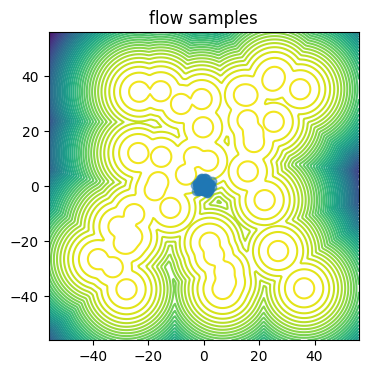

loss: 11.673823356628418:   0%|          | 53/12000 [00:03<09:57, 20.01it/s] 

nan loss encountered
nan loss encountered


loss: 23.84348487854004:   0%|          | 56/12000 [00:03<09:42, 20.49it/s] 

nan loss encountered


loss: 3.449298858642578:   5%|▌         | 638/12000 [00:37<10:03, 18.82it/s] 

nan loss encountered


loss: 2.6529479026794434:  11%|█         | 1332/12000 [01:17<09:58, 17.83it/s]

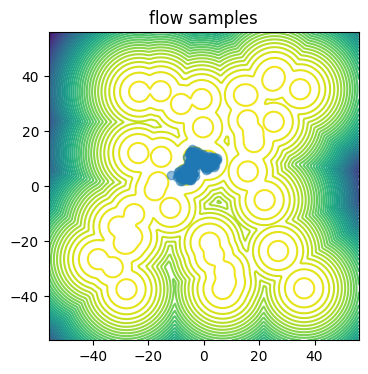

loss: 2.7318482398986816:  22%|██▏       | 2666/12000 [02:34<09:15, 16.80it/s]

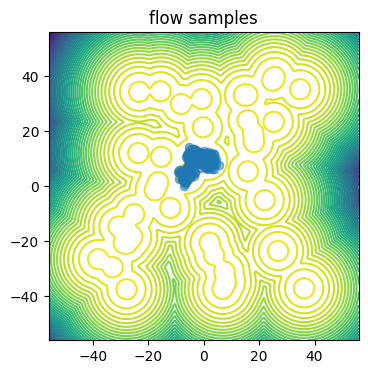

loss: 2.715087890625:  33%|███▎      | 3998/12000 [03:51<07:36, 17.53it/s]    

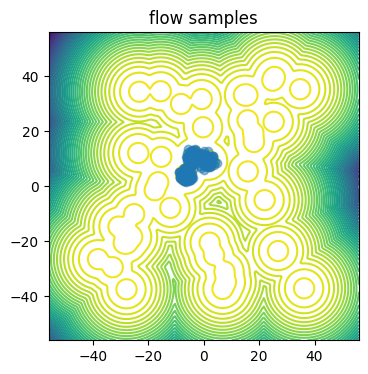

loss: 2.634469985961914:  44%|████▍     | 5332/12000 [05:09<06:19, 17.57it/s] 

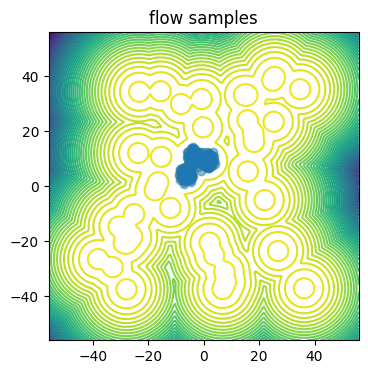

loss: 2.6465063095092773:  56%|█████▌    | 6666/12000 [06:25<05:01, 17.67it/s]

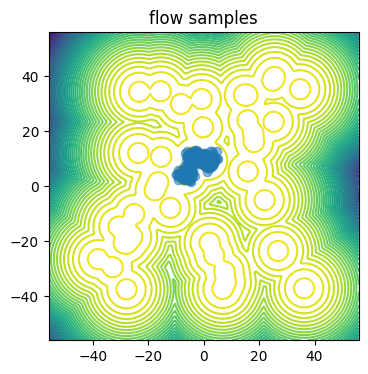

loss: 2.6903176307678223:  67%|██████▋   | 7998/12000 [07:42<03:43, 17.87it/s]

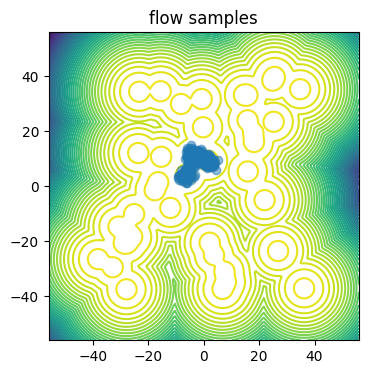

loss: 2.610562801361084:  78%|███████▊  | 9332/12000 [08:58<02:33, 17.43it/s] 

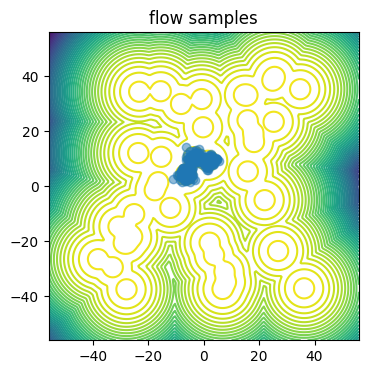

loss: 2.655935287475586:  89%|████████▉ | 10664/12000 [10:15<01:15, 17.64it/s] 

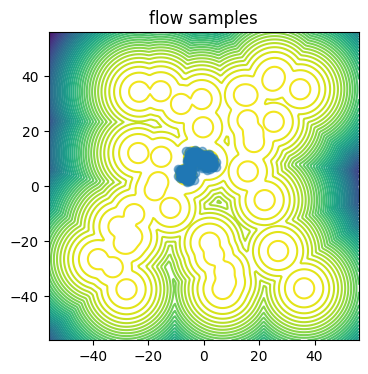

loss: 2.5986385345458984: 100%|█████████▉| 11998/12000 [11:32<00:00, 17.48it/s]

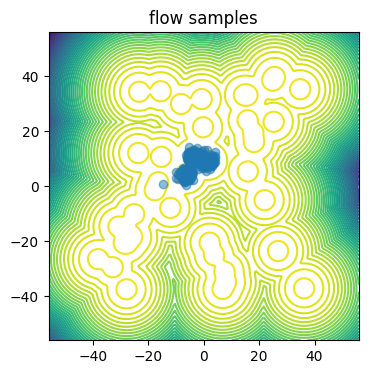

loss: 2.5986385345458984: 100%|██████████| 12000/12000 [11:33<00:00, 17.30it/s]

Timelimit not set


In [14]:
# Now run!
trainer.run(n_iterations=n_iterations, batch_size=batch_size, n_plot=n_plots, \
            n_eval=n_eval, eval_batch_size=eval_batch_size, save=False)

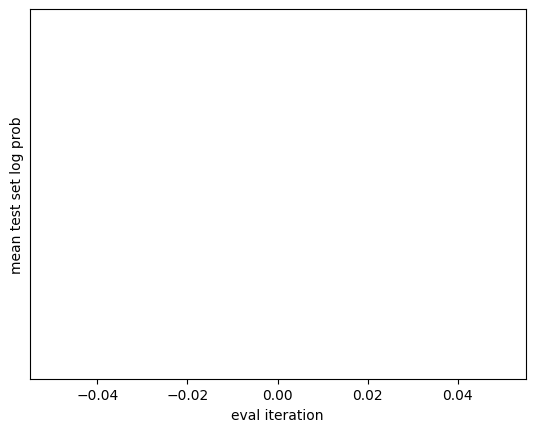

In [15]:
logger.history["flow_test_set_mean_log_prob"]
eval_iters = np.linspace(0, n_iterations, n_eval)
plt.plot(eval_iters, logger.history["flow_test_set_mean_log_prob"])
plt.ylabel("mean test set log prob")
plt.xlabel("eval iteration")
plt.yscale("symlog")